## Results needed:

Calibration curve for each detector

the efficiency as a function of energy,

and the absolute efficiency,

intrinsic efficiency,

and geometric factors as functions of angle.

You do not need to show every single spectra you obtained: a wise choice would be to include an example of a single fitted spectra for each detector, and include any other spectra you feel important in an appendix at the end of the report.

You should also include tables containing the fitted parameters and uncertainties in an append

# Step 1:

* Upload data
* Plot counts vs channels - counts in bins

In [420]:
#!pip install lmfit

In [421]:
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib notebook

In [422]:
def parse_spe_files(filename):
    IS_DATA = False
    headers = {}
    data = []

    current_key = None
    current_value_lines = []

    with open(filename) as file:
        for line in file:
            line = line.strip()

            # detect start of data section
            if line == "$DATA:":
                # save the last header value before switching
                if current_key is not None:
                    headers[current_key] = "\n".join(current_value_lines).strip()
                IS_DATA = True
                continue

            # handle header lines
            if not IS_DATA:
                if line.startswith("$"):
                    # save previous header (if exists)
                    if current_key is not None:
                        headers[current_key] = "\n".join(current_value_lines).strip()
                    
                    # start a new header
                    current_key = line.strip()
                    current_value_lines = []
                else:
                    current_value_lines.append(line)
            else:
                # inside data section
                if line.startswith("0 1023"):
                    continue
                try:
                    counts = float(line.strip())
                    data.append(counts)
                except ValueError:
                    # silently skip non-data lines
                    continue

    # in case file doesn’t end with $DATA:
    if not IS_DATA and current_key is not None:
        headers[current_key] = "\n".join(current_value_lines).strip()

    # build data dictionary
    channels = np.arange(len(data))
    counts = np.array(data)

    return headers, channels, counts

In [423]:
def counts_per_sec(counts, exposure_time):
    counts_per_sec = counts / exposure_time
    return counts_per_sec

In [424]:
def plot_spectra(bkg_file, file):
    headers, channels, counts = parse_spe_files(file)
    bkg_headers, bkg_channels, bkg_counts = parse_spe_files(bkg_file)
    
    meas_bkg = bkg_headers["$MEAS_TIM:"]
    time_bkg = meas_bkg.split(" ")
    bkg_exp_time = int(time_bkg[0])
    
    bkg_counts_per_sec = counts_per_sec(np.array(bkg_counts), bkg_exp_time)
    
    meas_time = headers["$MEAS_TIM:"]
    time = meas_time.split(" ")
    exposure_time = int(time[0])
    
    counts_sec = counts_per_sec(np.array(counts), exposure_time)
    
    counts_minus_bkg = (np.array(counts_sec) - np.array(bkg_counts_per_sec)).flatten()
    
    if "Am" in file:
        title = "$Am_{241}$"
        
    if "co" in file:
        title = "$Co_{60}$"
        
    if "Ba" in file:
        title = "$Ba_{133}$"
        
    if "Cs" in file:
        title = "$Cs_{137}$"
    
    fig, ax = plt.subplots(figsize=(9, 5))
    ax.plot(channels, counts_minus_bkg, label=f"{title} Spectrum")
    ax.set_title(f"{title} Spectrum BGO Detector")
    ax.set_xlabel("Channels")
    ax.set_ylabel("Counts/sec")
    plt.tight_layout()
    plt.show()
    
    return headers, channels, counts_sec, counts_minus_bkg

In [425]:
BGO_bkg_file = "BGO_Bck_10min.Spe"
BGO_Ba = "BGO_Ba_direct.Spe"

<IPython.core.display.Javascript object>


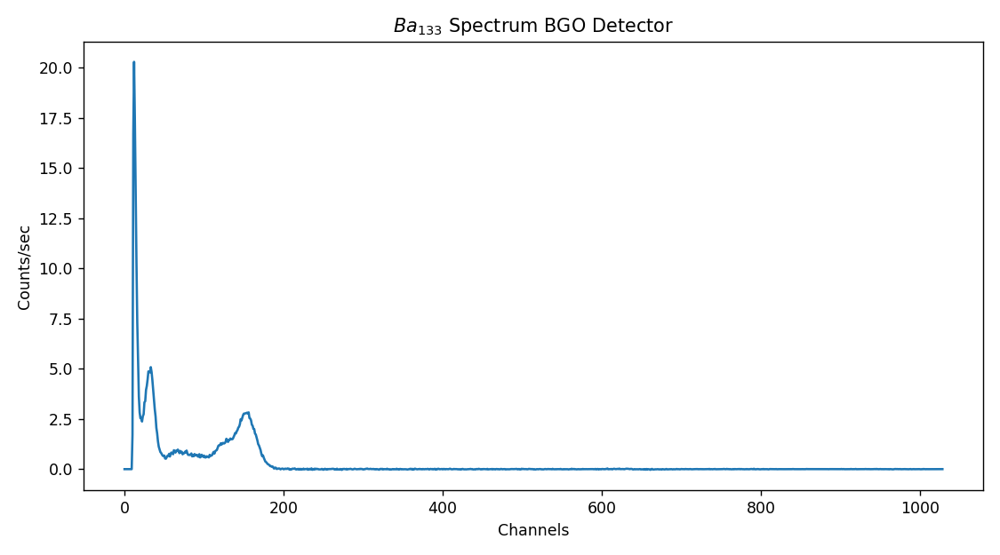

In [620]:
BGO_Ba_headers, BGO_Ba_channels, BGO_Ba_counts_sec, BGO_Ba_counts_minus_bkg = plot_spectra(BGO_bkg_file, BGO_Ba)

In [427]:
BGO_Co = "bgo-co60-000-20cm-u.Spe"

<IPython.core.display.Javascript object>


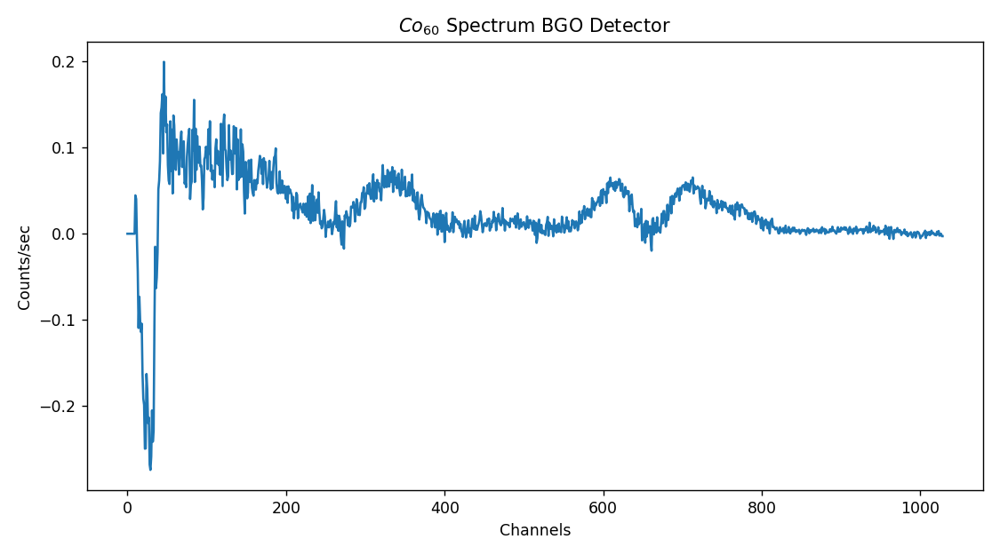

In [621]:
BGO_Co_headers, BGO_Co_channels, BGO_Co_counts_sec, BGO_Co_counts_minus_bkg = plot_spectra(BGO_bkg_file, BGO_Co)

In [429]:
BGO_Am = "BGO_Am_241_direct.Spe"

<IPython.core.display.Javascript object>


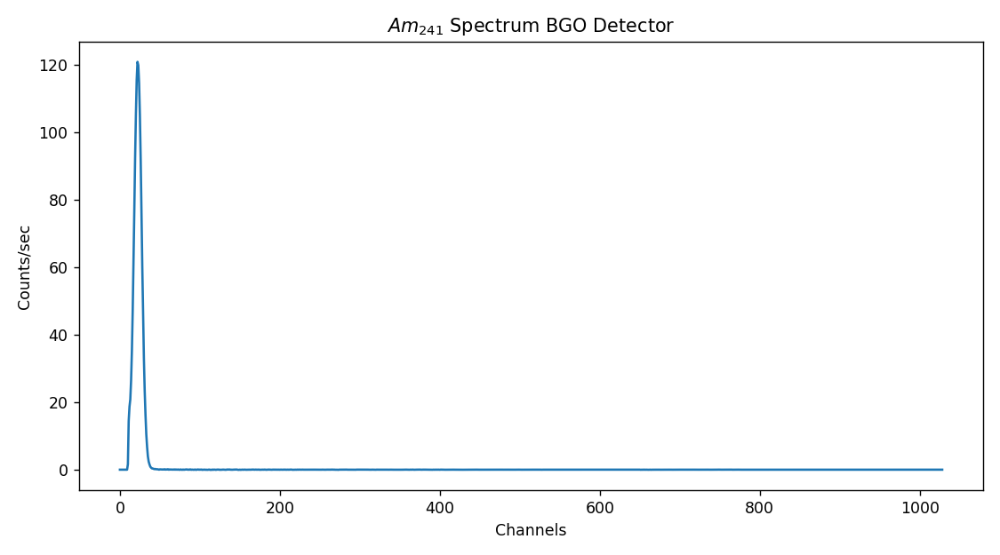

In [622]:
BGO_Am_headers, BGO_Am_channels, BGO_Am_counts_sec, BGO_Am_counts_minus_bkg = plot_spectra(BGO_bkg_file, BGO_Am)

<IPython.core.display.Javascript object>


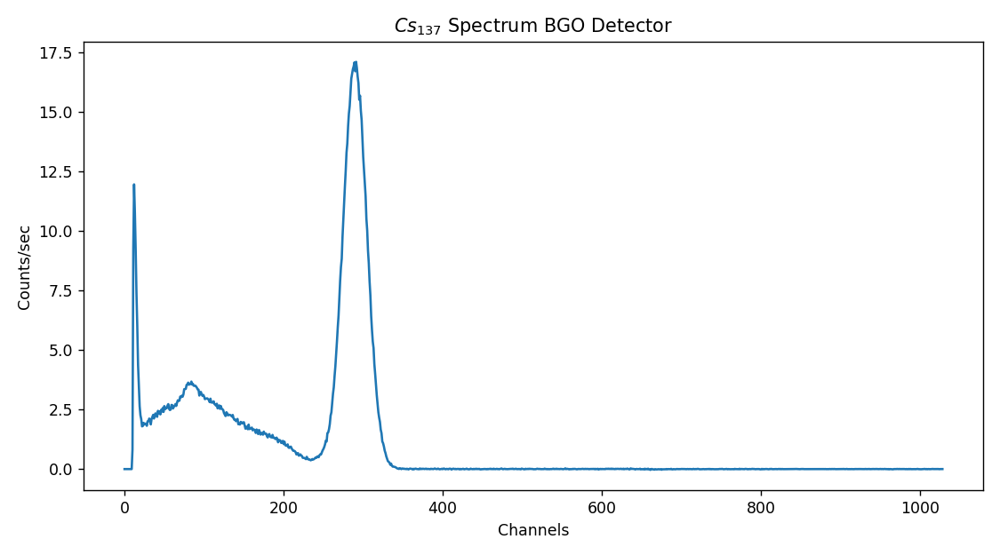

In [623]:
BGO_Cs = "BGO_Cs137_direct.Spe"
BGO_Cs_headers, BGO_Cs_channels, BGO_Cs_counts_sec, BGO_Cs_counts_minus_bkg = plot_spectra(BGO_bkg_file, BGO_Cs)

In [432]:
BGO_Am_0_deg = "BGO_Am_241_direct.Spe"
BGO_Am_15_deg = "BGO_Am_241_15deg.Spe"
BGO_Am_30_deg = "BGO_Am_241_30deg.Spe"
BGO_Am_45_deg = "BGO_Am_241_45deg.Spe"
BGO_Am_60_deg = "BGO_Am241_60deg.Spe"
BGO_Am_90_deg = "BGO_Am_241_90deg.Spe"

<IPython.core.display.Javascript object>


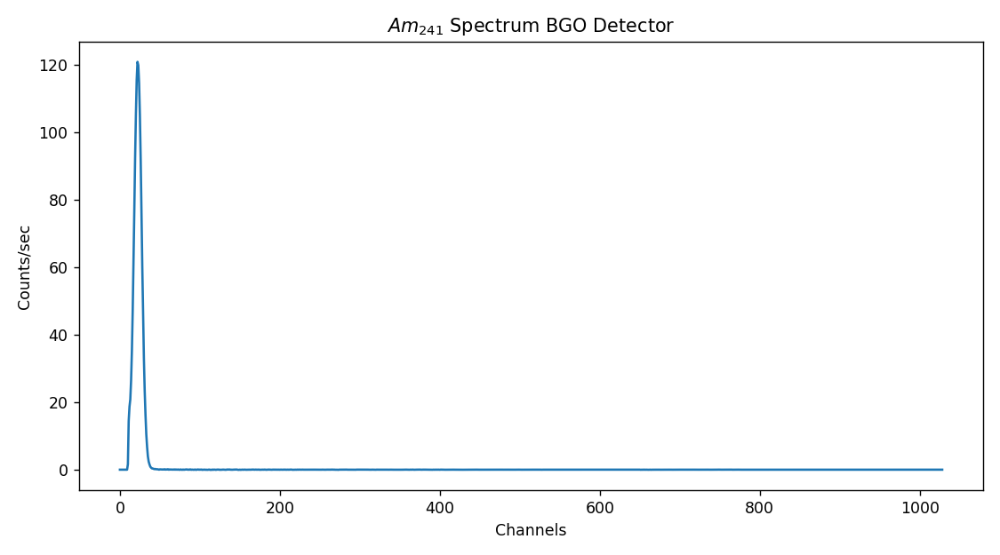

In [624]:
BGO_Am0_headers, BGO_Am0_channels, BGO_Am0_counts_sec, BGO_Am0_counts_minus_bkg = plot_spectra(BGO_bkg_file, BGO_Am_0_deg)

<IPython.core.display.Javascript object>


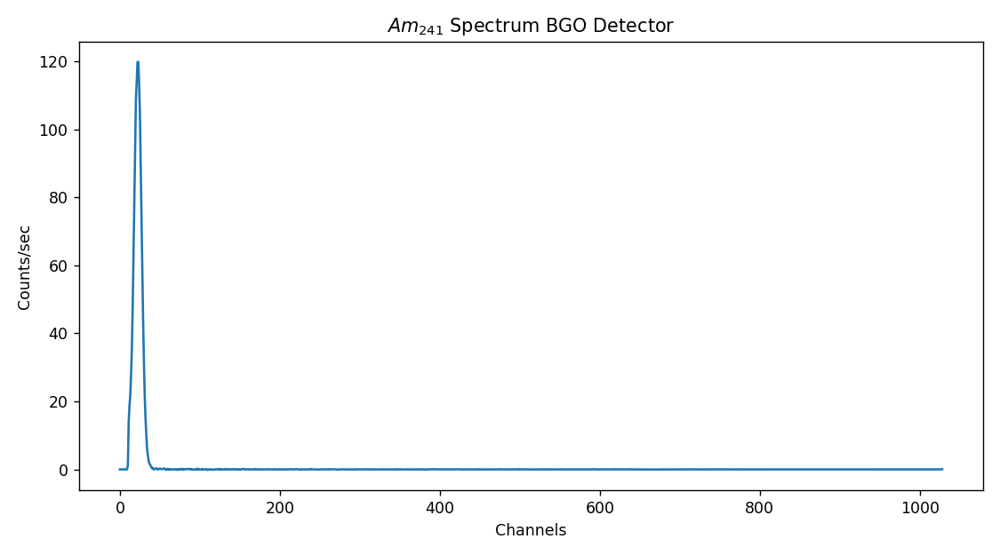

In [625]:
BGO_Am15_headers, BGO_Am15_channels, BGO_Am15_counts_sec, BGO_Am15_counts_minus_bkg = plot_spectra(BGO_bkg_file, BGO_Am_15_deg)

<IPython.core.display.Javascript object>


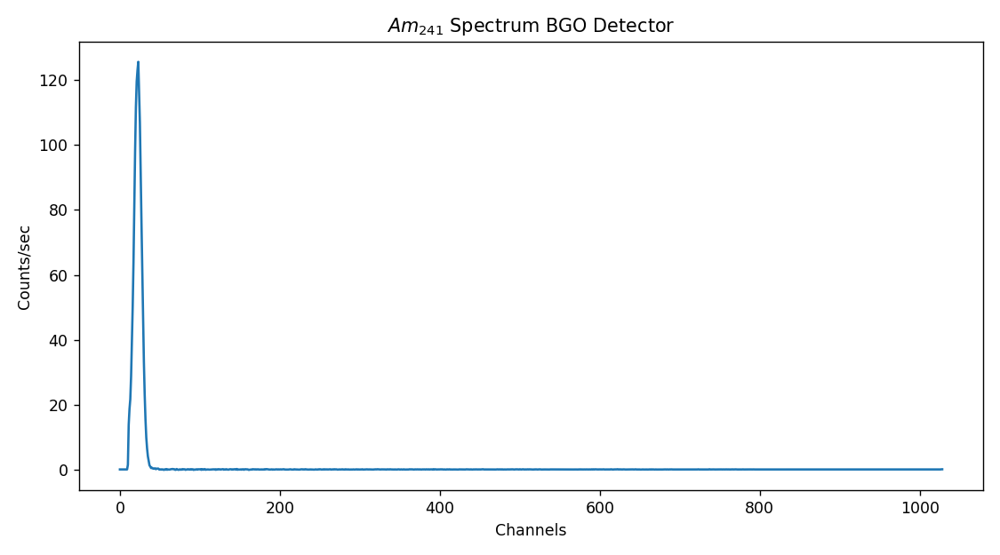

In [626]:
BGO_Am30_headers, BGO_Am30_channels, BGO_Am30_counts_sec, BGO_Am30_counts_minus_bkg = plot_spectra(BGO_bkg_file, BGO_Am_30_deg)

<IPython.core.display.Javascript object>


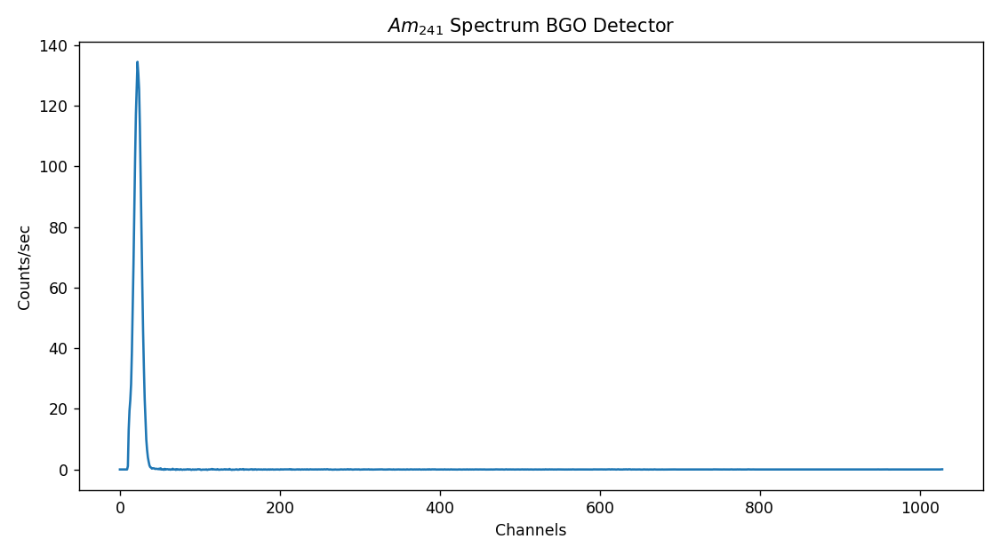

In [627]:
BGO_Am45_headers, BGO_Am45_channels, BGO_Am45_counts_sec, BGO_Am45_counts_minus_bkg = plot_spectra(BGO_bkg_file, BGO_Am_45_deg)

<IPython.core.display.Javascript object>


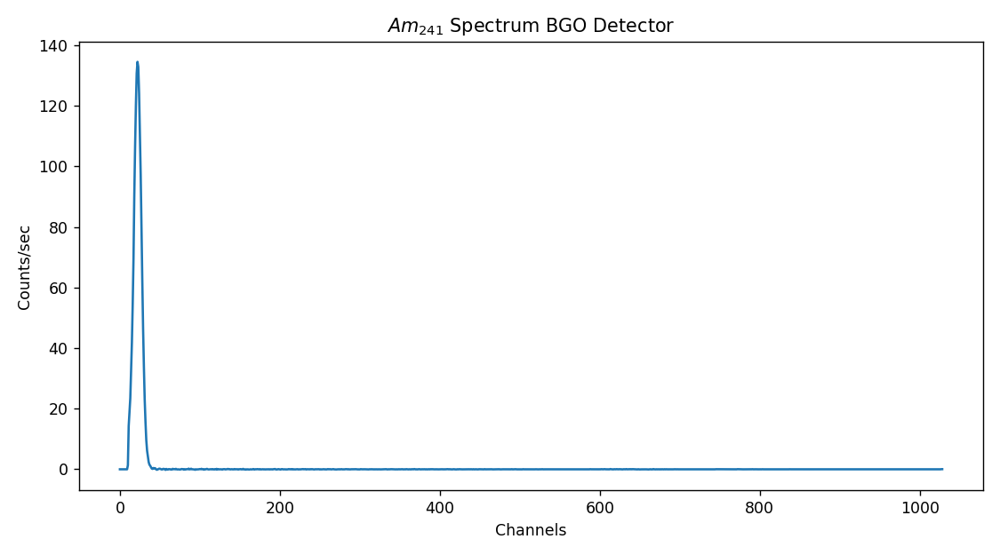

In [628]:
BGO_Am60_headers, BGO_Am60_channels, BGO_Am60_counts_sec, BGO_Am60_counts_minus_bkg = plot_spectra(BGO_bkg_file, BGO_Am_60_deg)

<IPython.core.display.Javascript object>


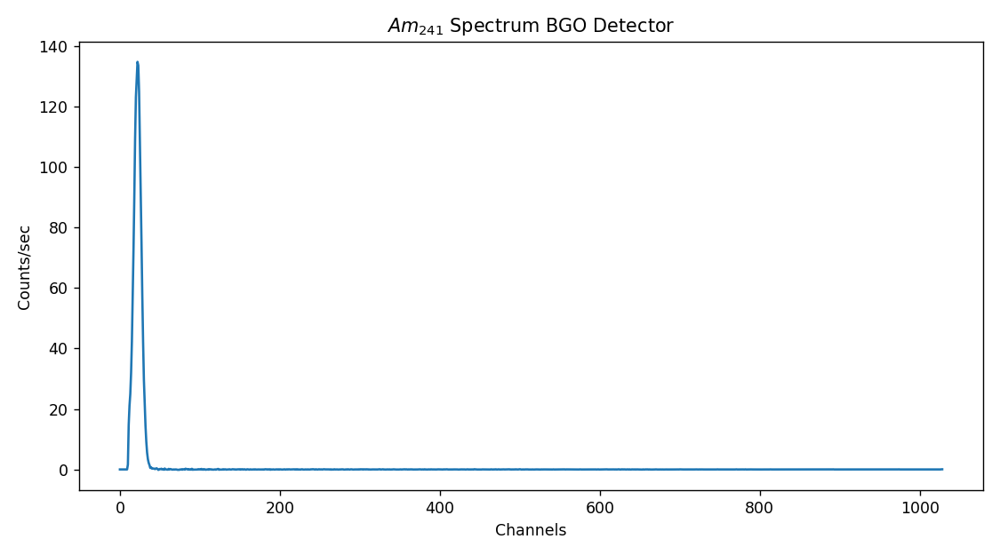

In [629]:
BGO_Am90_headers, BGO_Am90_channels, BGO_Am90_counts_sec, BGO_Am90_counts_minus_bkg = plot_spectra(BGO_bkg_file, BGO_Am_90_deg)

* Use curve fit to fit Gaussian to peaks
* popt 3 & 4 is an x and y coord of the peak
* Get energy of peak from website
* Assign energy to y value, get channel from x value
* Find energies and channels annd fit linear relationship

In [439]:
from lmfit import Model
from lmfit.models import GaussianModel

* amp = amp
* cen = mu
* wid = sigma

In [440]:
from scipy.signal import find_peaks

In [441]:
Ba_energies = [53.1622, 80.9979, 356.0129]
Am_energies = [59.5409]
Cs_energies = [661.657]
Co_energies = [1173.228, 1332.492]

In [581]:
def fitting_peaks(channels, counts, lower, upper, height, width, distance, title, detector, channel_max):
    # find peaks
    peaks, _ = find_peaks(counts, height=height, width=width, distance=distance)
    
    # loop through peaks and fit gaussian
    model = GaussianModel()
    
    gauss_peaks = []
    centroids = []
    centroid_error = []
    fwhm = []
    fwhm_error = []
    fit_result = []
    
    fig, ax = plt.subplots(figsize=(9, 7))
    ax.plot(channels, counts)
    
    peaknum = 1
    
    for peak in peaks:
        channel_range = np.arange((peak-lower), (peak+upper))
        
        params = model.guess(counts[channel_range], channels[channel_range])
        
        result = model.fit(counts[channel_range], x=channels[channel_range], params=params)
        
        # add result to arrays
        gauss_peaks.append(result)
        centroids.append(result.params["center"].value)
        centroid_error.append(result.params["center"].stderr)
        fwhm.append(result.params["fwhm"].value)
        fwhm_error.append(result.params["fwhm"].stderr)
        fit_result.append(result)
        
        ax.plot(channels[channel_range], result.init_fit, "--", label=f"initial fit peak {peaknum}")
        ax.plot(channels[channel_range], result.best_fit, "-", label=f"best fit peak {peaknum}")
        
        peaknum += 1
        
    ax.set_title(f"{title} Fitted Peaks {detector} Detector", fontsize=16)
    ax.set_xlabel("Channels", fontsize=14)
    ax.set_ylabel("Counts/sec", fontsize=14)
    ax.legend()
    plt.xlim(0, channel_max)

    if "Ba" in title:
        energies = [53.1622, 80.9979, 356.0129]
    elif "Am" in title:
        energies = [59.5409]
    elif "Cs" in title:
        energies = [661.657]
    else:
        energies = [1173.2, 1332.5]
        
    for energy, peak in zip(energies, peaks):
        plt.text(peak + 5, counts[peak] + 0.1, f"{energy:.1f} keV", color="red", fontsize=9)
        
    plt.savefig(f"Fitted_{title}_{detector}_new.png")
    plt.show()
        
    return fit_result, centroids, centroid_error, fwhm, fwhm_error

<IPython.core.display.Javascript object>


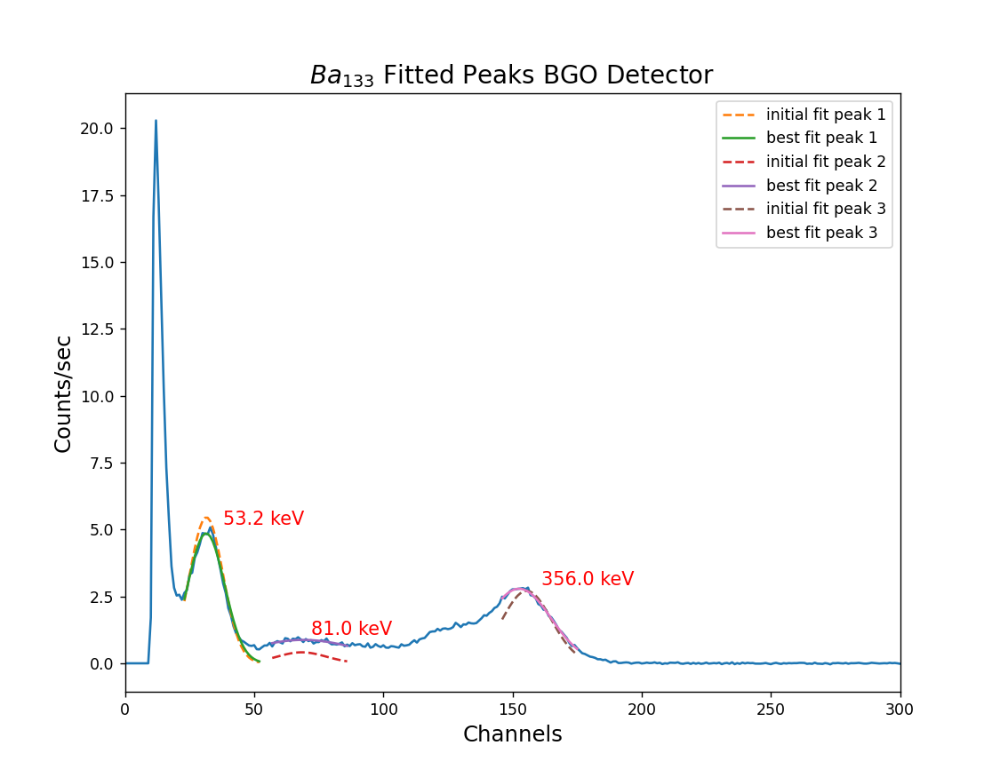

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [563]:
BGO_Ba_result, BGO_Ba_centroids, BGO_Ba_error, BGO_Ba_fwhm, BGO_Ba_fwhm_error = fitting_peaks(BGO_Ba_channels, BGO_Ba_counts_minus_bkg, 10, 20, 0.5, 5, None, "$Ba_{133}$", "BGO", 300)

<IPython.core.display.Javascript object>


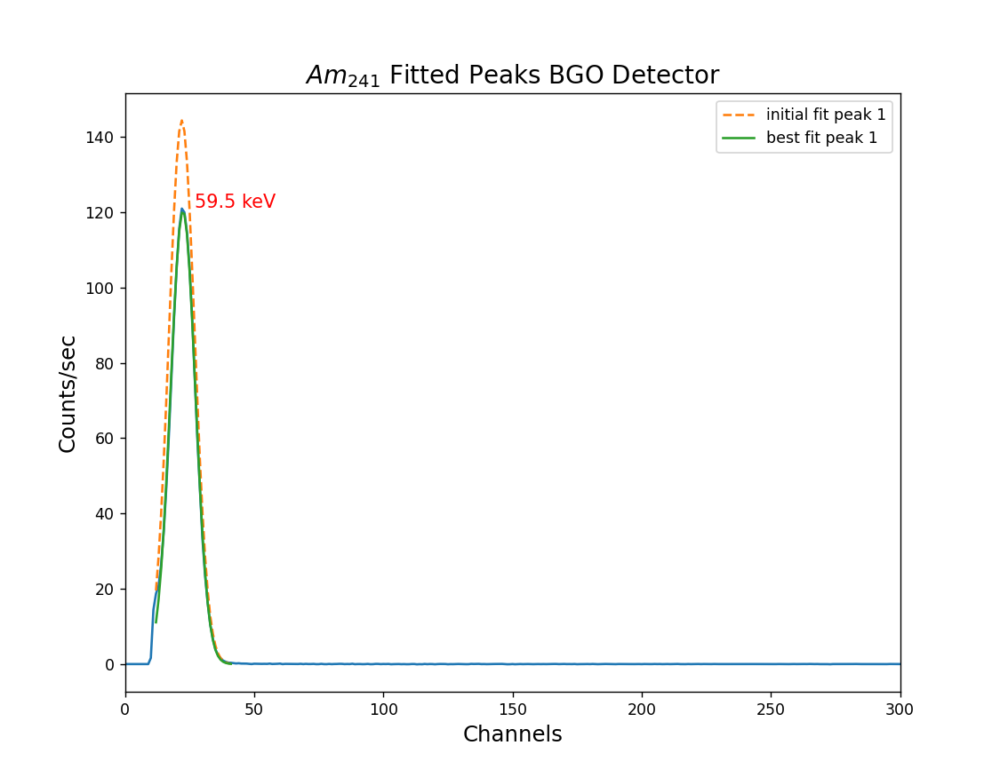

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [564]:
BGO_Am_result, BGO_Am_centroids, BGO_Am_error, BGO_Am_fwhm, BGO_Am_fwhm_error = fitting_peaks(BGO_Am_channels, BGO_Am_counts_minus_bkg, 10, 20, 20, None, None, "$Am_{241}$", "BGO", 300)

<IPython.core.display.Javascript object>


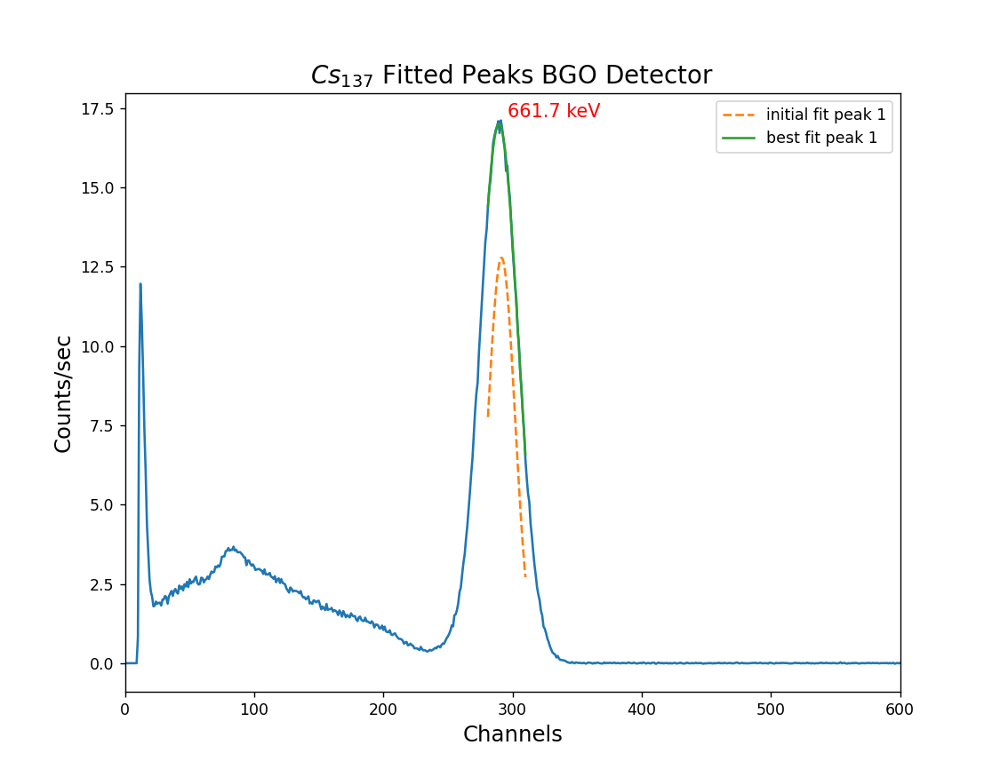

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [566]:
BGO_Cs_result, BGO_Cs_centroids, BGO_Cs_error, BGO_Cs_fwhm, BGO_Cs_fwhm_error = fitting_peaks(BGO_Cs_channels, BGO_Cs_counts_minus_bkg, 10, 20, 5.0, 20, None, "$Cs_{137}$", "BGO", 600)

<IPython.core.display.Javascript object>


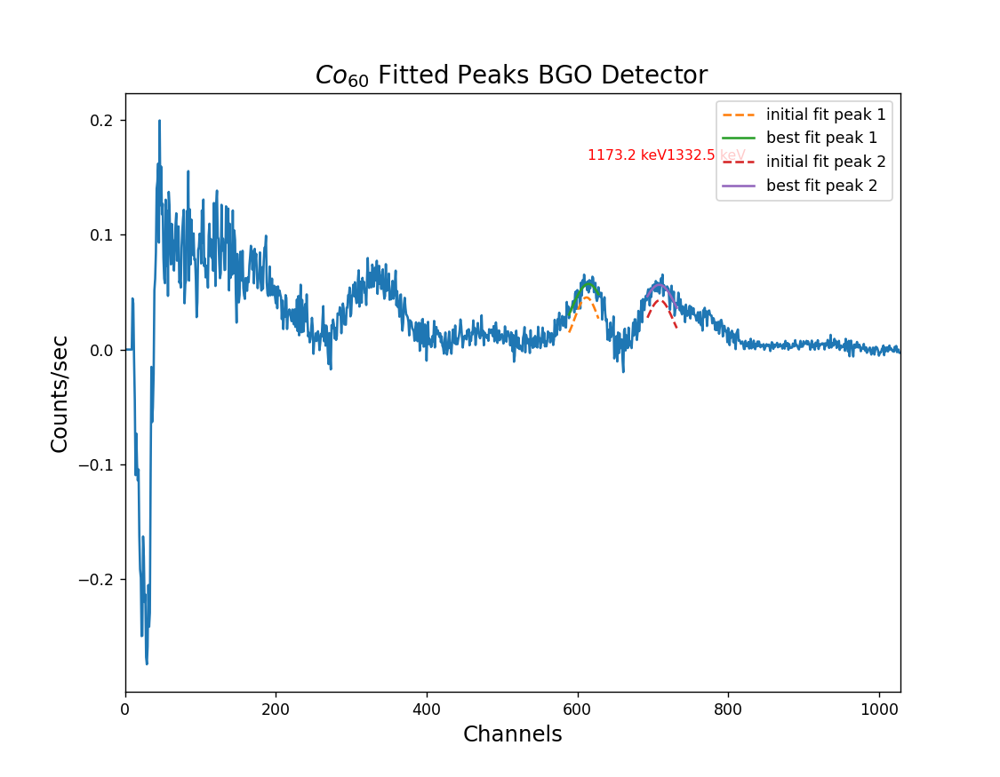

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [569]:
BGO_Co_result, BGO_Co_centroids, BGO_Co_error, BGO_Co_fwhm, BGO_Co_fwhm_error = fitting_peaks(BGO_Co_channels, BGO_Co_counts_minus_bkg, 20, 20, (0.05, 0.07), 6, 5, "$Co_{60}$", "BGO", max(BGO_Co_channels))

<IPython.core.display.Javascript object>


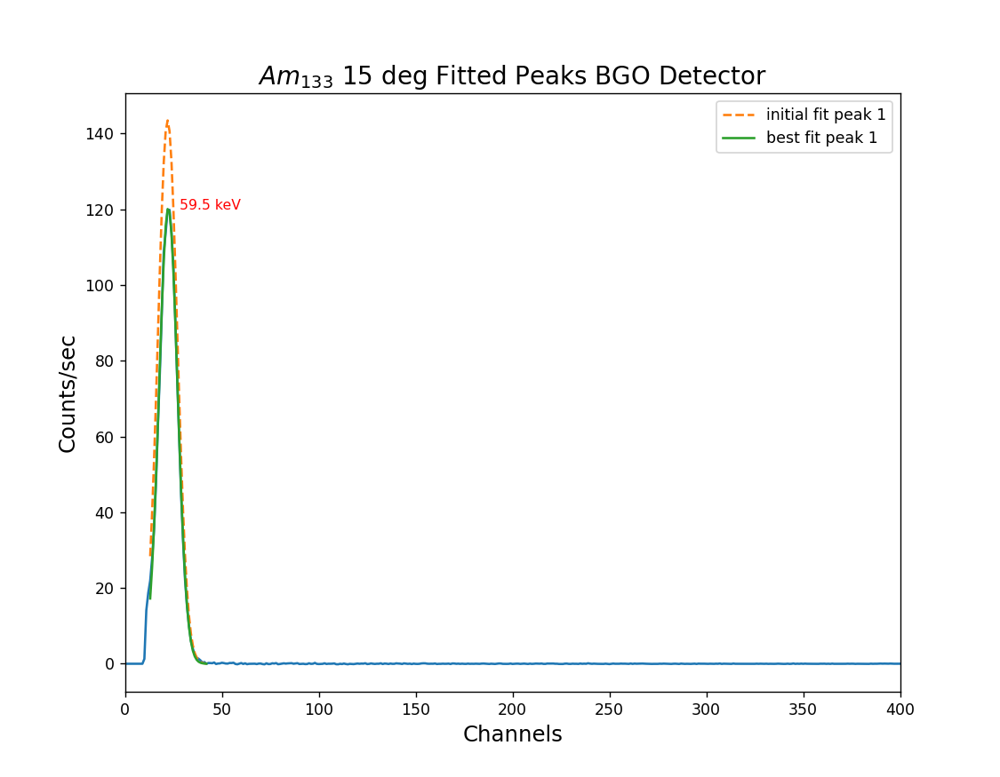

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [630]:
BGO_Am15_result, BGO_Am15_centroids, BGO_Am15_error, BGO_Am15_fwhm, BGO_Am15_fwhm_error = fitting_peaks(BGO_Am15_channels, BGO_Am15_counts_minus_bkg, 10, 20, 20, None, None, "$Am_{133}$ 15 deg", "BGO", 400)

<IPython.core.display.Javascript object>


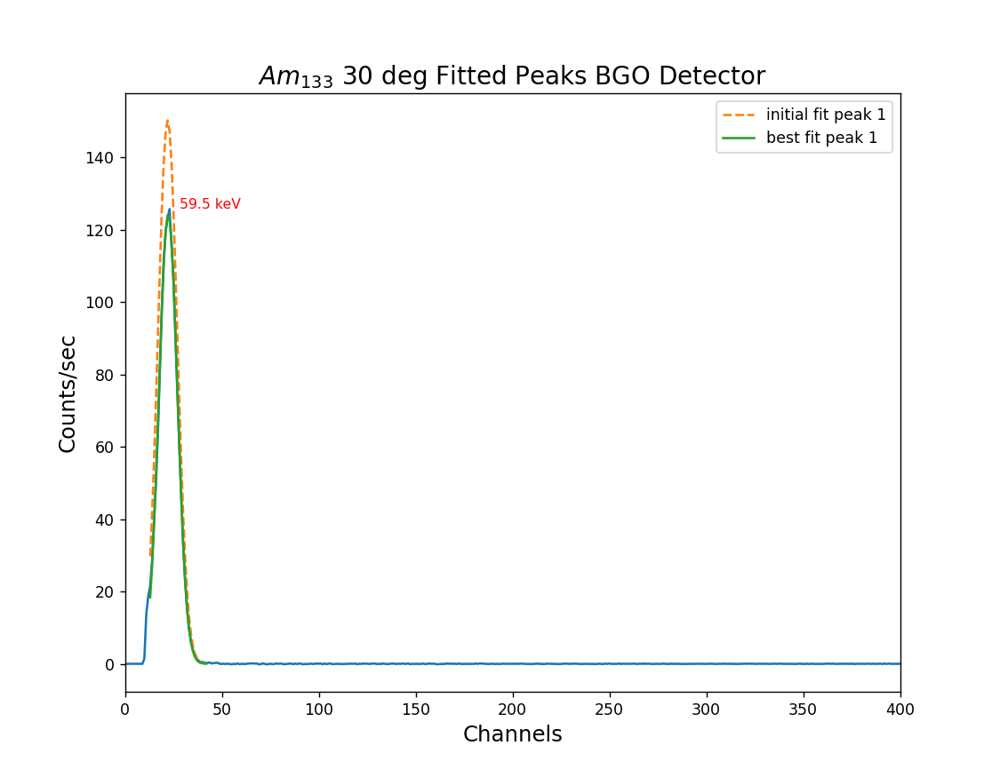

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [631]:
BGO_Am30_result, BGO_Am30_centroids, BGO_Am30_error, BGO_Am30_fwhm, BGO_Am30_fwhm_error = fitting_peaks(BGO_Am30_channels, BGO_Am30_counts_minus_bkg, 10, 20, 20, None, None, "$Am_{133}$ 30 deg", "BGO", 400)

<IPython.core.display.Javascript object>


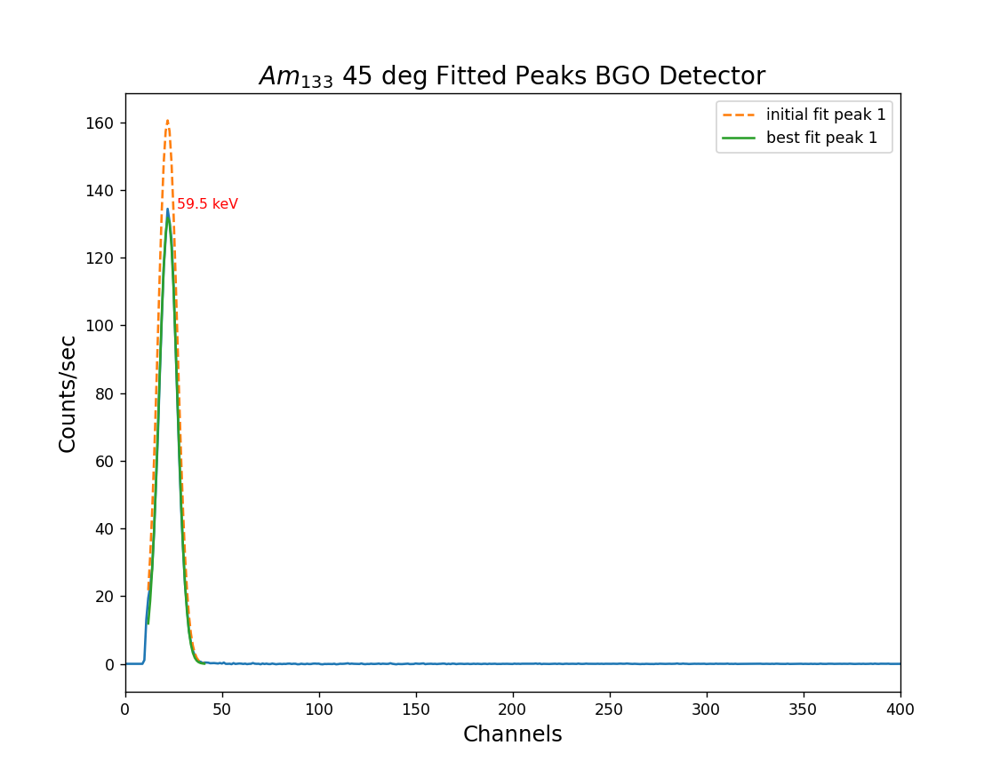

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [632]:
BGO_Am45_result, BGO_Am45_centroids, BGO_Am45_error, BGO_Am45_fwhm, BGO_Am45_fwhm_error = fitting_peaks(BGO_Am45_channels, BGO_Am45_counts_minus_bkg, 10, 20, 20, None, None, "$Am_{133}$ 45 deg", "BGO", 400)

<IPython.core.display.Javascript object>


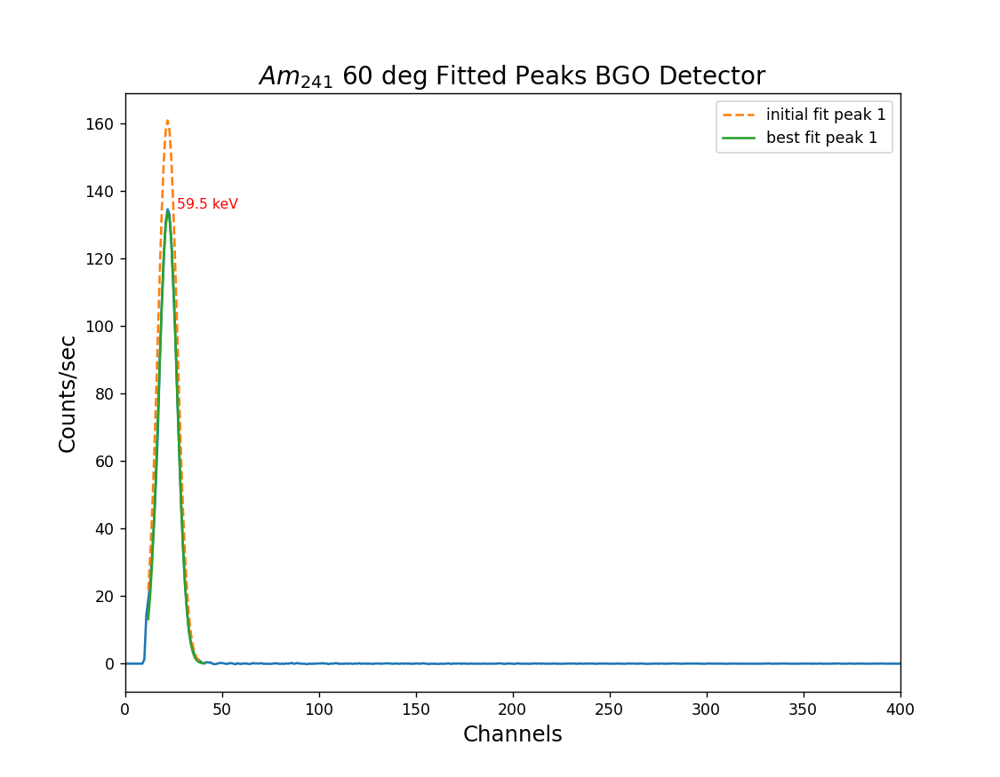

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [633]:
BGO_Am60_result, BGO_Am60_centroids, BGO_Am60_error, BGO_Am60_fwhm, BGO_Am60_fwhm_error = fitting_peaks(BGO_Am60_channels, BGO_Am60_counts_minus_bkg, 10, 20, 20, None, None, "$Am_{241}$ 60 deg", "BGO", 400)

<IPython.core.display.Javascript object>


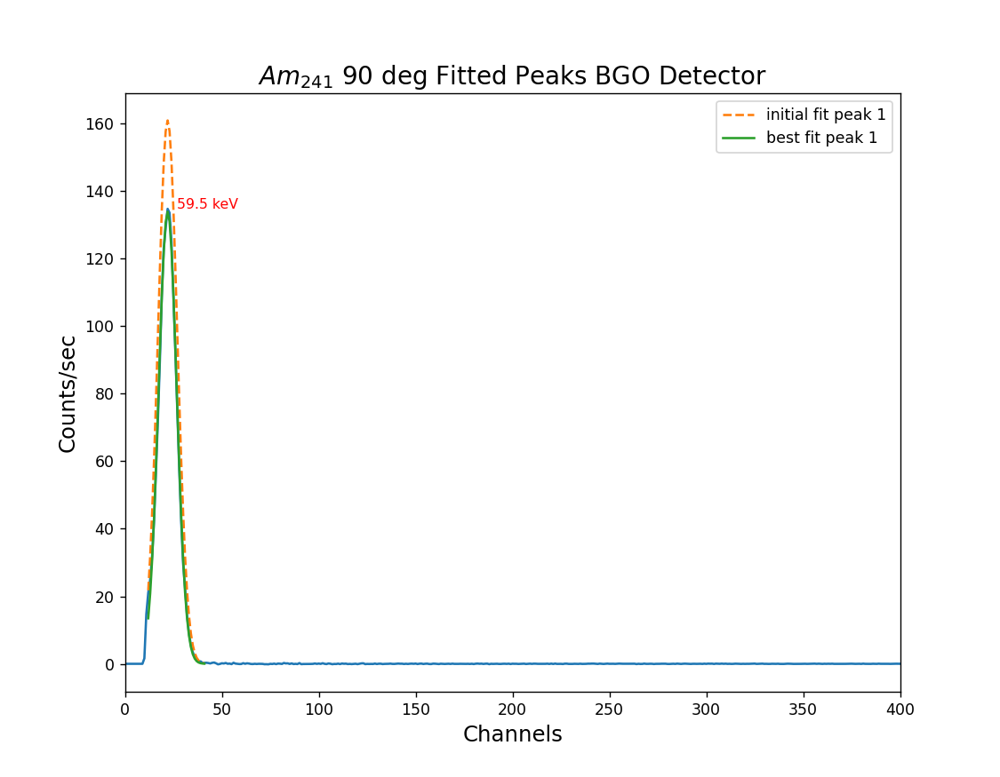

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [634]:
BGO_Am90_result, BGO_Am90_centroids, BGO_Am90_error, BGO_Am90_fwhm, BGO_Am90_fwhm_error = fitting_peaks(BGO_Am90_channels, BGO_Am90_counts_minus_bkg, 10, 20, 20, None, None, "$Am_{241}$ 90 deg", "BGO", 400)

In [635]:
BGO_Ba_centroids

[31.423503396345062, 69.01069589269511, 152.52122988817027]

In [453]:
BGO_dictionary = {"Barium-133":[BGO_Ba_centroids, BGO_Ba_error, Ba_energies, BGO_Ba_fwhm, BGO_Ba_fwhm_error],
                 "Americium-241":[BGO_Am_centroids, BGO_Am_error, Am_energies, BGO_Am_fwhm, BGO_Am_fwhm_error],
                 "Cobalt-60":[BGO_Co_centroids, BGO_Co_error, Co_energies, BGO_Co_fwhm, BGO_Co_fwhm_error],
                 "Caesium-137":[BGO_Cs_centroids, BGO_Cs_error, Cs_energies, BGO_Cs_fwhm, BGO_Cs_fwhm_error]}

In [454]:
BGO_df = pd.DataFrame(data=BGO_dictionary)
#df.to_csv('BGO_results.csv', index=False)

In [455]:
# %load BGO_results.csv

In [456]:
BGO_channels = BGO_Ba_centroids + BGO_Am_centroids + BGO_Cs_centroids + BGO_Co_centroids

In [457]:
BGO_energies = Ba_energies + Am_energies + Cs_energies + Co_energies

In [458]:
from lmfit.models import LinearModel
def linear_fit(energies, channels, name):
    Lmodel = LinearModel()
    params = Lmodel.guess(energies, channels)

    result_linear = Lmodel.fit(energies, x = channels, params = params)
    fig, ax = plt.subplots(figsize=(9,5))
    ax.scatter(channels, energies)
    ax.plot(channels, result_linear.best_fit)
    ax.set_title(f"{name} Energies vs Channels")
    ax.set_xlabel(f"{name} Channels")
    ax.set_ylabel(f"{name} Energies")
    
    return result_linear

In [459]:
#BGO_linear_result = linear_fit(BGO_energies, BGO_channels, "BGO")

In [460]:
from lmfit.models import QuadraticModel

In [461]:
NaI_bkg_file = "NaI_bck_10min.Spe"
NaI_Ba_file = "NaI_Ba_direct.Spe"
NaI_Cs_file = "NaI_Cs_direct.Spe"
NaI_Co_file = "nai-co60-000-10cm-u.Spe"
NaI_Am_file = "NaI_Am_direct.Spe"

<IPython.core.display.Javascript object>


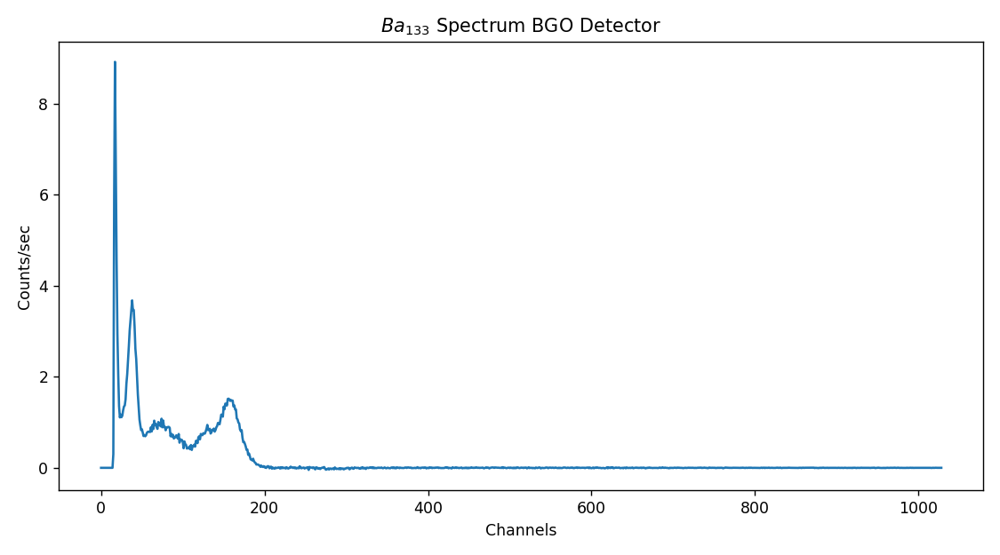

In [572]:
NaI_Ba_headers, NaI_Ba_channels, NaI_Ba_counts, NaI_Ba_counts_minus_bkg = plot_spectra(NaI_bkg_file, NaI_Ba_file)

<IPython.core.display.Javascript object>


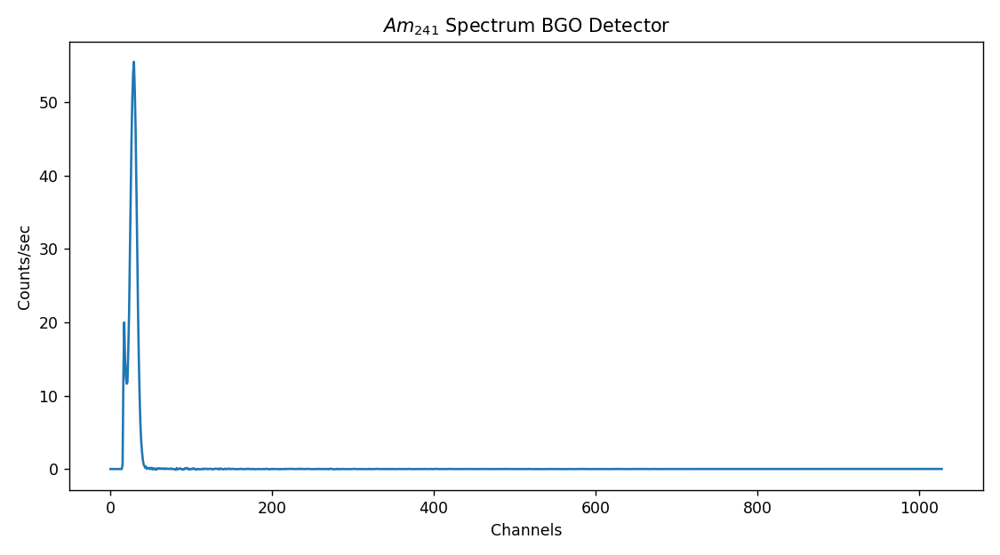

In [573]:
NaI_Am_headers, NaI_Am_channels, NaI_Am_counts, NaI_Am_counts_minus_bkg = plot_spectra(NaI_bkg_file, NaI_Am_file)

<IPython.core.display.Javascript object>


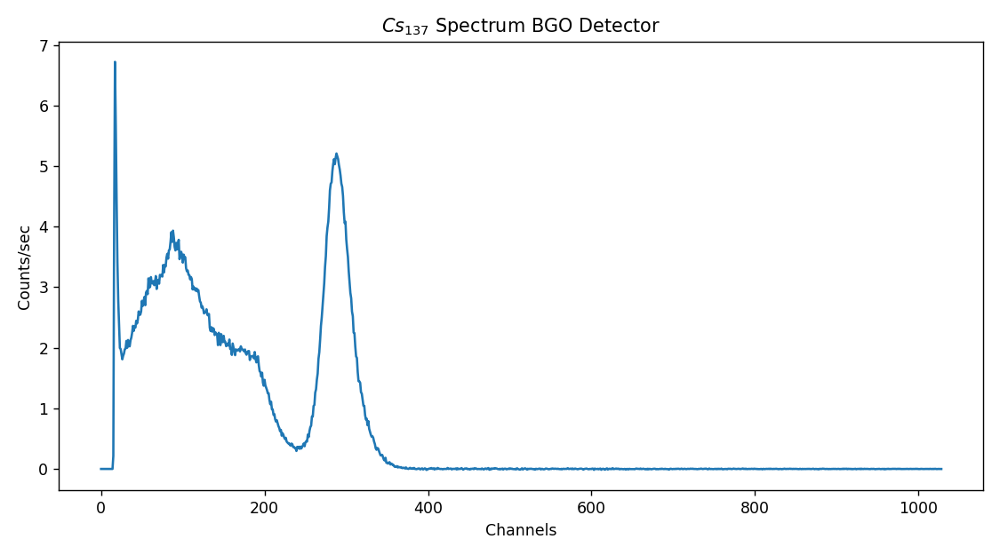

In [574]:
NaI_Cs_headers, NaI_Cs_channels, NaI_Cs_counts, NaI_Cs_counts_minus_bkg = plot_spectra(NaI_bkg_file, NaI_Cs_file)

<IPython.core.display.Javascript object>


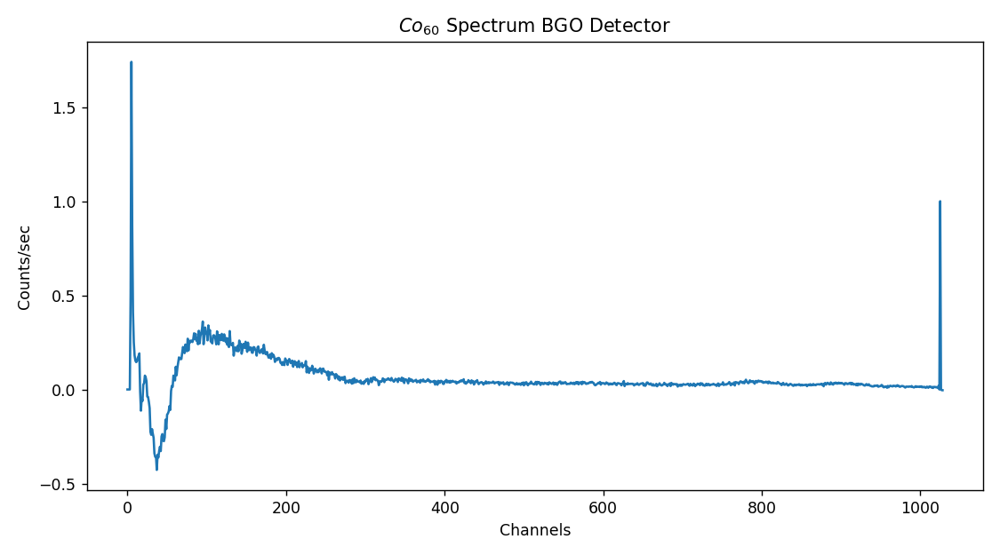

In [636]:
NaI_Co_headers, NaI_Co_channels, NaI_Co_counts, NaI_Co_counts = plot_spectra(NaI_bkg_file, NaI_Co_file)

<IPython.core.display.Javascript object>


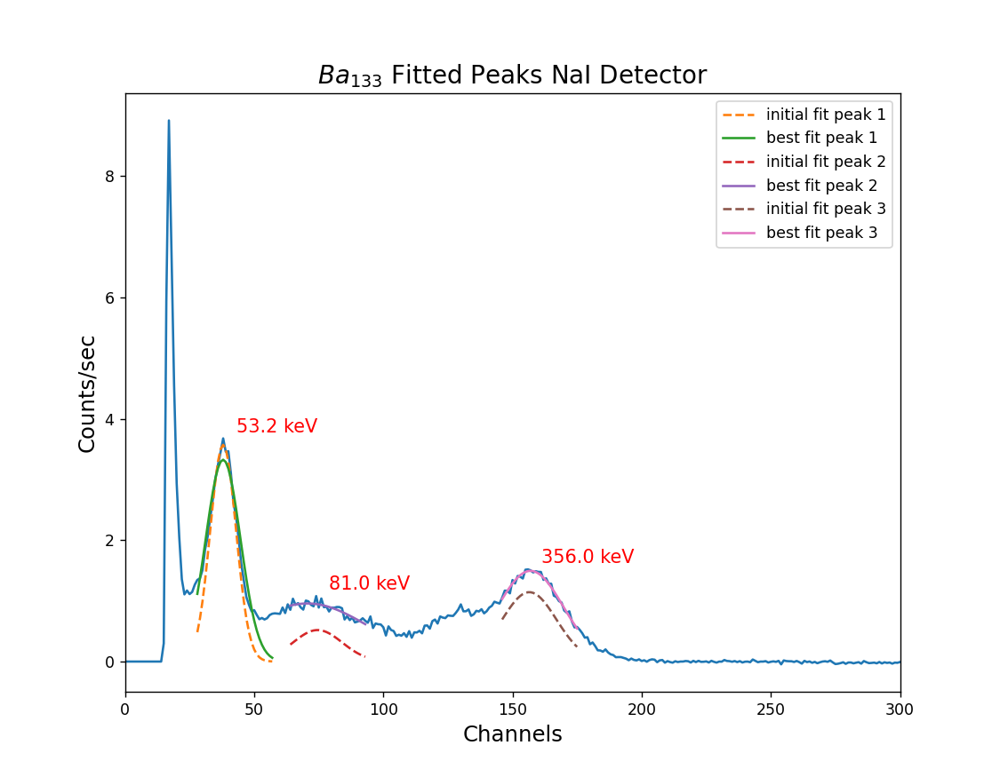

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [577]:
NaI_Ba_result, NaI_Ba_centroids, NaI_Ba_error, NaI_Ba_fwhm, NaI_Ba_fwhm_error = fitting_peaks(NaI_Ba_channels, NaI_Ba_counts_minus_bkg, 10, 20, (0.5, 6), 3, 10, "$Ba_{133}$", "NaI", 300)

<IPython.core.display.Javascript object>


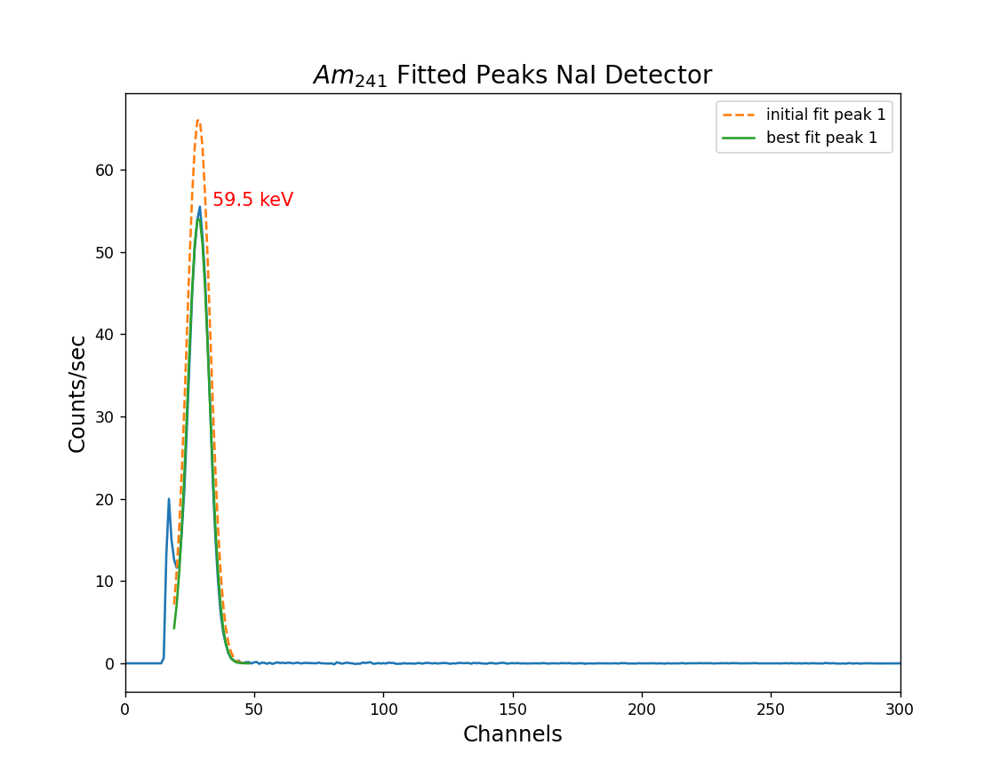

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [578]:
NaI_Am_result, NaI_Am_centroids, NaI_Am_error, NaI_Am_fwhm, NaI_Am_fwhm_error = fitting_peaks(NaI_Am_channels, NaI_Am_counts_minus_bkg, 10, 20, 0.5, 3, None, "$Am_{241}$", "NaI", 300)

<IPython.core.display.Javascript object>


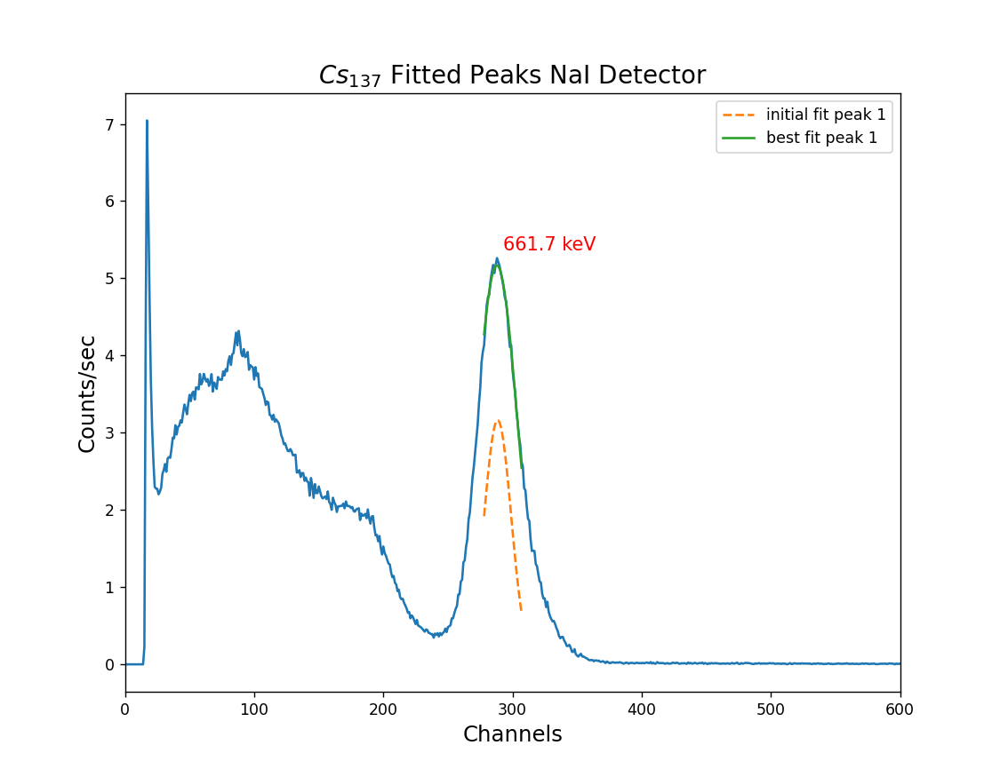

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [579]:
NaI_Cs_result, NaI_Cs_centroids, NaI_Cs_error, NaI_Cs_fwhm, NaI_Cs_fwhm_error = fitting_peaks(NaI_Cs_channels, NaI_Cs_counts, 10, 20, 4.5, 5, None, "$Cs_{137}$", "NaI", 600)

<IPython.core.display.Javascript object>


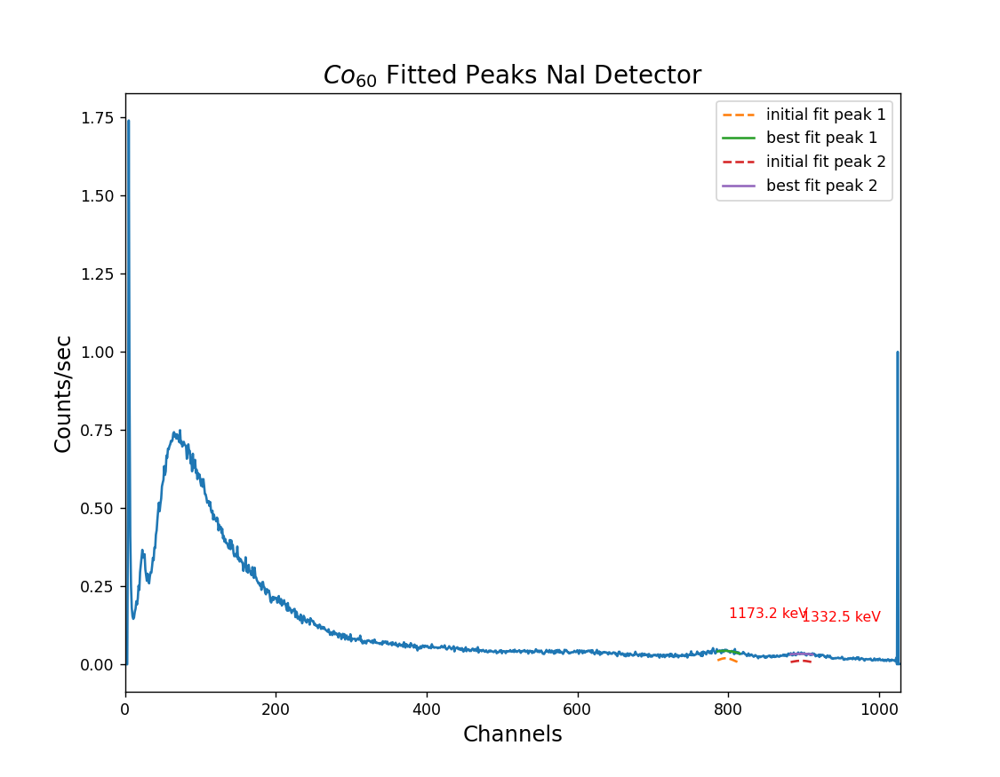

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [582]:
NaI_Co_result, NaI_Co_centroids, NaI_Co_error, NaI_Co_fwhm, NaI_Co_fwhm_error = fitting_peaks(NaI_Co_channels, NaI_Co_counts, 10, 20, (0.01, 0.25), 6.9, 10, "$Co_{60}$", "NaI", max(NaI_Co_channels))

In [470]:
NaI_15_file = "NaI_Am_15deg.Spe"
NaI_30_file = "NaI_Am_30deg.Spe"
NaI_45_file = "NaI_Am_45deg.Spe"
NaI_60_file = "NaI_Am_60deg.Spe"
NaI_90_file = "NaI_Am_90deg.Spe"

<IPython.core.display.Javascript object>


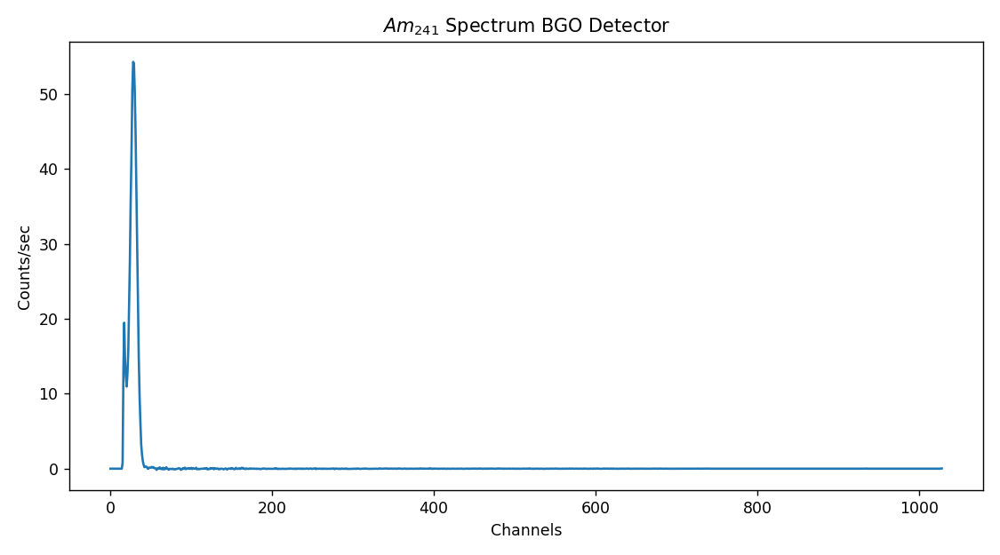

In [637]:
NaI_Am15_headers, NaI_Am15_channels, NaI_Am15_counts, NaI_Am15_counts_minus_bkg = plot_spectra(NaI_bkg_file, NaI_15_file)

<IPython.core.display.Javascript object>


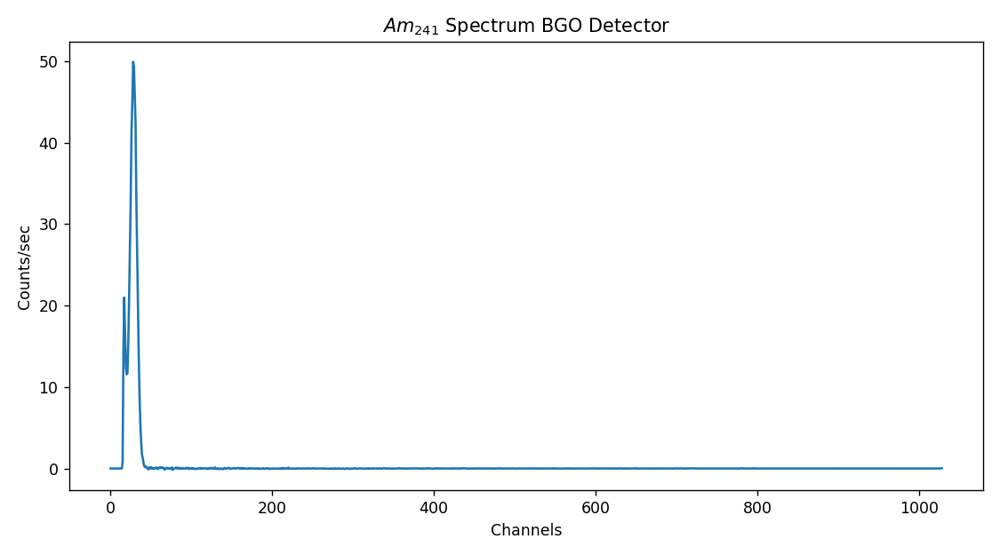

In [638]:
NaI_Am30_headers, NaI_Am30_channels, NaI_Am30_counts, NaI_Am30_counts_minus_bkg = plot_spectra(NaI_bkg_file, NaI_30_file)

<IPython.core.display.Javascript object>


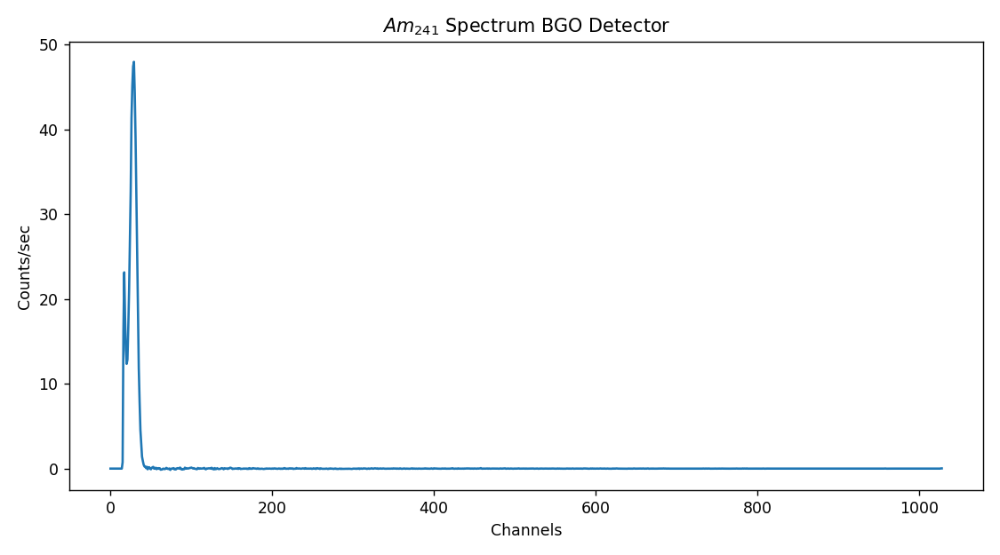

In [639]:
NaI_Am45_headers, NaI_Am45_channels, NaI_Am45_counts, NaI_Am45_counts_minus_bkg = plot_spectra(NaI_bkg_file, NaI_45_file)

<IPython.core.display.Javascript object>


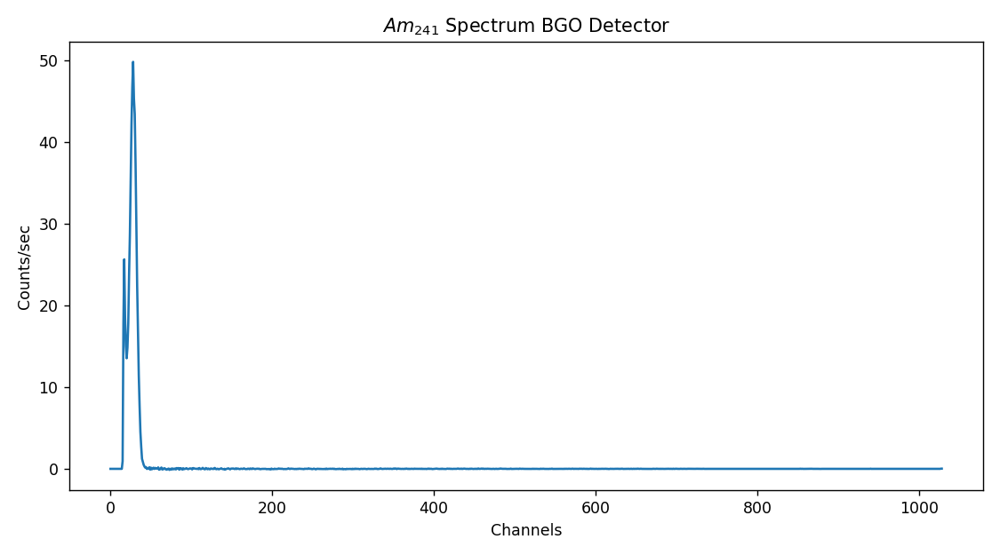

In [640]:
NaI_Am60_headers, NaI_Am60_channels, NaI_Am60_counts, NaI_Am60_counts_minus_bkg = plot_spectra(NaI_bkg_file, NaI_60_file)

<IPython.core.display.Javascript object>


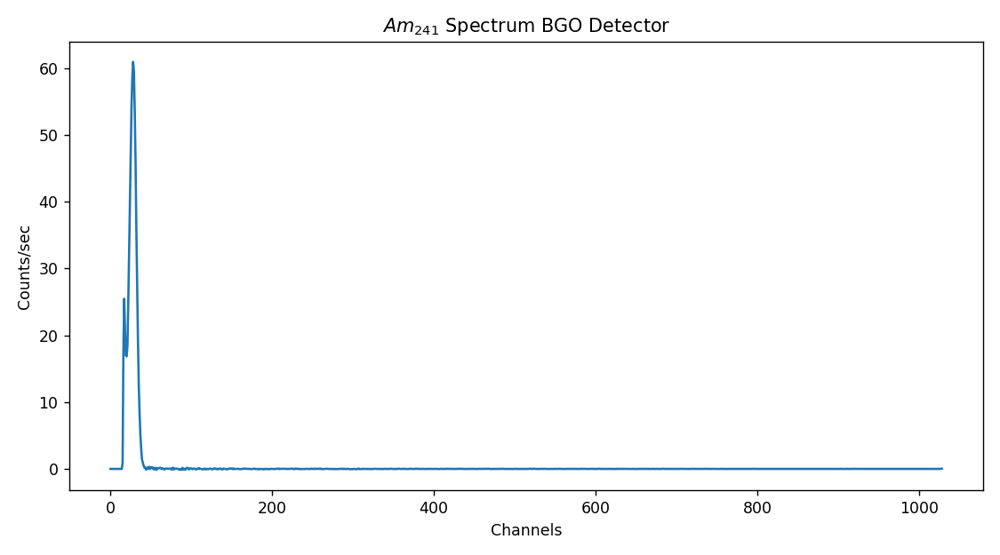

In [641]:
NaI_Am90_headers, NaI_Am90_channels, NaI_Am90_counts, NaI_Am90_counts_minus_bkg = plot_spectra(NaI_bkg_file, NaI_90_file)

<IPython.core.display.Javascript object>


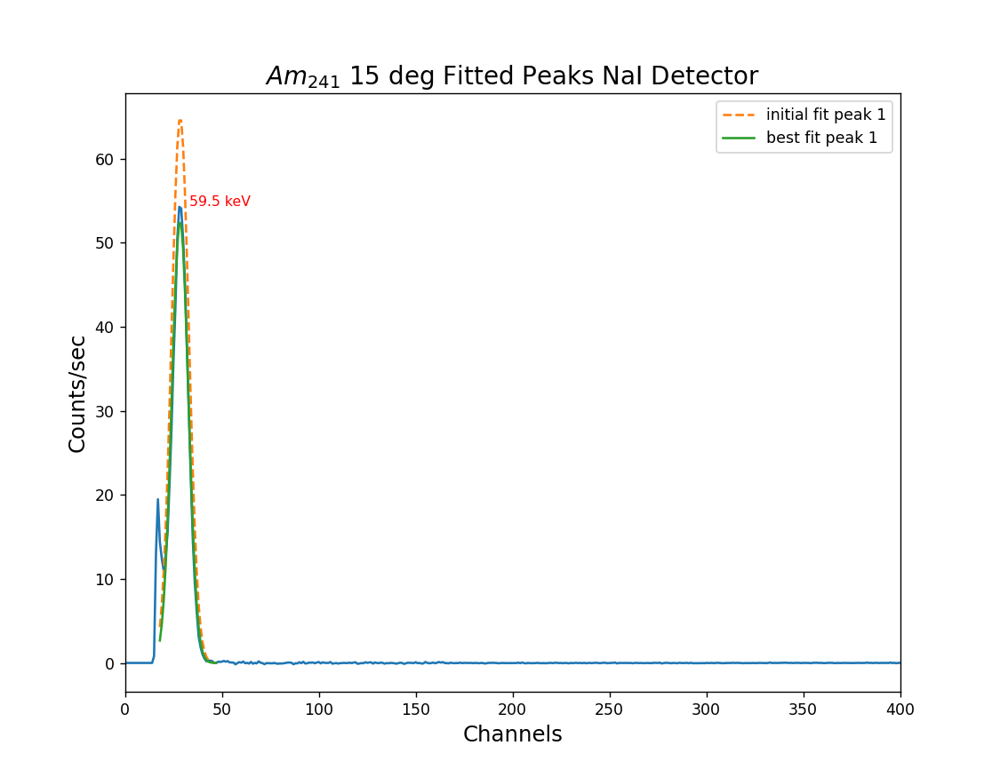

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [642]:
NaI_Am15_result, NaI_Am15_centroids, NaI_Am15_error, NaI_Am15_fwhm, NaI_Am15_fwhm_error = fitting_peaks(NaI_Am15_channels, NaI_Am15_counts_minus_bkg, 10, 20, 0.5, 3, None, "$Am_{241}$ 15 deg", "NaI", 400)

<IPython.core.display.Javascript object>


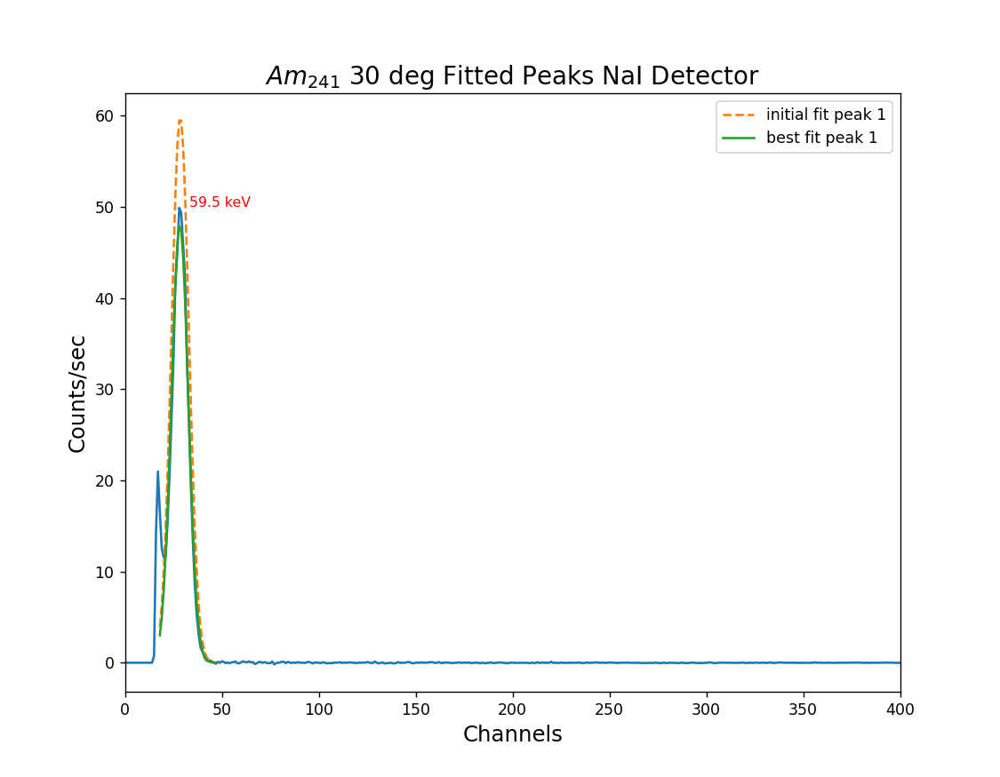

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [643]:
NaI_Am30_result, NaI_Am30_centroids, NaI_Am30_error, NaI_Am30_fwhm, NaI_Am30_fwhm_error = fitting_peaks(NaI_Am30_channels, NaI_Am30_counts_minus_bkg, 10, 20, 0.5, 3, None, "$Am_{241}$ 30 deg", "NaI", 400)

<IPython.core.display.Javascript object>


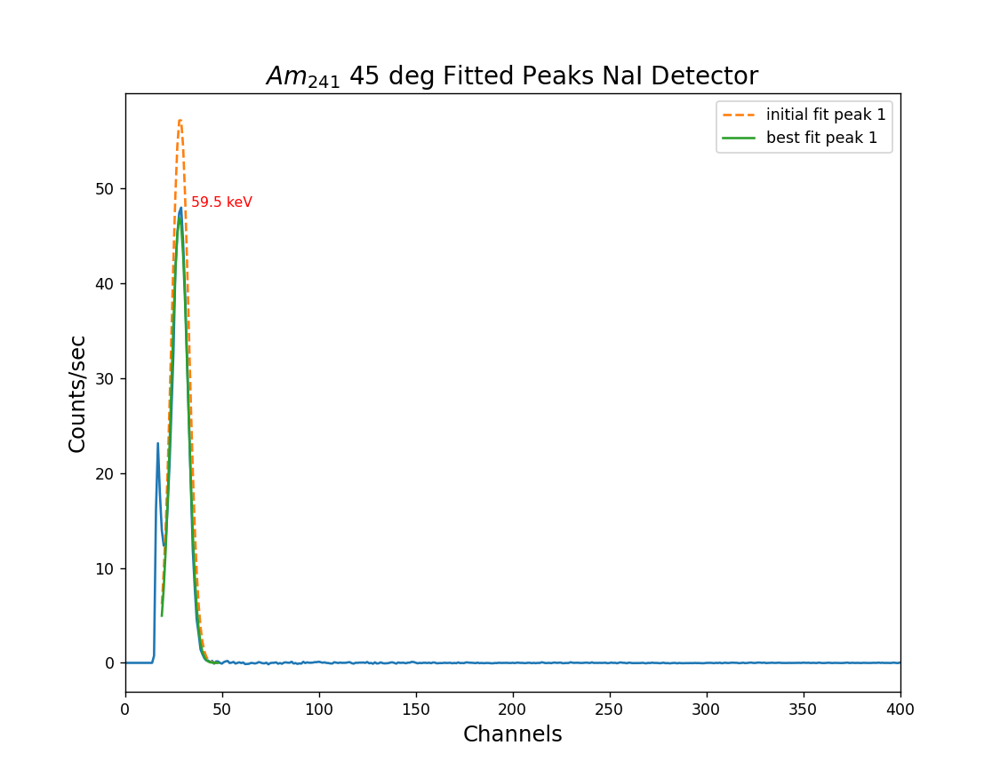

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [644]:
NaI_Am45_result, NaI_Am45_centroids, NaI_Am45_error, NaI_Am45_fwhm, NaI_Am45_fwhm_error = fitting_peaks(NaI_Am45_channels, NaI_Am45_counts_minus_bkg, 10, 20, 0.5, 3, None, "$Am_{241}$ 45 deg", "NaI", 400)

<IPython.core.display.Javascript object>


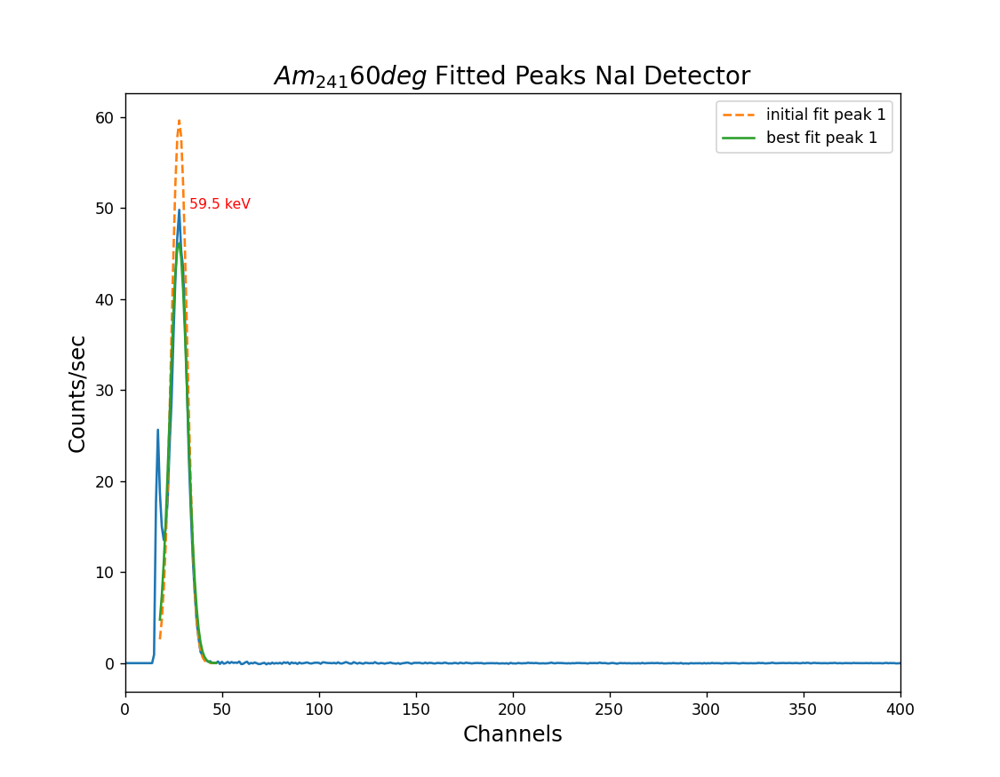

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [645]:
NaI_Am60_result, NaI_Am60_centroids, NaI_Am60_error, NaI_Am60_fwhm, NaI_Am60_fwhm_error = fitting_peaks(NaI_Am60_channels, NaI_Am60_counts_minus_bkg, 10, 20, 0.5, 3, None, "$Am_{241} 60 deg$", "NaI", 400)

<IPython.core.display.Javascript object>


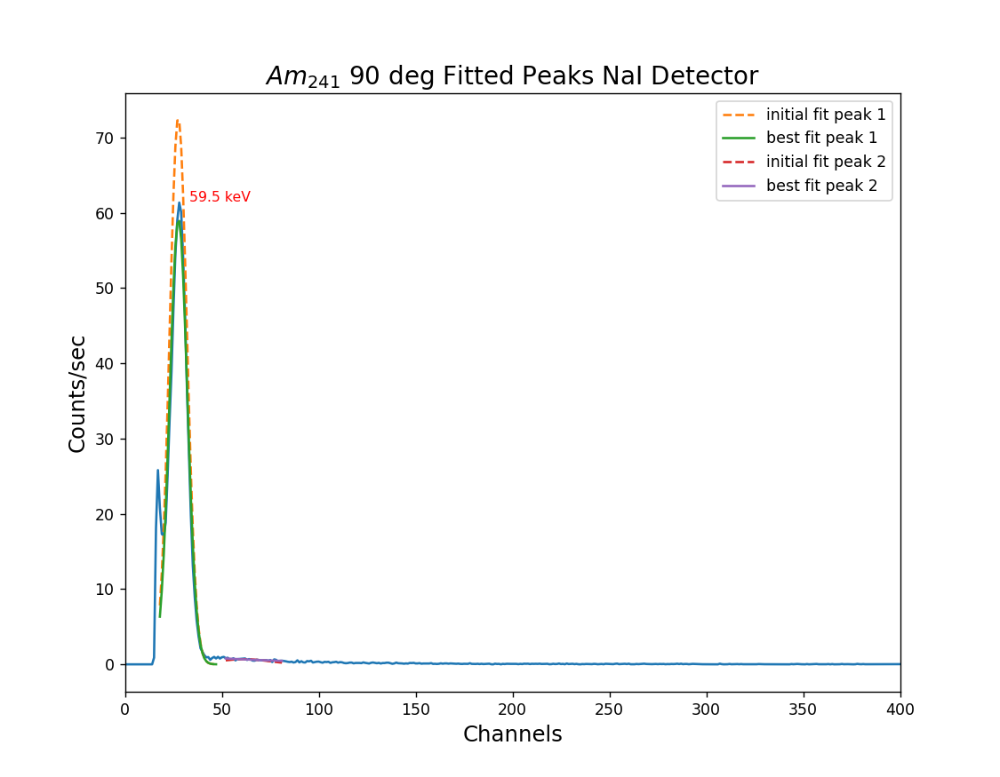

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [646]:
NaI_Am90_result, NaI_Am90_centroids, NaI_Am90_error, NaI_Am90_fwhm, NaI_Am90_fwhm_error = fitting_peaks(NaI_Am90_channels, NaI_Am90_counts, 10, 20, 0.5, 3, None, "$Am_{241}$ 90 deg", "NaI", 400)

In [481]:
NaI_dictionary = {"Barium-133":[NaI_Ba_centroids, NaI_Ba_error, Ba_energies],
                 "Americium-241":[NaI_Am_centroids, NaI_Am_error, Am_energies],
                 "Cobalt-60":[NaI_Co_centroids, NaI_Co_error, Co_energies],
                 "Caesium-137":[NaI_Cs_centroids, NaI_Cs_error, Cs_energies]}

In [482]:
NaI_Ba_channels = NaI_Ba_centroids
NaI_Am_channels = NaI_Am_centroids
NaI_Cs_channels = NaI_Cs_centroids
NaI_channels = NaI_Ba_channels + NaI_Am_channels + NaI_Cs_channels + NaI_Co_centroids
NaI_energies = Ba_energies + Am_energies + Cs_energies + Co_energies

In [483]:
NaI_energies

[53.1622, 80.9979, 356.0129, 59.5409, 661.657, 1173.228, 1332.492]

In [484]:
NaI_energies, NaI_channels

([53.1622, 80.9979, 356.0129, 59.5409, 661.657, 1173.228, 1332.492],
 [37.97265855725717,
  70.62243735135141,
  156.96210925851608,
  28.50584734708451,
  287.89000754040103,
  795.01964842286,
  896.3484037891935])

In [485]:
NaI_df = pd.DataFrame(data=NaI_dictionary)
#df.to_csv('NaI_results.csv', index=False)

In [486]:
# %load NaI_results.csv

In [487]:
def parse_mca_files(filename):
    IS_HEADER = False
    IS_DATA = False
    header_key = []
    header_value = []
    data = []

    with open(filename) as file:
        for line in file:
            line = line.strip()

            if line == "<<PMCA SPECTRUM>>":
                IS_HEADER = True
                IS_DATA = False
                continue

            elif line == "<<DATA>>":
                IS_HEADER = False
                IS_DATA = True
                continue

            elif line.startswith("<<END") or line.startswith("<<DP5 CONFIGURATION") or line.startswith("<<DPP STATUS"):
                IS_HEADER = False
                IS_DATA = False
                continue

            # handle header lines
            if IS_HEADER:
                if "-" in line:
                    header_split = line.split("-", 1)
                    header_key.append(header_split[0].strip())
                    header_value.append(header_split[1].strip())
            
            elif IS_DATA:
                try:
                    counts = int(line.strip())
                    data.append(counts)
                except ValueError:
                    # silently skip non-data lines
                    continue

    # build data dictionary
    channels = np.arange(len(data))
    counts = np.array(data)

    # create a dictionary for the headers using the lists of keys and values
    headers = {k: v for k, v in zip(header_key, header_value)}
    
    return headers, channels, counts

In [488]:
def plot_CdTe_spectra(bkg_file, file):
    headers, channels, counts = parse_mca_files(file)
    bkg_headers, bkg_channels, bkg_counts = parse_mca_files(bkg_file)
    
    time_bkg = bkg_headers["REAL_TIME"]
    bkg_exp_time = float(time_bkg)
    
    bkg_counts_per_sec = counts_per_sec(np.array(bkg_counts), bkg_exp_time)
    
    time_data = headers["REAL_TIME"]
    data_exp_time = float(time_data)
    
    counts_sec = counts_per_sec(np.array(counts), data_exp_time)
    
    counts_minus_bkg = (np.array(counts_sec) - np.array(bkg_counts_per_sec)).flatten()
    
    if "Am" in file:
        title = "$Am_{241}$"
        
    if "Co" in file:
        title = "$Co_{60}$"
        
    if "Ba" in file:
        title = "$Ba_{133}$"
        
    if "Cs" in file:
        title = "$Cs_{137}$"
    
    fig, ax = plt.subplots(figsize=(9, 5))
    ax.plot(channels, counts_minus_bkg, label=f"{title} Spectrum")
    ax.set_title(f"{title} Spectrum CdTe Detector")
    ax.set_xlabel("Channels")
    ax.set_ylabel("Counts/sec")
    plt.tight_layout()
    plt.show()
    
    return headers, channels, counts_sec, counts_minus_bkg

In [489]:
CdTe_Am_file = "CdTe_Am_direct.mca"
CdTe_Ba_file = "CdTe_Ba_direct.mca"
CdTe_Co_file = "CdTe_Co_direct.mca"
CdTe_Cs_file = "CdTe_Cs_direct.mca"
CdTe_bkg_file = "CdTe_bck_10min.mca"

<IPython.core.display.Javascript object>


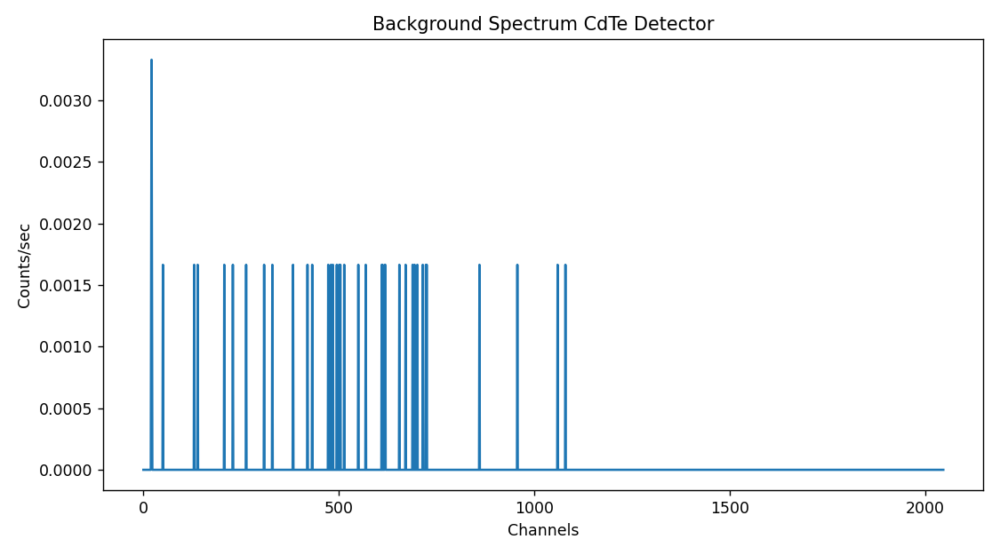

In [647]:
bkg_headers, bkg_channels, bkg_counts = parse_mca_files(CdTe_bkg_file)
    
time_bkg = bkg_headers["REAL_TIME"]
bkg_exp_time = float(time_bkg)
    
bkg_counts_per_sec = counts_per_sec(np.array(bkg_counts), bkg_exp_time)
    
fig, ax = plt.subplots(figsize=(9, 5))
ax.plot(bkg_channels, bkg_counts_per_sec, label="Background Spectrum")
ax.set_title("Background Spectrum CdTe Detector")
ax.set_xlabel("Channels")
ax.set_ylabel("Counts/sec")
plt.tight_layout()
plt.show()

<IPython.core.display.Javascript object>


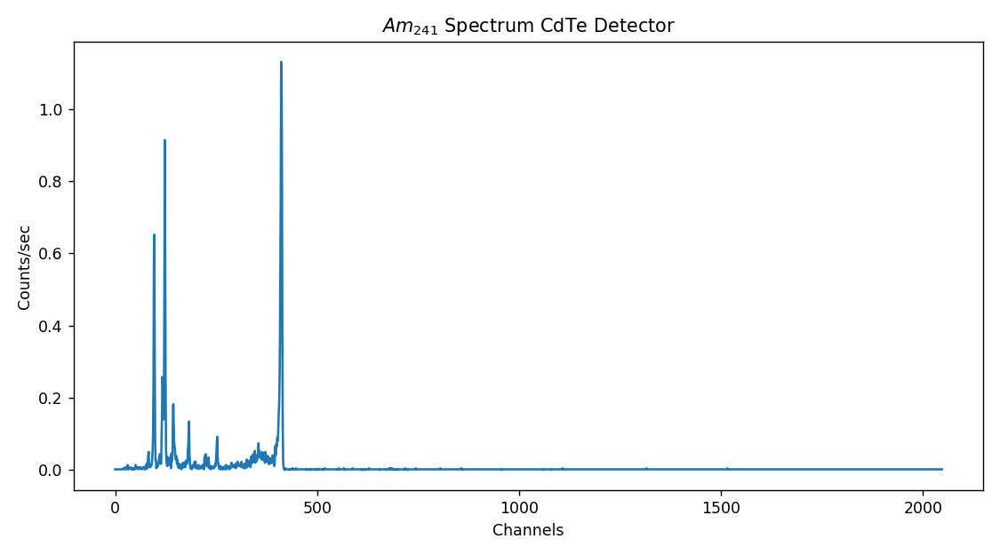

In [583]:
CdTe_Am_headers, CdTe_Am_channels, CdTe_Am_counts, CdTe_Am_minus_bkg = plot_CdTe_spectra(CdTe_bkg_file, CdTe_Am_file)

<IPython.core.display.Javascript object>


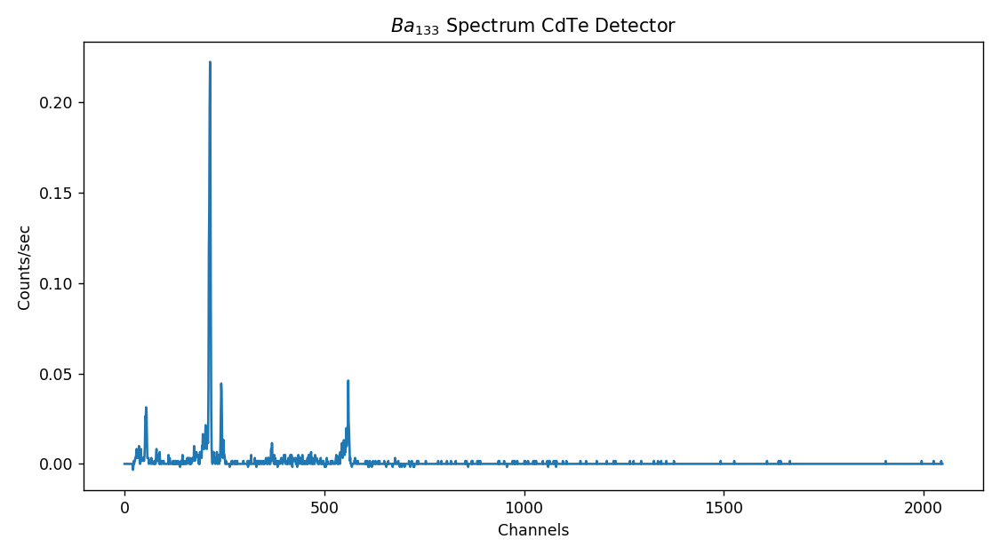

In [584]:
CdTe_Ba_headers, CdTe_Ba_channels, CdTe_Ba_counts, CdTe_Ba_minus_bkg = plot_CdTe_spectra(CdTe_bkg_file, CdTe_Ba_file)

<IPython.core.display.Javascript object>


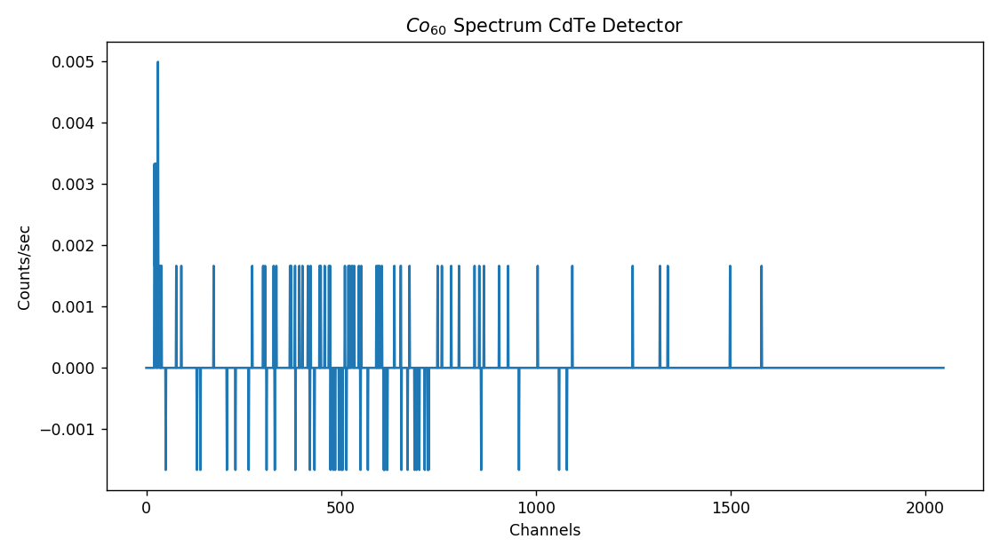

In [648]:
CdTe_Co_headers, CdTe_Co_channels, CdTe_Co_counts, CdTe_Co_minus_bkg = plot_CdTe_spectra(CdTe_bkg_file, CdTe_Co_file)

<IPython.core.display.Javascript object>


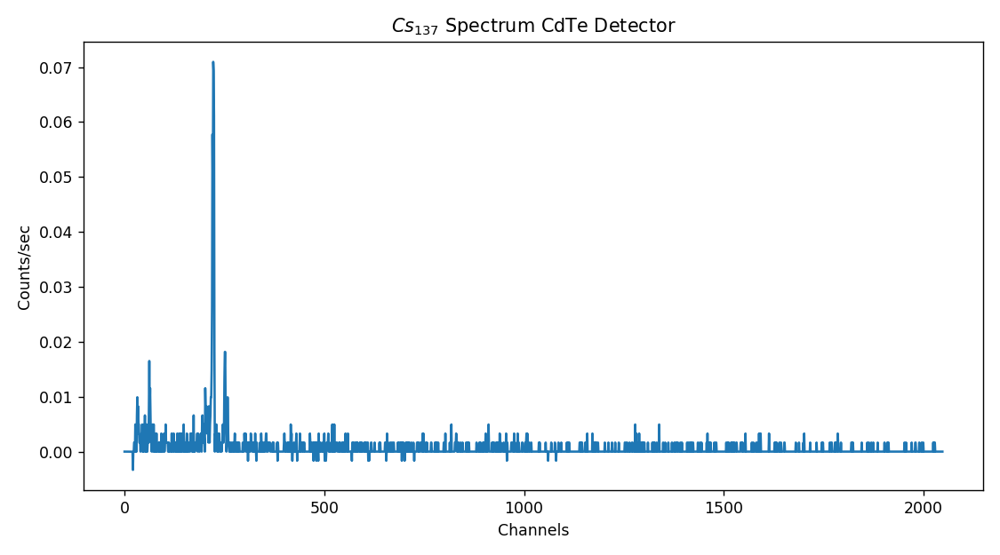

In [585]:
CdTe_Cs_headers, CdTe_Cs_channels, CdTe_Cs_counts, CdTe_Cs_minus_bkg = plot_CdTe_spectra(CdTe_bkg_file, CdTe_Cs_file)

In [586]:
def fitting_peaks_CdTe(channels, counts, lower, upper, height, width, title, channel_max):
    # find peaks
    peaks, _ = find_peaks(counts, height=height, width=width)
    
    # loop through peaks and fit gaussian
    model = GaussianModel()
    
    gauss_peaks = []
    centroids = []
    centroid_error = []
    fwhm = []
    fwhm_error = []
    fit_result = []
    
    fig, ax = plt.subplots(figsize=(9, 7))
    ax.plot(channels, counts, "--")
    
    peaknum = 1
    
    for peak in peaks:
        channel_range = np.arange((peak-lower), (peak+upper))
        
        params = model.guess(counts[channel_range], channels[channel_range])
        
        result = model.fit(counts[channel_range], x=channels[channel_range], params=params)
        
        # add result to peaks array
        gauss_peaks.append(result)
        centroids.append(result.params["center"].value)
        centroid_error.append(result.params["center"].stderr)
        fwhm.append(result.params["fwhm"].value)
        fwhm_error.append(result.params["fwhm"].stderr)
        fit_result.append(result)
        
        ax.plot(channels[channel_range], result.init_fit, "--", label=f"initial fit peak {peaknum}")
        ax.plot(channels[channel_range], result.best_fit, "-", label=f"best fit peak {peaknum}")
        
        peaknum += 1
        
    ax.set_title(f"{title} Fitted Peaks CdTe Detector", fontsize=16)
    ax.set_xlabel("Channels", fontsize=14)
    ax.set_ylabel("Counts/sec", fontsize=14)
    ax.legend()
    plt.xlim(0, channel_max)
    if "Ba" in title:
        energies = [53.1622, 80.9979, 356.0129]
    elif "Am" in title:
        energies = [59.5409]
    elif "Cs" in title:
        energies = [31.85]
        
    for energy, peak in zip(energies, peaks):
        plt.text(peak + 5, counts[peak], f"{energy:.1f} keV", color="red", fontsize=12)
        
    plt.savefig(f"Fitted_{title}_CdTe.png")
    plt.show()
        
    return fit_result, centroids, centroid_error, fwhm, fwhm_error

<IPython.core.display.Javascript object>


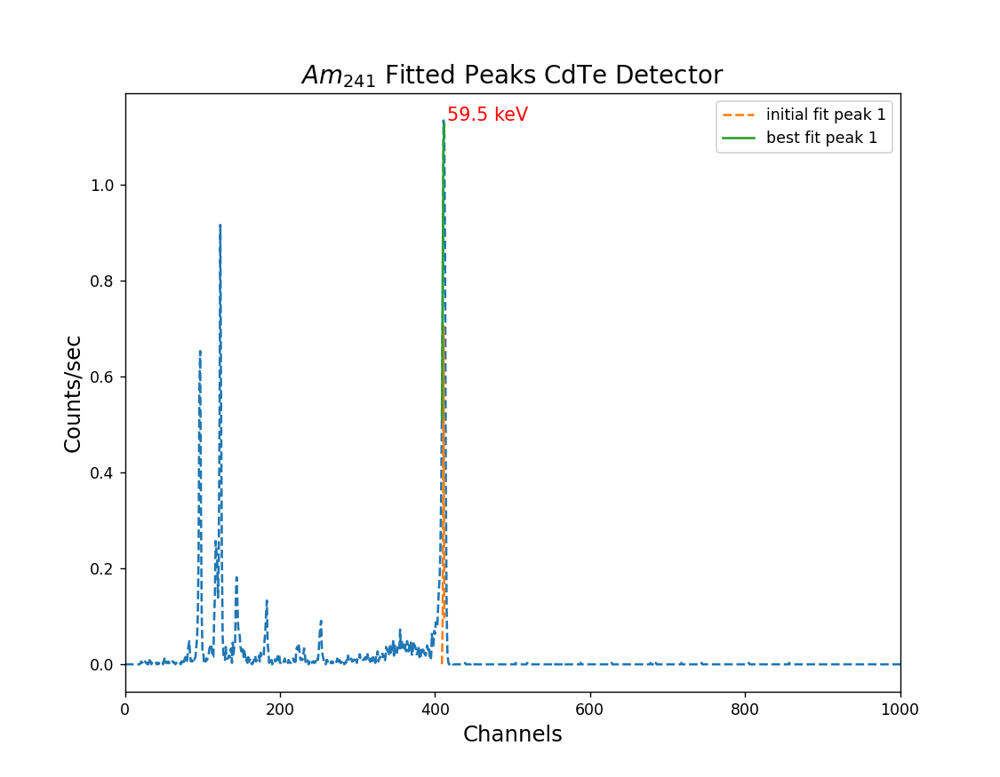

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [587]:
CdTe_Am_result, CdTe_Am_centroids, CdTe_Am_centroid_error, CdTe_Am_fwhm, CdTe_Am_fwhm_error = fitting_peaks_CdTe(CdTe_Am_channels, CdTe_Am_counts, 2, 2, 1.0, None, "$Am_{241}$", 1000)

In [497]:
CdTe_Am_result

In [498]:
%matplotlib notebook

<IPython.core.display.Javascript object>


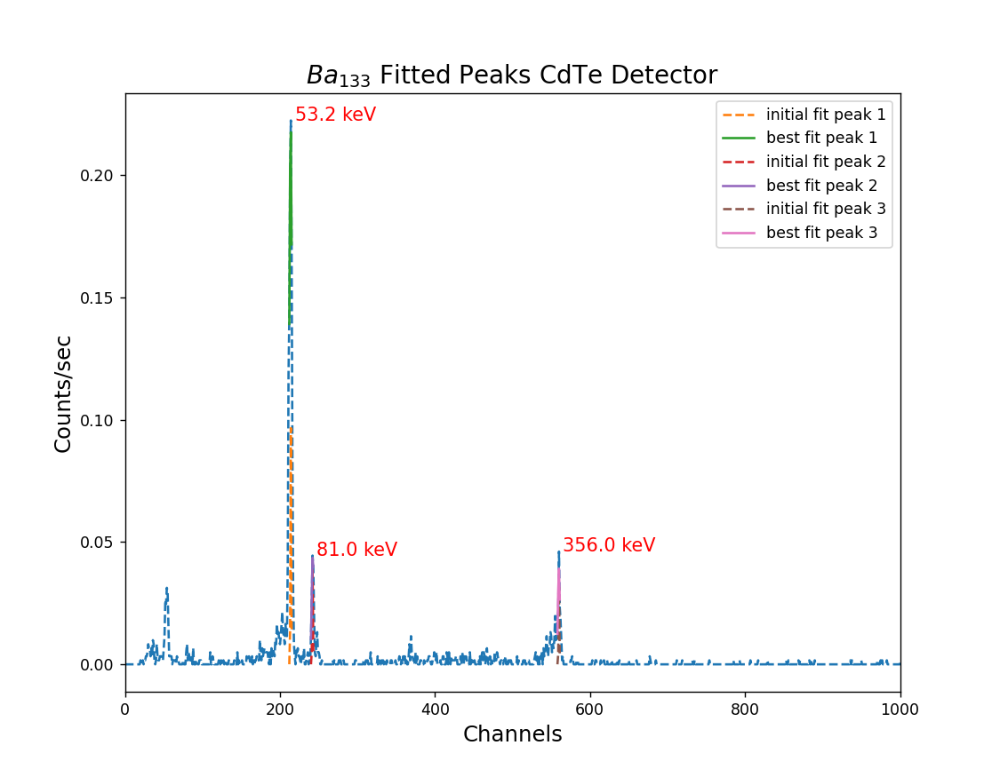

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")
C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [588]:
CdTe_Ba_result, CdTe_Ba_centroids, CdTe_Ba_centroid_error, CdTe_Ba_fwhm, CdTe_Ba_fwhm_error = fitting_peaks_CdTe(CdTe_Ba_channels, CdTe_Ba_counts, 2, 2, [0.04,0.25], None, "$Ba_{133}$", 1000)

<IPython.core.display.Javascript object>


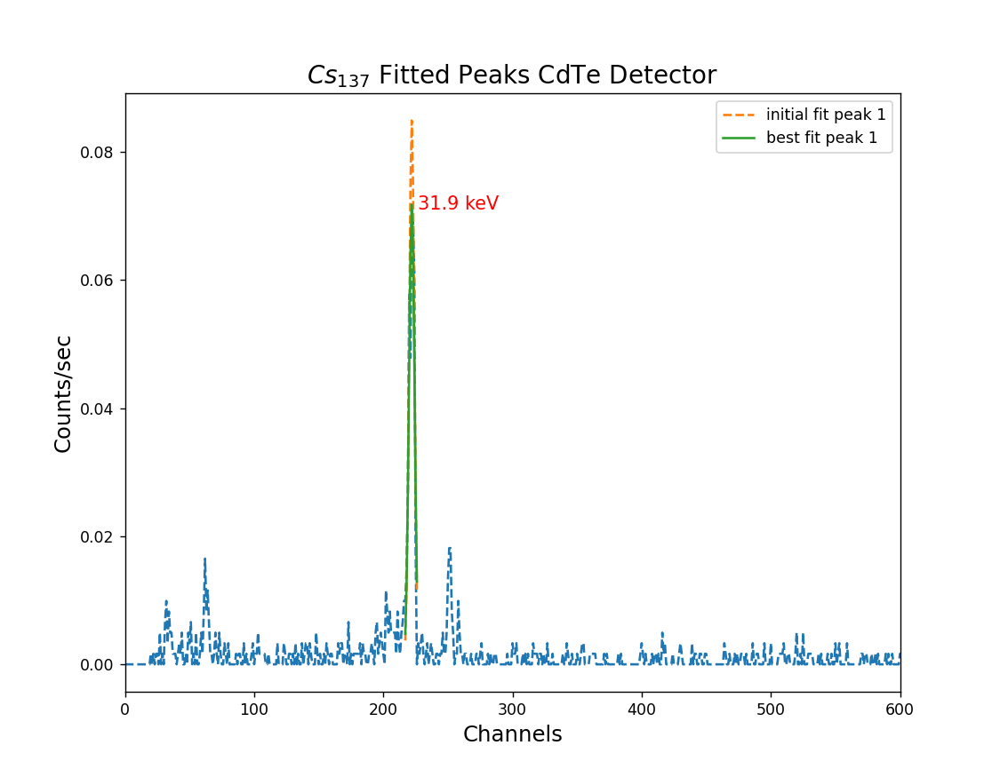

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [589]:
CdTe_Cs_result, CdTe_Cs_centroids, CdTe_Cs_centroid_error, CdTe_Cs_fwhm, CdTe_Cs_fwhm_error = fitting_peaks_CdTe(CdTe_Cs_channels, CdTe_Cs_counts, 5, 5, 0.06, None, "$Cs_{137}$", 600)

In [501]:
CdTe_dictionary = {"Barium-133":[CdTe_Ba_centroids, CdTe_Ba_centroid_error, Ba_energies],
                 "Americium-241":[CdTe_Am_centroids, CdTe_Am_centroid_error, Am_energies],
                 "Caesium-137":[CdTe_Cs_centroids, CdTe_Cs_centroid_error, Cs_energies]}

In [502]:
CdTe_dictionary

{'Barium-133': [[213.72838719616902, 242.33456083139748, 559.8928962423558],
  [0.07411034341056055, 0.1006631865637716, 0.48963604989899084],
  [53.1622, 80.9979, 356.0129]],
 'Americium-241': [[411.67064164477443], [0.5195831037852214], [59.5409]],
 'Caesium-137': [[222.0141652412732], [0.2492729354429266], [661.657]]}

In [503]:
CdTe_df = pd.DataFrame(data=CdTe_dictionary)
#df.to_csv('CdTe_results.csv', index=False)

In [504]:
CdTe_Cs_energy = [31.85]

In [505]:
CdTe_Cs_centroids

[222.0141652412732]

In [506]:
CdTe_channels = CdTe_Ba_centroids + CdTe_Am_centroids + CdTe_Cs_centroids
CdTe_energies = Ba_energies + Am_energies + CdTe_Cs_energy
CdTe_channel_errors = CdTe_Ba_centroid_error + CdTe_Am_centroid_error + CdTe_Cs_centroid_error

In [507]:
CdTe_channels

[213.72838719616902,
 242.33456083139748,
 559.8928962423558,
 411.67064164477443,
 222.0141652412732]

In [508]:
BGO_channel_errors = BGO_Ba_error + BGO_Am_error + BGO_Cs_error + BGO_Co_error

In [509]:
NaI_channel_errors = NaI_Ba_error + NaI_Am_error + NaI_Cs_error + NaI_Co_error

In [510]:
NaI_Co_error

[3.043937369048457, 3.481487248629066]

In [511]:
NaI_Co_error

[3.043937369048457, 3.481487248629066]

In [512]:
NaI_channel_errors

[0.28445135880797534,
 1.9761713245633226,
 0.19159261638367148,
 0.08143882903948549,
 0.12894909794896922,
 3.043937369048457,
 3.481487248629066]

In [651]:
from scipy import odr

def linear_fit_odr(energies, channels, channel_err, name):
    """
    Performs a linear calibration (Energy vs Channel) using scipy.odr,
    which properly accounts for uncertainties in the x-values (channels).

    Model: E = m*x + c

    Parameters
    ----------
    energies : array-like
        Known energies for calibration peaks (y-values)
    channels : array-like
        Measured centroid channel numbers (x-values)
    channel_err : array-like
        1σ uncertainties of the centroid channel numbers
    name : str
        Name for plot labeling

    Returns
    -------
    output : scipy.odr.Output
        ODR fit result object
    """
    # --- Convert inputs to numpy arrays ---
    energies = np.asarray(energies, dtype=float)
    channels = np.asarray(channels, dtype=float)
    channel_err = np.asarray(channel_err, dtype=float)

    # Define linear model function
    def linear_func(B, x):
        return B[0] * x + B[1]   # B[0] = slope, B[1] = intercept

    # Create Model and Data for ODR
    model = odr.Model(linear_func)
    data = odr.RealData(channels, energies, sx=channel_err, sy=None)

    # Set up ODR with initial guesses
    beta0 = [1.0, 0.0]  # initial guess for slope, intercept
    odr_instance = odr.ODR(data, model, beta0=beta0)

    # Run the fit
    output = odr_instance.run()

    # Extract fit results
    slope, intercept = output.beta
    slope_err, intercept_err = output.sd_beta

    # Generate fitted line for plotting
    xfit = np.linspace(min(channels)*0.95, max(channels)*1.05, 300)
    yfit = linear_func(output.beta, xfit)

    #Plot results
    fig, ax = plt.subplots(figsize=(9, 5))
    ax.errorbar(channels, energies, xerr=channel_err, fmt='o', capsize=3,
                label='Data with x-errors')
    ax.plot(xfit, yfit, 'r-', label='ODR linear fit')
    ax.set_title(f"{name} Energies vs Channels (ODR Fit)", fontsize=16)
    ax.set_xlabel(f"{name} Channels", fontsize=14)
    ax.set_ylabel(f"{name} Energies (keV)", fontsize=14)
    ax.legend()
    plt.savefig(f"{name}_linear_fit.png")
    plt.show()

    # Print results
    print(f"\nLinear ODR Fit Results for {name}")
    print(f"--------------------------------")
    print(f"Slope      = {slope:.6f} ± {slope_err:.6f}")
    print(f"Intercept  = {intercept:.6f} ± {intercept_err:.6f}")
    print(f"Residual Variance = {output.res_var:.6f}")

    return output

<IPython.core.display.Javascript object>


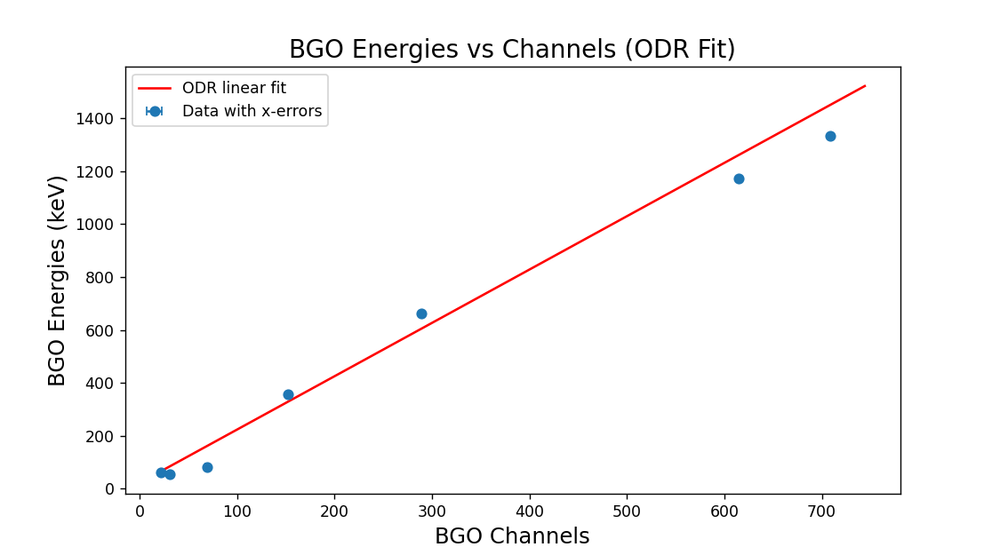


Linear ODR Fit Results for BGO
--------------------------------
Slope      = 2.017910 ± 0.125800
Intercept  = 21.129889 ± 28.208515
Residual Variance = 1767.266110


In [592]:
BGO_odr_output = linear_fit_odr(BGO_energies, BGO_channels, BGO_channel_errors, "BGO")

In [515]:
NaI_channel_errors

[0.28445135880797534,
 1.9761713245633226,
 0.19159261638367148,
 0.08143882903948549,
 0.12894909794896922,
 3.043937369048457,
 3.481487248629066]

<IPython.core.display.Javascript object>


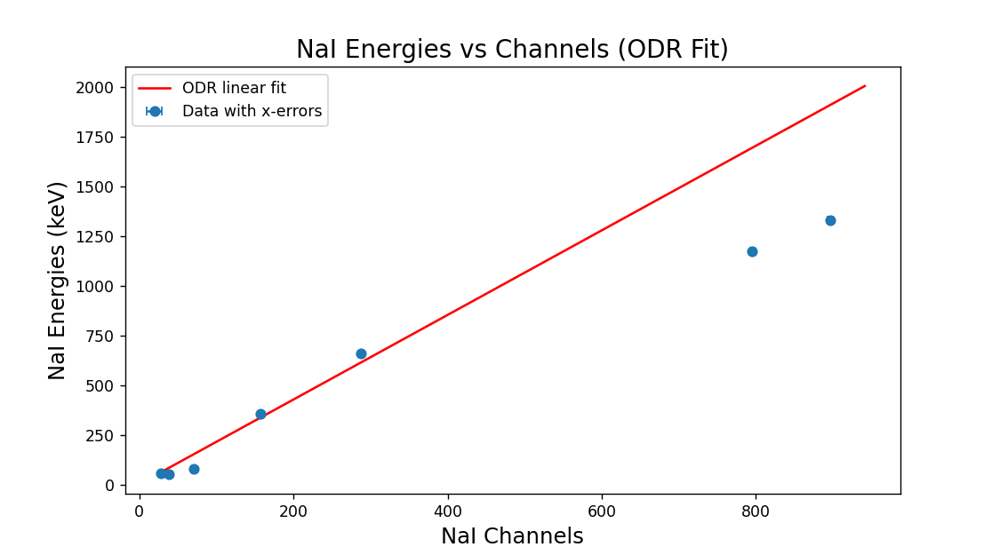


Linear ODR Fit Results for NaI
--------------------------------
Slope      = 2.124442 ± 0.249039
Intercept  = 5.228458 ± 44.663853
Residual Variance = 3112.101270


In [593]:
NaI_linear_odr_result = linear_fit_odr(NaI_energies, NaI_channels, NaI_channel_errors, "NaI")

<IPython.core.display.Javascript object>


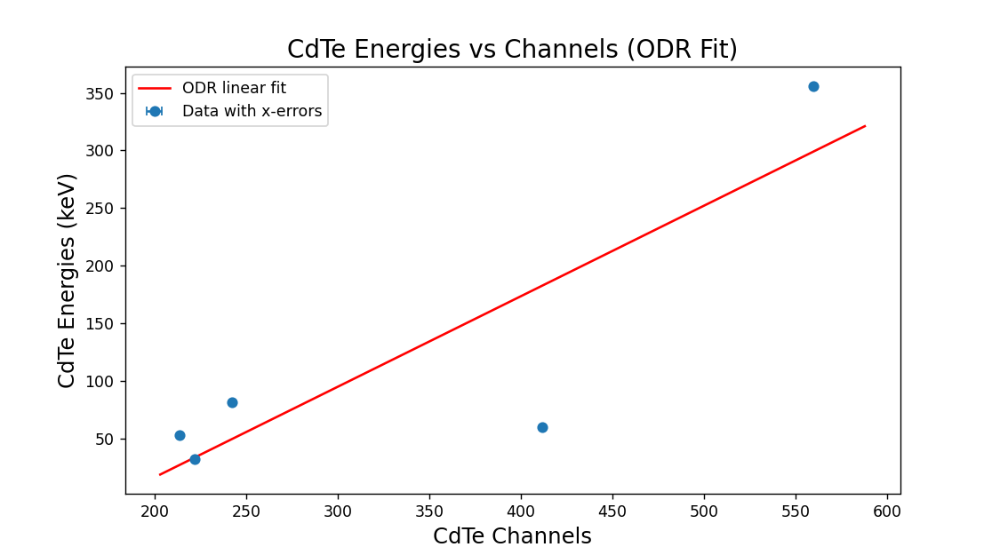


Linear ODR Fit Results for CdTe
--------------------------------
Slope      = 0.786180 ± 0.262261
Intercept  = -141.064780 ± 90.996156
Residual Variance = 5823.201112


In [594]:
CdTe_linear_odr_result = linear_fit_odr(CdTe_energies, CdTe_channels, CdTe_channel_errors, "CdTe")

In [518]:
def quadratic_fit_odr(energies, channels, channel_err, name):
    """
    Performs a quadratic calibration (Energy vs Channel) using scipy.odr,
    which properly accounts for uncertainties in x (channels).

    Model: E = a*x^2 + b*x + c

    Parameters
    ----------
    energies : array-like
        Known energies for calibration peaks (y-values)
    channels : array-like
        Measured centroid channel numbers (x-values)
    channel_err : array-like
        1σ uncertainties of the centroid channel numbers
    name : str
        Name for plot labeling

    Returns
    -------
    output : scipy.odr.Output
        ODR fit result object with parameters and uncertainties
    """
    # --- Convert to numpy arrays ---
    energies = np.asarray(energies, dtype=float)
    channels = np.asarray(channels, dtype=float)
    channel_err = np.asarray(channel_err, dtype=float)

    # --- Define quadratic model ---
    def quad_func(B, x):
        return B[0]*x**2 + B[1]*x + B[2]  # B = [a, b, c]

    # --- Create ODR Model and RealData objects ---
    model = odr.Model(quad_func)
    data = odr.RealData(channels, energies, sx=channel_err, sy=None)

    # --- Initial parameter guesses (rough but works fine) ---
    beta0 = [0.0, 1.0, 0.0]  # a, b, c

    # --- Run the ODR fit ---
    odr_instance = odr.ODR(data, model, beta0=beta0)
    output = odr_instance.run()

    # --- Extract results ---
    a, b, c = output.beta
    sa, sb, sc = output.sd_beta

    # --- Generate fitted curve for plotting ---
    xfit = np.linspace(min(channels)*0.9, max(channels)*1.1, 300)
    yfit = quad_func(output.beta, xfit)

    # --- Plot results ---
    fig, ax = plt.subplots(figsize=(9, 5))
    ax.errorbar(channels, energies, xerr=channel_err, fmt='o', capsize=3,
                label='Data with x-errors')
    ax.plot(xfit, yfit, 'r-', label='Quadratic ODR fit')
    ax.set_title(f"{name} Energies vs Channels (Quadratic ODR)")
    ax.set_xlabel(f"{name} Channels")
    ax.set_ylabel(f"{name} Energies (keV)")
    ax.legend()
    plt.show()

    # --- Print results ---
    print(f"\nQuadratic ODR Fit Results for {name}")
    print(f"-------------------------------------")
    print(f"a (x² term) = {a:.6e} ± {sa:.6e}")
    print(f"b (x term)  = {b:.6e} ± {sb:.6e}")
    print(f"c (offset)  = {c:.6e} ± {sc:.6e}")
    print(f"Residual Variance = {output.res_var:.6f}")

    return output

<IPython.core.display.Javascript object>


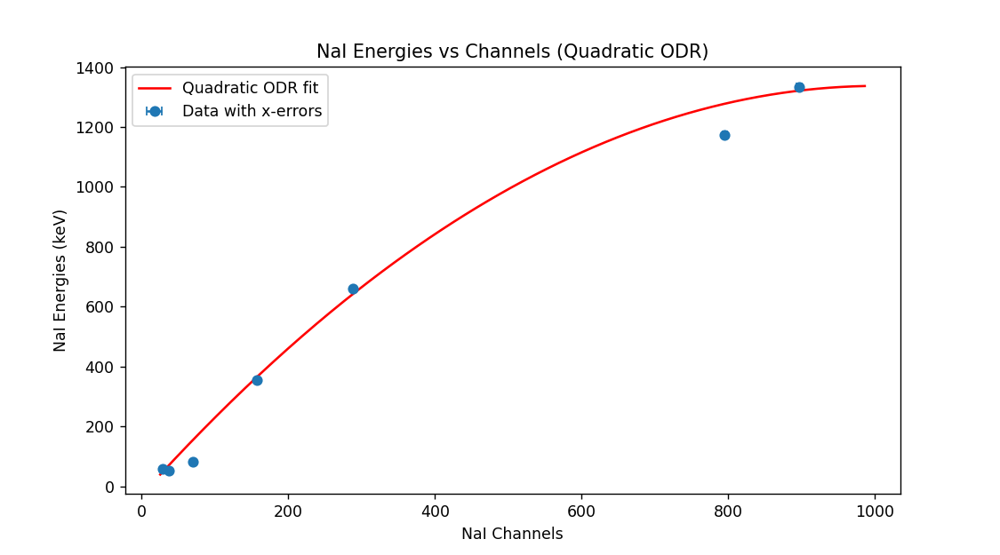


Quadratic ODR Fit Results for NaI
-------------------------------------
a (x² term) = -1.352506e-03 ± 1.930026e-04
b (x term)  = 2.718680e+00 ± 1.860730e-01
c (offset)  = -2.900165e+01 ± 2.433224e+01
Residual Variance = 730.410619


In [519]:
NaI_quad_odr_result = quadratic_fit_odr(NaI_energies, NaI_channels, NaI_channel_errors, "NaI")

<IPython.core.display.Javascript object>


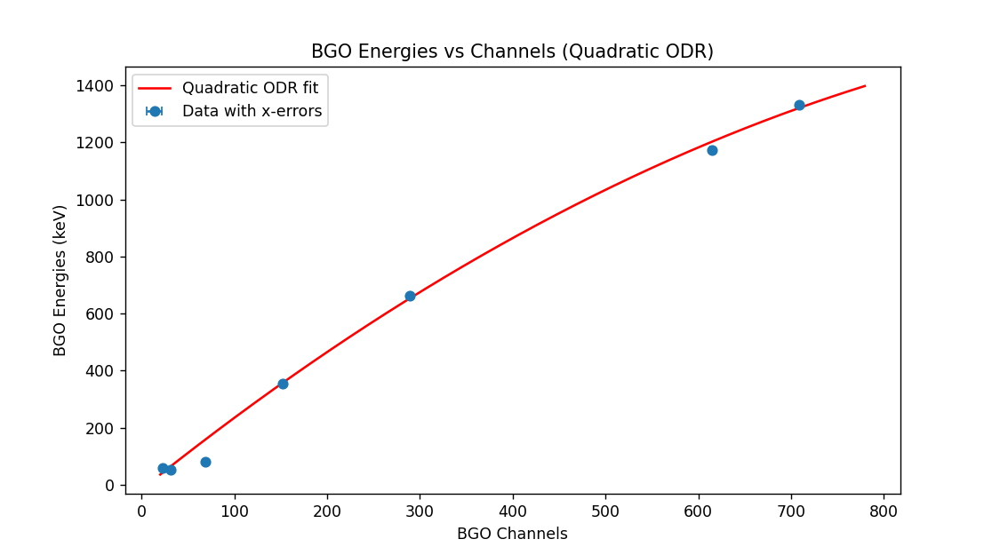


Quadratic ODR Fit Results for BGO
-------------------------------------
a (x² term) = -1.023988e-03 ± 2.102574e-04
b (x term)  = 2.612745e+00 ± 1.477845e-01
c (offset)  = -1.633542e+01 ± 1.619603e+01
Residual Variance = 380.497328


In [520]:
BGO_quad_odr_result = quadratic_fit_odr(BGO_energies, BGO_channels, BGO_channel_errors, "BGO")

In [521]:
## Energy Resolution
# Resolution at some peak  = FWHM / peak's energy
# supposed to make it a function of energy? ?? maybe plot resolution vs the energy

# Calculate Resolution
#Am241_BGO_Res = (Am_results[0].params['fwhm'].value)/Am_energies[0]

In [522]:
BGO_fwhm = BGO_Ba_fwhm + BGO_Am_fwhm + BGO_Cs_fwhm + BGO_Co_fwhm
BGO_fwhm_error = BGO_Ba_fwhm_error + BGO_Am_fwhm_error + BGO_Cs_fwhm_error + BGO_Co_fwhm_error

In [523]:
NaI_fwhm = NaI_Ba_fwhm + NaI_Am_fwhm + NaI_Cs_fwhm + NaI_Co_fwhm
NaI_fwhm_error = NaI_Ba_fwhm_error + NaI_Am_fwhm_error + NaI_Cs_fwhm_error + NaI_Co_fwhm_error

In [524]:
CdTe_fwhm = CdTe_Ba_fwhm + CdTe_Am_fwhm + CdTe_Cs_fwhm
CdTe_fwhm_error = CdTe_Ba_fwhm_error + CdTe_Am_fwhm_error + CdTe_Cs_fwhm_error

2.134484
[[Model]]
    Model(resolution_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 9
    # data points      = 7
    # variables        = 3
    chi-square         = 1.90805623
    reduced chi-square = 0.47701406
    Akaike info crit   = -3.09877575
    Bayesian info crit = -3.26104531
    R-squared          = -0.06381409
[[Variables]]
    alpha: -48.8469006 +/- 581.147342 (1189.73%) (init = 0.001)
    beta:   10.0176150 +/- 4.80110609 (47.93%) (init = 0.001)
    gamma:  0.00274705 +/- 0.00503077 (183.13%) (init = 0.001)
[[Correlations]] (unreported correlations are < 0.100)
    C(beta, gamma)  = -0.8603
    C(alpha, beta)  = -0.7377
    C(alpha, gamma) = +0.5455
<class 'numpy.ndarray'>


C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


<IPython.core.display.Javascript object>


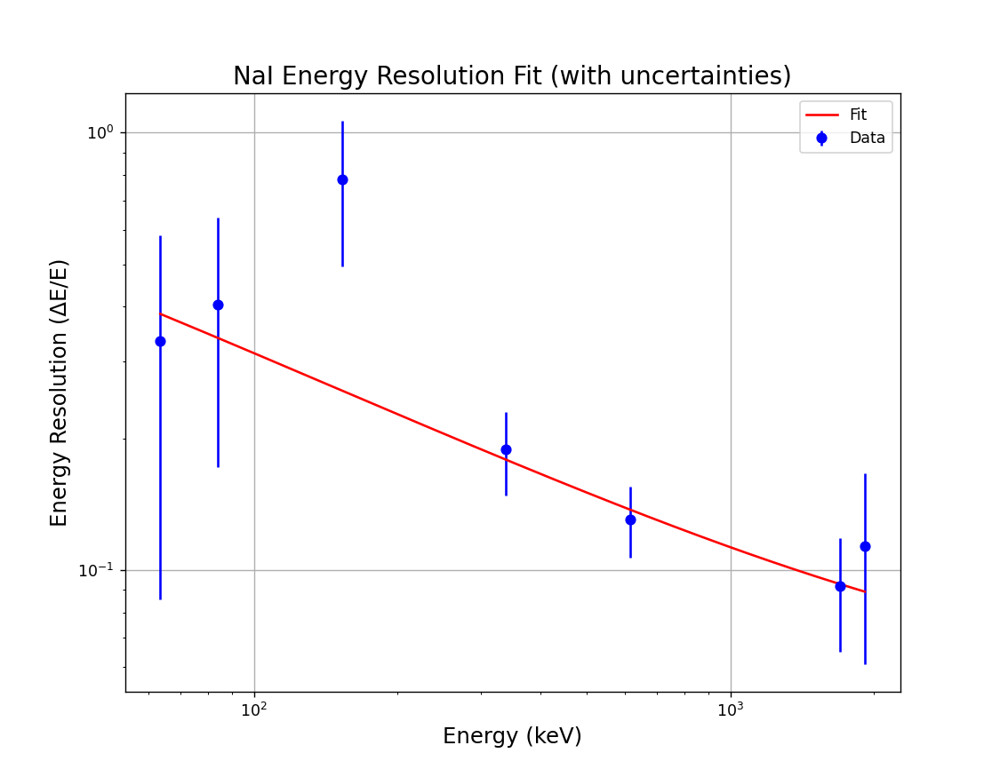

In [595]:
centers = np.array(NaI_channels)           # Gaussian peak centers (channels)
center_err = np.array(NaI_channel_errors)        # center uncertainties (if needed)

fwhm_ch = np.array(NaI_fwhm)           # FWHM in channels
fwhm_ch_err = np.array(NaI_fwhm_error)       # FWHM uncertainties

m, m_err = 2.134484, 0.255319
b, b_err = 2.703067, 46.010887

def E_of_C(C):
    return m*C + b

energies = E_of_C(centers)

# uncertainty propagation:
E_err = np.sqrt(
    (centers * m_err)**2 +
    (m * center_err)**2 +
    b_err**2
)

# derivative dE/dC = m
def dE_dC(C):
    return m

dEdC_vals = dE_dC(centers)
print(dEdC_vals)
# ΔE from channel FWHM
fwhm_E = np.abs(fwhm_ch * dEdC_vals)

# ΔE error propagation:
# ΔE = m * FWHM
# σ² = (FWHM σ_m)² + (m σ_FWHM)²
DeltaE_err = np.sqrt(
    (fwhm_ch * m_err)**2 +
    (m * fwhm_ch_err)**2
)

R = fwhm_E / energies

R_err = R * np.sqrt(
    (DeltaE_err / fwhm_E)**2 +
    (E_err / energies)**2
)

R2 = R**2
R2_err = 2 * R * R_err

def resolution_model(E, alpha, beta, gamma):
    return alpha*E**(-2) + beta*E**(-1) + gamma

model = Model(resolution_model)
params = model.make_params(alpha=1e-3, beta=1e-3, gamma=1e-3)

weights = 1.0 / R2_err

result = model.fit(R2, params, E=energies, weights=weights)

print(result.fit_report())
print(type(R))

plt.figure(figsize=(9,7))
E_plot = np.linspace(min(energies), max(energies), 500)
R2_fit_plot = model.eval(result.params, E=E_plot)

plt.errorbar(energies, R, yerr=R_err, fmt='o', label="Data", color='blue')
plt.plot(E_plot, np.sqrt(R2_fit_plot), color='red', label="Fit")

plt.xlabel("Energy (keV)", fontsize=14)
plt.ylabel("Energy Resolution (ΔE/E)", fontsize=14)
plt.title("NaI Energy Resolution Fit (with uncertainties)", fontsize=16)
plt.grid(True)
plt.legend()
plt.xscale("log")
plt.yscale("log")
plt.savefig("NaI_energy_resolution.png")
plt.show()

[[Model]]
    Model(resolution_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 9
    # data points      = 7
    # variables        = 3
    chi-square         = 6.72526115
    reduced chi-square = 1.68131529
    Akaike info crit   = 5.71972426
    Bayesian info crit = 5.55745470
    R-squared          = 0.08493072
[[Variables]]
    alpha:  502.333128 +/- 696.826584 (138.72%) (init = 0.001)
    beta:   9.64972116 +/- 3.85433382 (39.94%) (init = 0.001)
    gamma:  3.1159e-04 +/- 0.00333912 (1071.63%) (init = 0.001)
[[Correlations]] (unreported correlations are < 0.100)
    C(beta, gamma)  = -0.8978
    C(alpha, beta)  = -0.6917
    C(alpha, gamma) = +0.5042


C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


<IPython.core.display.Javascript object>


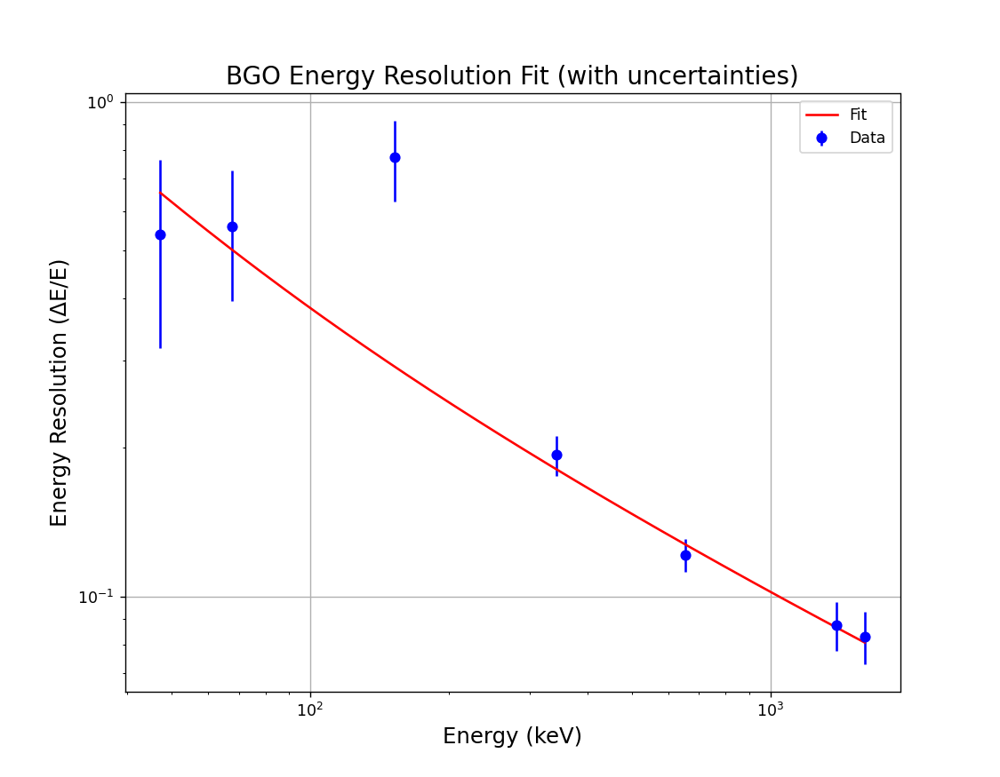

In [650]:
centers = np.array(BGO_channels)           # Gaussian peak centers (channels)
center_err = np.array(BGO_channel_errors)        # center uncertainties (if needed)

fwhm_ch = np.array(BGO_fwhm)           # FWHM in channels
fwhm_ch_err = np.array(BGO_fwhm_error)       # FWHM uncertainties

m, m_err = 2.268669, 0.112337
b, b_err = -3.646862, 19.174480

def E_of_C(C):
    return m*C + b

energies = E_of_C(centers)

# uncertainty propagation:
E_err = np.sqrt(
    (centers * m_err)**2 +
    (m * center_err)**2 +
    b_err**2
)

# derivative dE/dC = m
def dE_dC(C):
    return m

dEdC_vals = dE_dC(centers)

# ΔE from channel FWHM
fwhm_E = np.abs(fwhm_ch * dEdC_vals)

# ΔE error propagation:
# ΔE = m * FWHM
DeltaE_err = np.sqrt(
    (fwhm_ch * m_err)**2 +
    (m * fwhm_ch_err)**2
)

R = fwhm_E / energies

R_err = R * np.sqrt(
    (DeltaE_err / fwhm_E)**2 +
    (E_err / energies)**2
)

R2 = R**2
R2_err = 2 * R * R_err

def resolution_model(E, alpha, beta, gamma):
    return alpha*E**(-2) + beta*E**(-1) + gamma

model = Model(resolution_model)
params = model.make_params(alpha=1e-3, beta=1e-3, gamma=1e-3)

weights = 1.0 / R2_err

result = model.fit(R2, params, E=energies, weights=weights)

print(result.fit_report())

plt.figure(figsize=(9,7))
E_plot = np.linspace(min(energies), max(energies), 500)
R2_fit_plot = model.eval(result.params, E=E_plot)

plt.errorbar(energies, R, yerr=R_err, fmt='o', label="Data", color='blue')
plt.plot(E_plot, np.sqrt(R2_fit_plot), color='red', label="Fit")

plt.xlabel("Energy (keV)", fontsize=14)
plt.ylabel("Energy Resolution (ΔE/E)", fontsize=14)
plt.title("BGO Energy Resolution Fit (with uncertainties)", fontsize=16)
plt.grid(True)
plt.legend()
plt.xscale("log")
plt.yscale("log")
plt.savefig("BGO_energy_resolution.png")
plt.show()

[[Model]]
    Model(resolution_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 9
    # data points      = 5
    # variables        = 3
    chi-square         = 0.01816690
    reduced chi-square = 0.00908345
    Akaike info crit   = -22.0879597
    Bayesian info crit = -23.2596460
    R-squared          = 0.36089496
[[Variables]]
    alpha:  0.79691695 +/- 4.49505955 (564.06%) (init = 0.001)
    beta:   0.17146315 +/- 0.06466922 (37.72%) (init = 0.001)
    gamma: -5.2268e-04 +/- 1.7510e-04 (33.50%) (init = 0.001)
[[Correlations]] (unreported correlations are < 0.100)
    C(beta, gamma)  = -0.9885
    C(alpha, beta)  = -0.8773
    C(alpha, gamma) = +0.7992


C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


<IPython.core.display.Javascript object>


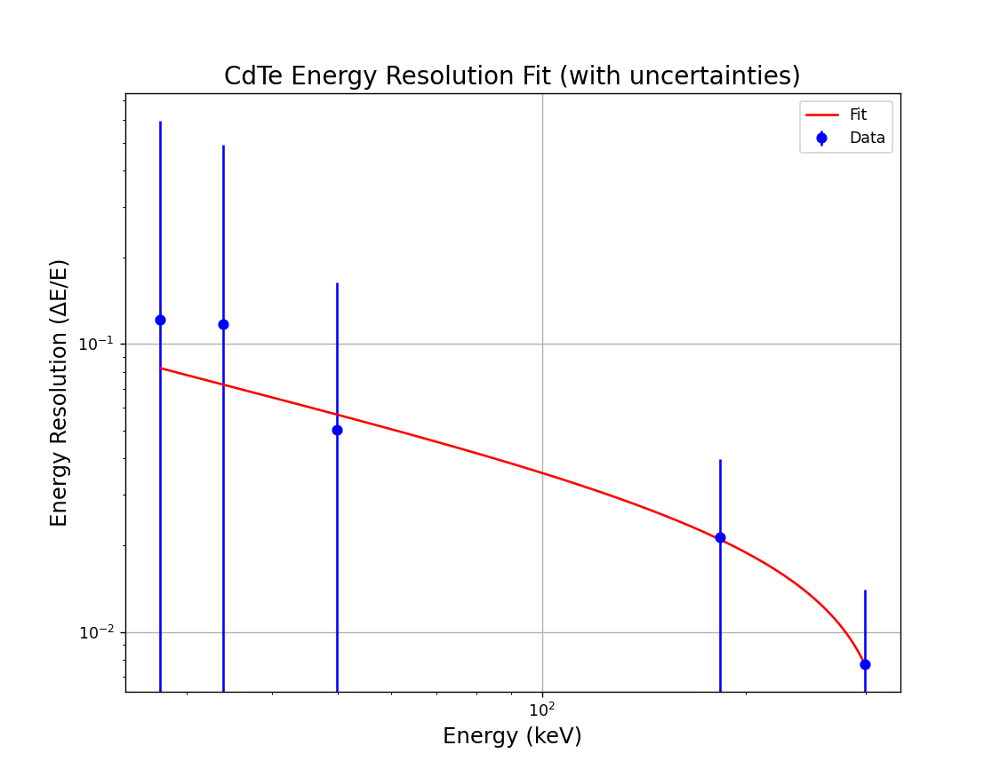

In [649]:
centers = np.array(CdTe_channels)           # Gaussian peak centers (channels)
center_err = np.array(CdTe_channel_errors)        # center uncertainties (if needed)

fwhm_ch = np.array(CdTe_fwhm)           # FWHM in channels
fwhm_ch_err = np.array(CdTe_fwhm_error)       # FWHM uncertainties

m, m_err = 0.784722, 0.261742
b, b_err = -140.329479, 90.780284

def E_of_C(C):
    return m*C + b

energies = E_of_C(centers)

# uncertainty propagation:
E_err = np.sqrt(
    (centers * m_err)**2 +
    (m * center_err)**2 +
    b_err**2
)

# derivative dE/dC = m
def dE_dC(C):
    return m

dEdC_vals = dE_dC(centers)

# ΔE from channel FWHM
fwhm_E = np.abs(fwhm_ch * dEdC_vals)

# ΔE error propagation:
# ΔE = m * FWHM
DeltaE_err = np.sqrt(
    (fwhm_ch * m_err)**2 +
    (m * fwhm_ch_err)**2
)

R = fwhm_E / energies

R_err = R * np.sqrt(
    (DeltaE_err / fwhm_E)**2 +
    (E_err / energies)**2
)

R2 = R**2
R2_err = 2 * R * R_err

def resolution_model(E, alpha, beta, gamma):
    return alpha*E**(-2) + beta*E**(-1) + gamma

model = Model(resolution_model)
params = model.make_params(alpha=1e-3, beta=1e-3, gamma=1e-3)

weights = 1.0 / R2_err

result = model.fit(R2, params, E=energies, weights=weights)

print(result.fit_report())

plt.figure(figsize=(9,7))
E_plot = np.linspace(min(energies), max(energies), 500)
R2_fit_plot = model.eval(result.params, E=E_plot)

plt.errorbar(energies, R, yerr=R_err, fmt='o', label="Data", color='blue')
plt.plot(E_plot, np.sqrt(R2_fit_plot), color='red', label="Fit")

plt.xlabel("Energy (keV)", fontsize=14)
plt.ylabel("Energy Resolution (ΔE/E)", fontsize=14)
plt.title("CdTe Energy Resolution Fit (with uncertainties)", fontsize=16)
plt.grid(True)
plt.xscale("log")
plt.yscale("log")
plt.legend()
plt.savefig("CdTe_energy_resolution.png")
plt.show()

In [528]:
def find_efficiencies(detector, source, source_results):
    """
    detector: "BGO", "NaI", or "CdTe"
    source: "AM", "BA", "CS","CO"
    """

    ## Defining Source Activity and Detector Features
    # Source Activity Dec 1st 1979 (from box info)
    Am241_SA = 11.16 #microCurie
    Ba133_SA = 11.42
    Cs137_SA = 11.16
    Co60_SA = 12.28

    # Source Half-Life (from Student Handbook)
    Am241_HL = 432.2
    Ba133_HL = 10.537
    Cs137_HL = 30.09
    Co60_HL = 5.2714

    # Detector Diameter (from Datasheets)
    BGO_r = 2*2.54 # cm circular
    NaI_r = 2*2.54 # cm circular BUT NOT FROM CORRECT BIT OF DATASHEET
    CdTe_r = 3/10 # cm square

    # Detector Surface Area (cm**2)
    BGO_area = np.pi*(BGO_r**2)
    NaI_area = np.pi*(NaI_r**2)
    CdTe_area = CdTe_r**2

    # Source Distance to Detector (from Eris's measurements)
    BGO_d = 15 #cm
    NaI_d = 16 #cm
    CdTe_d = 10 #cm

    # Years since December 1st 1979 till Oct 21st (BGO) Oct 28th (NaI) and Nov 4 (CdTe)
    from datetime import datetime

    # Google Gemini generated code I turned into a function
    # (was going to just google: how long since __ but this is nicer)
    def how_long_yrs(date0, date1):
        from datetime import datetime

        # Calculate the difference
        difference = date1 - date0

        # Extract the years
        years = difference.days / 365
        
        return years

    # When we ran each detector
    date_start = datetime(1979, 12, 1)
    date_BGO = datetime(2025, 10, 21)
    date_NaI = datetime(2025, 10, 28)
    date_CdTe = datetime(2025, 11, 4)

    years_BGO = how_long_yrs(date_start, date_BGO)
    years_NaI = how_long_yrs(date_start, date_NaI)
    years_CdTe = how_long_yrs(date_start, date_CdTe)

    # Peak Energies
    Ba_energies = [53.1622, 80.9979, 356.0129]
    Am_energies = [59.5409]
    Cs_energies = [661.657]
    Co_energies = [1173.228, 1332.492]

    # Create function that calculates current activity
    def activity_now(init_activity, half_life, time):
        import numpy as np
        
        current_activity = init_activity*np.exp(-(np.log(2)*time)/half_life)
        
        return current_activity

    ## Calculating Efficiencies

    abs_eff = []
    intr_eff = []


    if "Am" in source:
        # Americium has 1 Peak
        # Peak Total Counts Detected (in cps)
        Am_counts = source_results[0].params['amplitude'].value

        if "BGO" in detector:
            # Current Activity
            Am_CA = activity_now(Am241_SA, Am241_HL, years_BGO)*37000

            # Geometric Factor
            G0 = BGO_area / (4*np.pi*BGO_d**2)

        if "NaI" in detector:
            # Current Activity
            Am_CA = activity_now(Am241_SA, Am241_HL, years_NaI)*37000

            # Geometric Factor
            G0 = NaI_area / (4*np.pi*NaI_d**2)

        if "CdTe" in detector:
            # Current Activity
            Am_CA = activity_now(Am241_SA, Am241_HL, years_CdTe)*37000

            # Geometric Factor
            G0 = CdTe_area / (4*np.pi*CdTe_d**2)

        # Emmission Fraction
        Am_em_frac = 0.3578

        # Absolute Efficiency
        Am_abs_eff = Am_counts / (Am_CA * Am_em_frac)
        abs_eff.append(Am_abs_eff)

        # Intrinsic Efficiency
        Am_intr_eff = Am_counts / (Am_CA * G0 * Am_em_frac)
        intr_eff.append(Am_intr_eff)

    elif "Ba" in source:
        # Barium has 3 Peaks
        Ba_em_fracs = [0.0214, 0.329, 0.6205]
        index = 0
        
        if "BGO" in detector:
            # Current Activity
            Ba_CA = activity_now(Ba133_SA, Ba133_HL, years_BGO)*37000
        
            # Geometric Factor
            G0 = BGO_area / (4*np.pi*BGO_d**2)

        elif "NaI" in detector:
            # Current Activity
            Ba_CA = activity_now(Ba133_SA, Ba133_HL, years_NaI)*37000
            # Geometric Factor
            G0 = NaI_area / (4*np.pi*NaI_d**2)

        elif "CdTe" in detector:
            # Current Activity
            Ba_CA = activity_now(Ba133_SA, Ba133_HL, years_CdTe)*37000
            # Geometric Factor
            G0 = CdTe_area / (4*np.pi*CdTe_d**2)

        for result in source_results:
            # Peak Total Counts Detected (in cps)
            Ba_counts = result.params['amplitude'].value
        
            # Emmission Fraction
            Ba_em_frac = Ba_em_fracs[index]
        
            # Absolute Efficiency
            Ba_abs_eff = Ba_counts / (Ba_CA * Ba_em_frac)
            abs_eff.append(Ba_abs_eff)
        
            # Intrinsic Efficiency
            Ba_intr_eff = Ba_counts / (Ba_CA * G0 * Ba_em_frac)
            intr_eff.append(Ba_intr_eff)
            index += 1

    elif "Cs" in source:
        # Cesium has 1 Peak
        
        if "BGO" in detector:
            # Current Activity
            Cs_CA = activity_now(Cs137_SA, Cs137_HL, years_BGO)*37000
            # Geometric Factor
            G0 = BGO_area / (4*np.pi*BGO_d**2)

        elif "NaI" in detector:
            # Current Activity
            Cs_CA = activity_now(Cs137_SA, Cs137_HL, years_NaI)*37000
            # Geometric Factor
            G0 = NaI_area / (4*np.pi*NaI_d**2)

        elif "CdTe" in detector:
            # Current Activity
            Cs_CA = activity_now(Cs137_SA, Cs137_HL, years_CdTe)*37000
            # Geometric Factor
            G0 = CdTe_area / (4*np.pi*CdTe_d**2)

        # Peak Total Counts Detected (in cps)
        Cs_counts = source_results[0].params['amplitude'].value

        # Emmission Fraction
        Cs_em_frac = 0.8499

        # Absolute Efficiency
        Cs_abs_eff = Cs_counts / (Cs_CA * Cs_em_frac)
        abs_eff.append(Cs_abs_eff)

        # Intrinsic Efficiency
        Cs_intr_eff = Cs_counts / (Cs_CA * G0 * Cs_em_frac)
        intr_eff.append(Cs_intr_eff)

    elif "Co" in source:
        # Cobalt has 2 Peaks
        Co_em_fracs = [0.9985, 0.999826]
        index = 0

        if "BGO" in detector:
            # Current Activity
            Co_CA = activity_now(Co60_SA, Co60_HL, years_BGO)*37000

            #Geometric Factor
            G0 = BGO_area / (4*np.pi*BGO_d**2)

        elif "NaI" in detector:
            # Current Activity
            Co_CA = activity_now(Co60_SA, Co60_HL, years_NaI)*37000
            # Geometric Factor
            G0 = NaI_area / (4*np.pi*NaI_d**2)

        elif "CdTe" in detector:
            # Current Activity
            Co_CA = activity_now(Co60_SA, Co60_HL, years_CdTe)*37000
            # Geometric Factor
            G0 = CdTe_area / (4*np.pi*CdTe_d**2)

        for result in source_results:
            # Peak Total Counts Detected (in cps)
            Co_counts = result.params['amplitude'].value
            
            # Emmission Fraction
            Co_em_frac = Co_em_fracs[index]
        
            # Absolute Efficiency
            Co_abs_eff = Co_counts / (Co_CA * Co_em_frac)
            abs_eff.append(Co_abs_eff)
        
            # Intrinsic Efficiency
            Co_intr_eff = Co_counts / (Co_CA * G0 * Co_em_frac)
            intr_eff.append(Co_intr_eff)
        
            index += 1


    return abs_eff, intr_eff


In [529]:
CdTe_Ba_result[0].params["amplitude"].value

0.9956230989465479

In [530]:
Ba_abs_eff, Ba_intr_eff = find_efficiencies("CdTe", "Ba", CdTe_Ba_result)

In [531]:
Ba_intr_eff

[31.606314414356873, 0.3160480206520143, 0.13450575655873576]

In [617]:
def plot_efficiencies(detector, Am_results, Ba_results, Co_results, Cs_results):
    """
    detector: "BGO", "NaI", or "CdTe"
    results: result array of elements: source order: Am, Ba, Co, Cs (alphabetical)
    """
    # Peak Energies
    Am_energies = [59.5409]
    Ba_energies = [53.1622, 80.9979, 356.0129]
    Co_energies = [1173.228, 1332.492]
    Cs_energies = [661.657]

    if "BGO" in detector:
        # Find Efficiencies
        Am_abs_eff, Am_intr_eff = find_efficiencies("BGO", "Am", Am_results)
        Ba_abs_eff, Ba_intr_eff = find_efficiencies("BGO", "Ba", Ba_results)
        Co_abs_eff, Co_intr_eff = find_efficiencies("BGO", "Co", Co_results)
        Cs_abs_eff, Cs_intr_eff = find_efficiencies("BGO", "Cs", Cs_results)

        # Title
        label_a = 'BGO Absolute Efficiency vs Energy'
        label_i = 'BGO Intrinsic Efficiency vs Energy'

    elif "NaI" in detector:
        # Find Efficiencies
        Am_abs_eff, Am_intr_eff = find_efficiencies("NaI", "Am", Am_results)
        Ba_abs_eff, Ba_intr_eff = find_efficiencies("NaI", "Ba", Ba_results)
        Co_abs_eff, Co_intr_eff = find_efficiencies("NaI", "Co", Co_results)
        Cs_abs_eff, Cs_intr_eff = find_efficiencies("NaI", "Cs", Cs_results)

        # Title
        label_a = 'NaI Absolute Efficiency vs Energy'
        label_i = 'NaI Intrinsic Efficiency vs Energy'

    elif "CdTe" in detector:
        # Find Efficiencies
        Am_abs_eff, Am_intr_eff = find_efficiencies("CdTe", "Am", Am_results)
        Ba_abs_eff, Ba_intr_eff = find_efficiencies("CdTe", "Ba", Ba_results)
        Co_abs_eff, Co_intr_eff = find_efficiencies("CdTe", "Co", Co_results)
        Cs_abs_eff, Cs_intr_eff = find_efficiencies("CdTe", "Cs", Cs_results)

        # Different Energy for Cesium
        Cs_energies = [31.85]

        # Title
        label_a = 'CdTe Absolute Efficiency vs Energy'
        label_i = 'CdTe Intrinsic Efficiency vs Energy'

    # Absolute vs Energies
    yval_a = Am_abs_eff + Ba_abs_eff + Co_abs_eff + Cs_abs_eff
    xval = Am_energies + Ba_energies + Co_energies + Cs_energies
    
    print(len(yval_a))
    print(len(xval))

    fig, ax = plt.subplots(figsize=(9,5))
    ax.scatter(xval, yval_a)
    plt.xlabel(f'{detector} Peak Energies (keV)', fontsize=14)
    plt.ylabel(f'{detector} Absolute Efficiency', fontsize=14)
    plt.xscale("log")
    plt.yscale("log")
    plt.title(label_a, fontsize=16)
    plt.savefig(f"{detector}_absolute.png")


    # Intrinsic vs Energies
    yval_i = Am_intr_eff + Ba_intr_eff + Co_intr_eff + Cs_intr_eff

    fig, ax = plt.subplots(figsize=(9,5))
    ax.scatter(xval, yval_i)
    plt.xlabel(f'{detector} Peak Energies (keV)', fontsize=14)
    plt.ylabel(f'{detector} Intrinsic Efficiency', fontsize=14)
    plt.xscale("log")
    plt.yscale("log")
    plt.title(label_i, fontsize=16)
    plt.savefig(f"{detector}_intrinsic.png")
    
    return yval_a, yval_i

In [614]:
def plot_CdTe_efficiencies(detector, Am_results, Ba_results, Cs_results):
    """
    detector: "BGO", "NaI", or "CdTe"
    results: result array of elements: source order: Am, Ba, Co, Cs (alphabetical)
    """
    # Peak Energies
    Am_energies = [59.5409]
    Ba_energies = [53.1622, 80.9979, 356.0129]
    #Co_energies = [1173.228, 1332.492]
    Cs_energies = [661.657]

    if "BGO" in detector:
        # Find Efficiencies
        Am_abs_eff, Am_intr_eff = find_efficiencies("BGO", "Am", Am_results)
        Ba_abs_eff, Ba_intr_eff = find_efficiencies("BGO", "Ba", Ba_results)
        #Co_abs_eff, Co_intr_eff = find_efficiencies("BGO", "Co", Co_results)
        Cs_abs_eff, Cs_intr_eff = find_efficiencies("BGO", "Cs", Cs_results)

        # Title
        label_a = 'BGO Absolute Efficiency vs Energy'
        label_i = 'BGO Intrinsic Efficiency vs Energy'

    elif "NaI" in detector:
        # Find Efficiencies
        Am_abs_eff, Am_intr_eff = find_efficiencies("NaI", "Am", Am_results)
        Ba_abs_eff, Ba_intr_eff = find_efficiencies("NaI", "Ba", Ba_results)
        #Co_abs_eff, Co_intr_eff = find_efficiencies("NaI", "Co", Co_results)
        Cs_abs_eff, Cs_intr_eff = find_efficiencies("NaI", "Cs", Cs_results)

        # Title
        label_a = 'NaI Absolute Efficiency vs Energy'
        label_i = 'NaI Intrinsic Efficiency vs Energy'

    elif "CdTe" in detector:
        # Find Efficiencies
        Am_abs_eff, Am_intr_eff = find_efficiencies("CdTe", "Am", Am_results)
        Ba_abs_eff, Ba_intr_eff = find_efficiencies("CdTe", "Ba", Ba_results)
        #Co_abs_eff, Co_intr_eff = find_efficiencies("CdTe", "Co", Co_results)
        Cs_abs_eff, Cs_intr_eff = find_efficiencies("CdTe", "Cs", Cs_results)

        # Different Energy for Cesium
        Cs_energies = [31.85]

        # Title
        label_a = 'CdTe Absolute Efficiency vs Energy'
        label_i = 'CdTe Intrinsic Efficiency vs Energy'

    # Absolute vs Energies
    yval_a = Am_abs_eff + Ba_abs_eff + Cs_abs_eff
    xval = Am_energies + Ba_energies + Cs_energies
    
    print(len(yval_a))
    print(len(xval))

    fig, ax = plt.subplots(figsize=(9,5))
    ax.scatter(xval, yval_a)
    plt.xlabel(f'{detector} Peak Energies (keV)', fontsize=14)
    plt.ylabel(f'{detector} Absolute Efficiency', fontsize=14)
    plt.xscale("log")
    plt.yscale("log")
    plt.title(label_a, fontsize=16)
    plt.savefig(f"{detector}_absolute.png")


    # Intrinsic vs Energies
    yval_i = Am_intr_eff + Ba_intr_eff + Cs_intr_eff

    fig, ax = plt.subplots(figsize=(9,5))
    ax.scatter(xval, yval_i)
    plt.xlabel(f'{detector} Peak Energies (keV)', fontsize=14)
    plt.ylabel(f'{detector} Intrinsic Efficiency', fontsize=14)
    plt.xscale("log")
    plt.yscale("log")
    plt.title(label_i, fontsize=16)
    plt.savefig(f"{detector_intrinsic.png")
    
    return yval_a, yval_i

In [534]:
BGO_Am_result[0].params['amplitude'].value

1441.891856863106

5
5


<IPython.core.display.Javascript object>


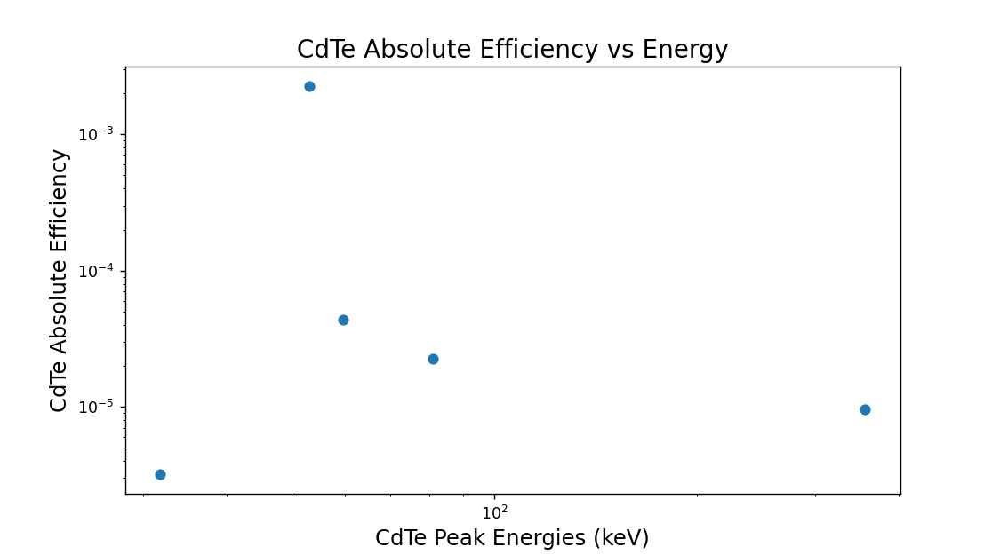

<IPython.core.display.Javascript object>


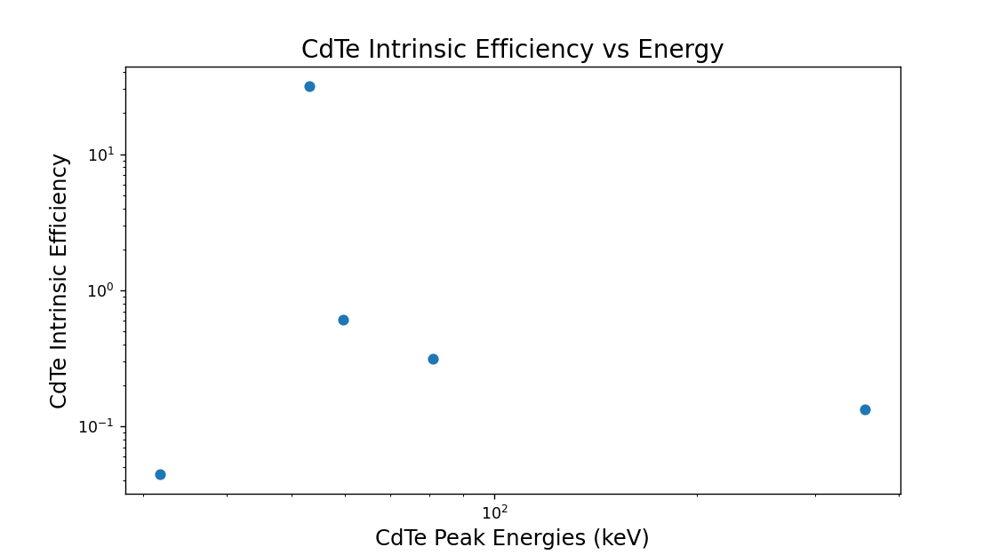

In [615]:
CdTe_abs_efficiency, CdTe_int_eff = plot_CdTe_efficiencies("CdTe", CdTe_Am_result, CdTe_Ba_result, CdTe_Cs_result)

In [536]:
CdTe_abs_efficiency

[4.3711754914828846e-05,
 0.0022636355273826835,
 2.2635272133529875e-05,
 9.633265213787063e-06,
 3.181403611069831e-06]

In [537]:
CdTe_int_eff

[0.6103312360708615,
 31.606314414356873,
 0.3160480206520143,
 0.13450575655873576,
 0.04442077427840454]

7
7


<IPython.core.display.Javascript object>


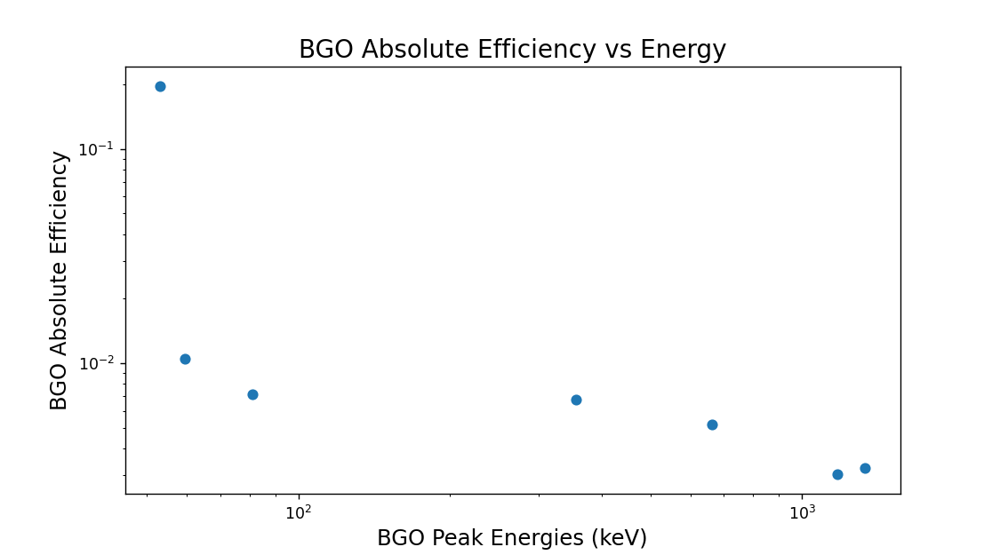

<IPython.core.display.Javascript object>


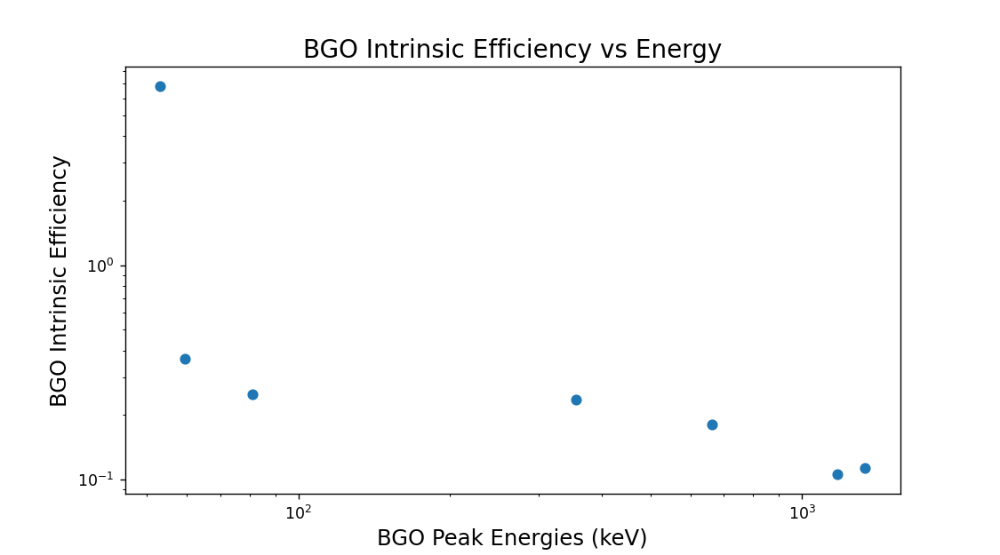

In [618]:
BGO_abs_eff, BGO_intr_eff = plot_efficiencies("BGO", BGO_Am_result, BGO_Ba_result, BGO_Co_result, BGO_Cs_result)

In [539]:
BGO_abs_eff

[0.010505346521637435,
 0.19619256194630394,
 0.007160118826756376,
 0.0067689007755431085,
 0.0030230069387079672,
 0.003255028030609231,
 0.005195714196674825]

In [540]:
BGO_intr_eff

[0.366374692691491,
 6.842229282335915,
 0.24970964350241565,
 0.2360658866788393,
 0.10542757784259604,
 0.11351932960615614,
 0.18120089501082454]

7
7


<IPython.core.display.Javascript object>


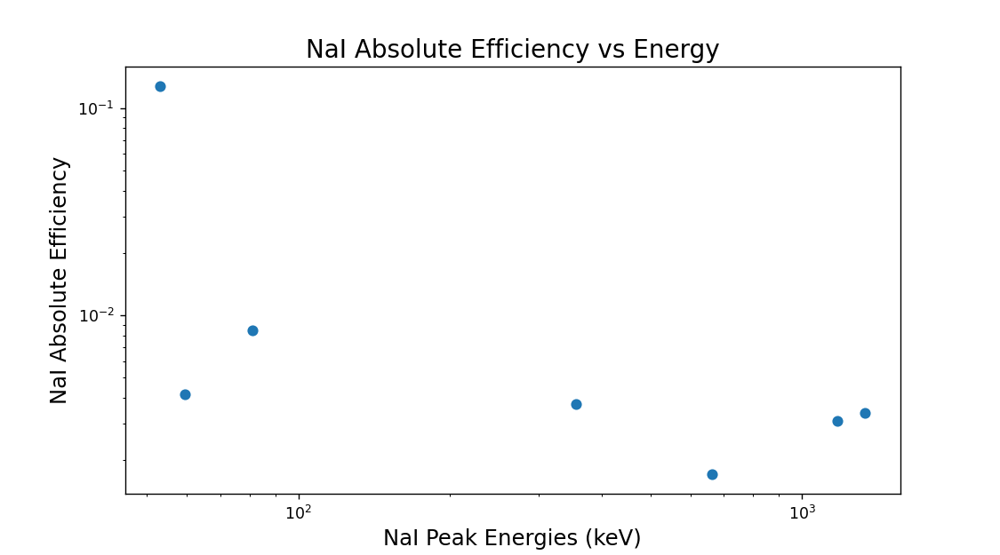

<IPython.core.display.Javascript object>


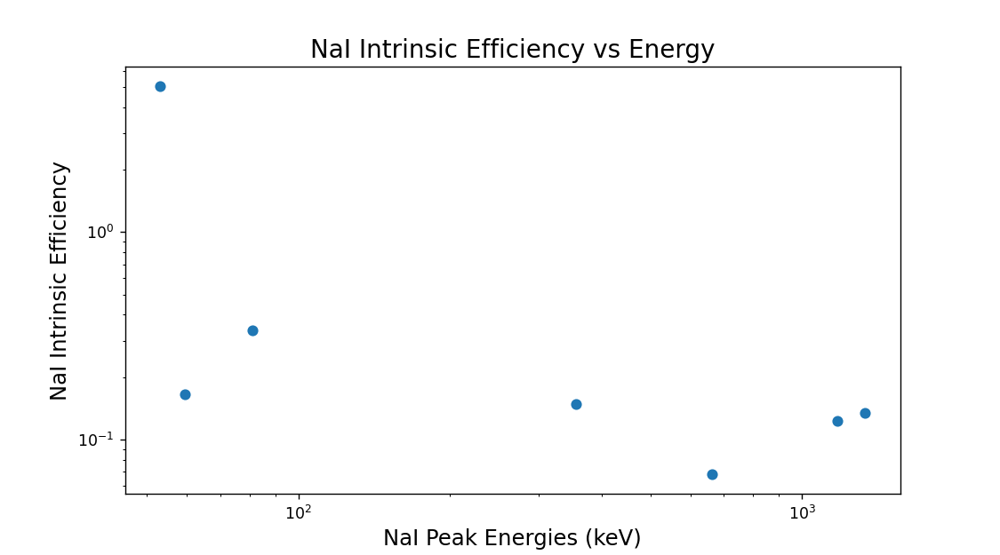

In [619]:
NaI_abs_eff, NaI_intr_eff = plot_efficiencies("NaI", NaI_Am_result, NaI_Ba_result, NaI_Co_result, NaI_Cs_result)

In [542]:
NaI_abs_eff

[0.00418026183229986,
 0.127698686893918,
 0.008444093219647337,
 0.003727111435279976,
 0.0031112574892059367,
 0.0033786287647805243,
 0.0017076165331399301]

In [543]:
NaI_intr_eff

[0.165873121251901,
 5.067094030138728,
 0.33506228908018454,
 0.14789207753606456,
 0.12345494408157975,
 0.13406425751500628,
 0.06775835955171154]

In [612]:
def angle_efficiencies(detector, source_results_array, angle_array):
    """
    hard coded for Americium ONLY that's the source we did angle measurements on
    """
    # Americium has 1 Peak
    # Americium Values
    Am241_SA = 11.16 #microCurie
    Am241_HL = 432.2

    # Detector Diameter (from Datasheets)
    BGO_r = 2*2.54 # cm circular
    NaI_r = 2*2.54 # cm circular BUT NOT FROM CORRECT BIT OF DATASHEET
    CdTe_r = 3/10 # cm square

    # Detector Surface Area (cm**2)
    BGO_area = np.pi*(BGO_r**2)
    NaI_area = np.pi*(NaI_r**2)
    CdTe_area = CdTe_r**2

    # Source Distance to Detector (from Eris's measurements)
    BGO_d = 15 #cm
    NaI_d = 16 #cm
    CdTe_d = 10 #cm

    # Years since December 1st 1979 till Oct 21st (BGO) Oct 28th (NaI) and Nov 4 (CdTe)
    from datetime import datetime

    # Google Gemini generated code I turned into a function
    # (was going to just google: how long since __ but this is nicer)
    def how_long_yrs(date0, date1):
        from datetime import datetime
        # Calculate the difference
        difference = date1 - date0
        # Extract the years
        years = difference.days / 365
        
        return years

    # When we ran each detector
    date_start = datetime(1979, 12, 1)
    date_BGO = datetime(2025, 10, 21)
    date_NaI = datetime(2025, 10, 28)
    date_CdTe = datetime(2025, 11, 4)

    years_BGO = how_long_yrs(date_start, date_BGO)
    years_NaI = how_long_yrs(date_start, date_NaI)
    years_CdTe = how_long_yrs(date_start, date_CdTe)

    # Create function that calculates current activity
    def activity_now(init_activity, half_life, time):
        import numpy as np
        
        current_activity = init_activity*np.exp(-(np.log(2)*time)/half_life)
        
        return current_activity

    if "BGO" in detector:
        # Current Activity
        Am_CA = activity_now(Am241_SA, Am241_HL, years_BGO)*37000
        
        # Geometric Factor
        G0 = BGO_area / (4*np.pi*BGO_d**2)

    if "NaI" in detector:
        # Current Activity
        Am_CA = activity_now(Am241_SA, Am241_HL, years_NaI)*37000
        
        # Geometric Factor
        G0 = NaI_area / (4*np.pi*NaI_d**2)
        
    if "CdTe" in detector:
        # Current Activity
        Am_CA = activity_now(Am241_SA, Am241_HL, years_CdTe)*37000
        
        # Geometric Factor
        G0 = CdTe_area / (4*np.pi*CdTe_d**2)
        
    # Index for results array
    i = 0

    # Initialize lists, include direct observation
    #abs_eff_dir, intr_eff_dir = find_efficiencies("BGO", "AM", direct_results)
    abs_eff = []
    intr_eff = []

    for angle in angle_array:
        # Peak Total Counts Detected (in cps)
        results = source_results_array[i]
        Am_counts = results[0].params['amplitude'].value
        
        # Geometric Factor with Angle
        if angle == 90:
            G0_ang = G0
        else:
            G0_ang = np.cos((angle*np.pi)/180)*G0

        # Emmission Fraction
        Am_em_frac = 0.3578

        # Absolute Efficiency
        Am_abs_eff = Am_counts / (Am_CA * Am_em_frac)
        abs_eff.append(Am_abs_eff)

        # Intrinsic Efficiency
        Am_intr_eff = Am_counts / (Am_CA * G0_ang * Am_em_frac)
        intr_eff.append(Am_intr_eff)

        i += 1

    # Plot Angle vs Efficiencies
    fig, ax = plt.subplots(figsize=(9,5))
    #ax.scatter(angle_array, abs_eff, linestyle = "-")
    plt.plot(angle_array, abs_eff, '-o')
    ax.set_xticks(np.arange(0,100,10))
    plt.xlabel(f'{detector} Detector Angle off Normal (deg)', fontsize=14)
    plt.ylabel(f'{detector} Absolute Efficiency', fontsize=14)
    plt.title(f'{detector} Americium Absolute Efficiency vs Angle', fontsize=16)
    plt.savefig(f"{detector}_angle_abs_eff.png")

    fig, ax = plt.subplots(figsize=(9,5))
    #ax.scatter(angle_array, intr_eff,linestyle = "-")
    plt.plot(angle_array, intr_eff, '-o')
    ax.set_xticks(np.arange(0,100,10))
    plt.xlabel(f'{detector} Detector Angle off Normal (deg)', fontsize=14)
    plt.ylabel(f'{detector} Intrinsic Efficiency', fontsize=14)
    plt.title(f'{detector} Americium Intrinsic Efficiency vs Angle', fontsize=16)
    plt.savefig(f"{detector}_angle_intr_eff.png")
    
    return abs_eff, intr_eff

In [545]:
CdTe_Am15 = "CdTe_Am_15.mca"
CdTe_Am30 = "CdTe_Am_30.mca"
CdTe_Am45 = "CdTe_Am_45.mca"
CdTe_Am60 = "CdTe_Am_60.mca"
CdTe_Am90 = "CdTe_Am_90.mca"

<IPython.core.display.Javascript object>


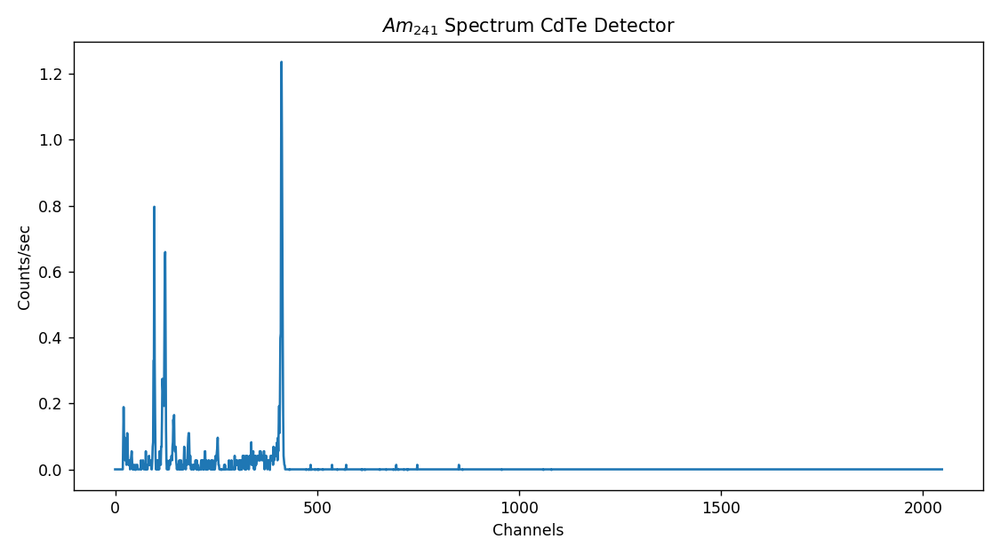

In [546]:
CdTe_Am15_headers, CdTe_Am15_channels, CdTe_Am15_counts, CdTe_Am15_minus_bkg = plot_CdTe_spectra(CdTe_bkg_file, CdTe_Am15)

<IPython.core.display.Javascript object>


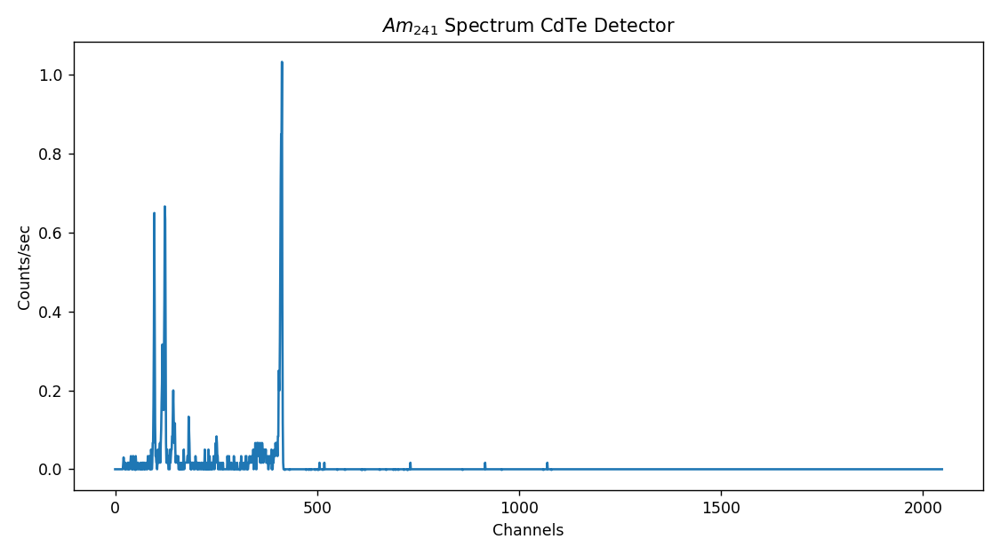

In [547]:
CdTe_Am30_headers, CdTe_Am30_channels, CdTe_Am30_counts, CdTe_Am30_minus_bkg = plot_CdTe_spectra(CdTe_bkg_file, CdTe_Am30)

<IPython.core.display.Javascript object>


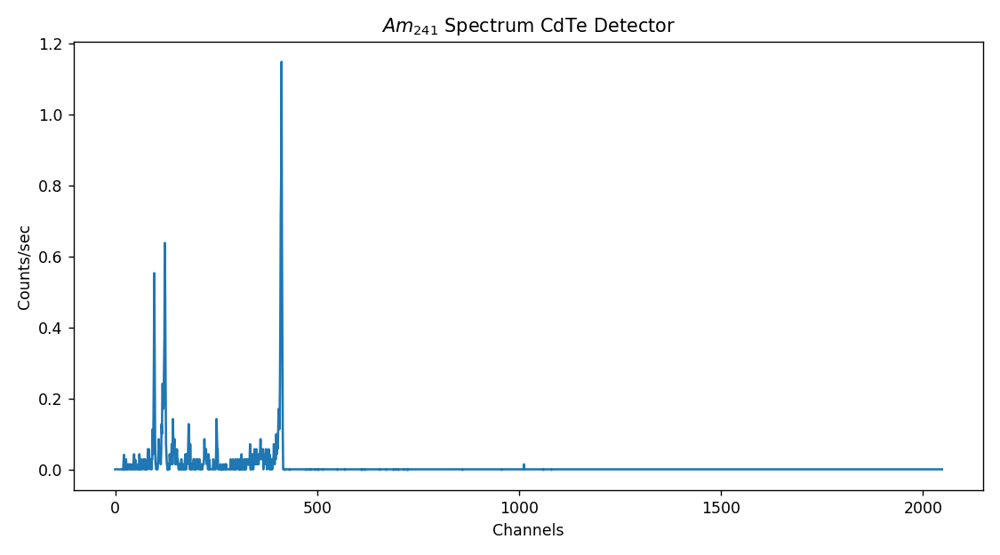

In [548]:
CdTe_Am45_headers, CdTe_Am45_channels, CdTe_Am45_counts, CdTe_Am45_minus_bkg = plot_CdTe_spectra(CdTe_bkg_file, CdTe_Am45)

<IPython.core.display.Javascript object>


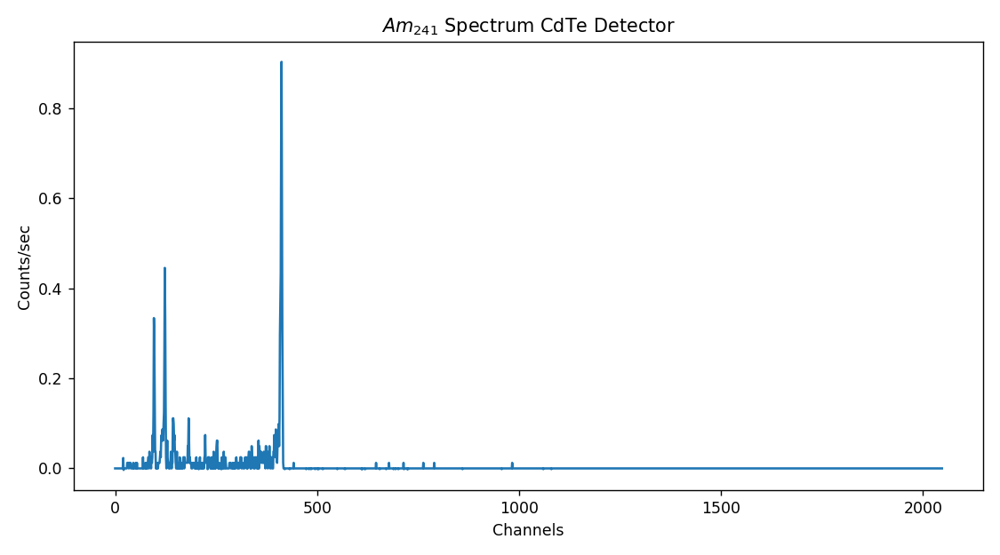

In [549]:
CdTe_Am60_headers, CdTe_Am60_channels, CdTe_Am60_counts, CdTe_Am60_minus_bkg = plot_CdTe_spectra(CdTe_bkg_file, CdTe_Am60)

<ipython-input-488-1f9e8b6be524>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(9, 5))


<IPython.core.display.Javascript object>


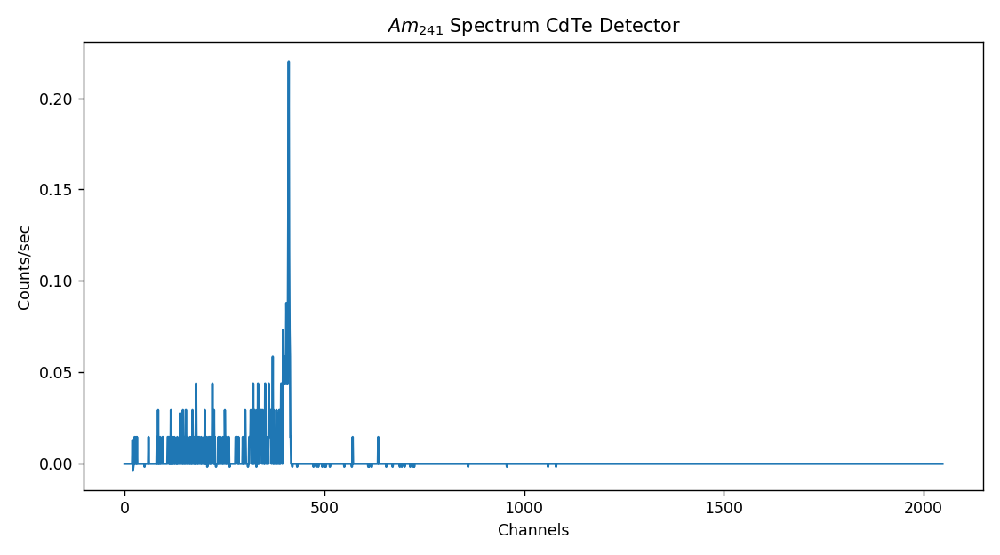

In [550]:
CdTe_Am90_headers, CdTe_Am90_channels, CdTe_Am90_counts, CdTe_Am90_minus_bkg = plot_CdTe_spectra(CdTe_bkg_file, CdTe_Am90)

<IPython.core.display.Javascript object>


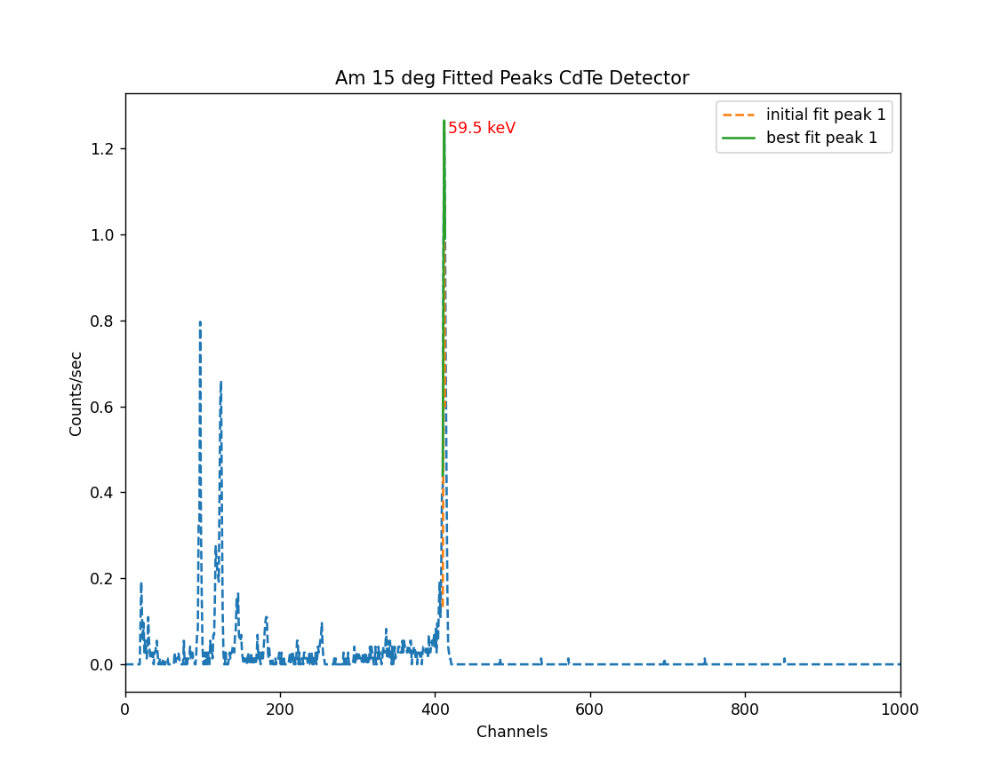

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [551]:
CdTe_Am15_result, CdTe_Am15_centroids, CdTe_Am15_centroid_error, CdTe_Am15_fwhm, CdTe_Am15_fwhm_error = fitting_peaks_CdTe(CdTe_Am15_channels, CdTe_Am15_counts, 2, 2, 1.0, None, "Am 15 deg", 1000)

<IPython.core.display.Javascript object>


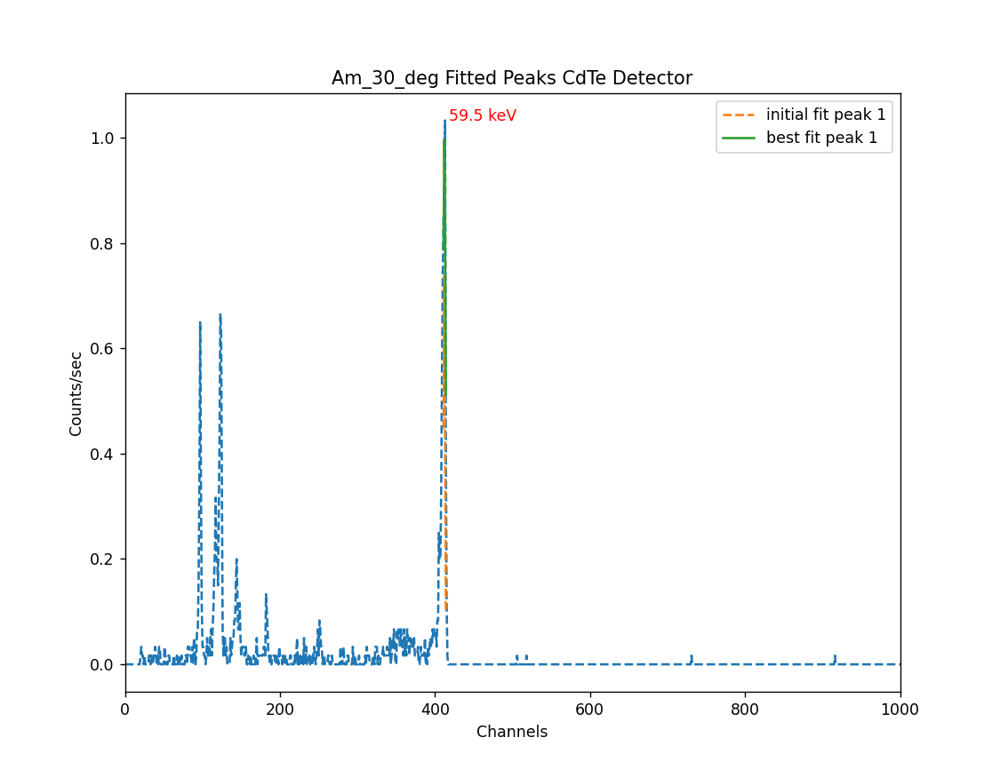

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [552]:
CdTe_Am30_result, CdTe_Am30_centroids, CdTe_Am30_centroid_error, CdTe_Am30_fwhm, CdTe_Am30_fwhm_error = fitting_peaks_CdTe(CdTe_Am30_channels, CdTe_Am30_counts, 2, 2, 1.0, None, "Am_30_deg", 1000)

<IPython.core.display.Javascript object>


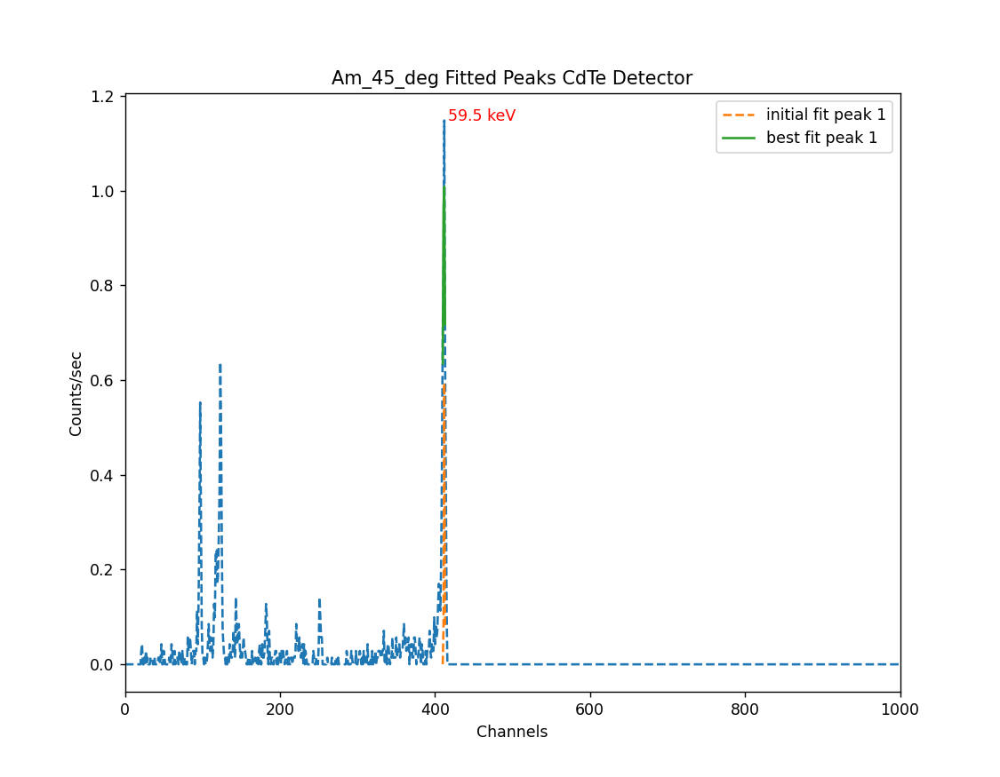

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [553]:
CdTe_Am45_result, CdTe_Am45_centroids, CdTe_Am45_centroid_error, CdTe_Am45_fwhm, CdTe_Am45_fwhm_error = fitting_peaks_CdTe(CdTe_Am45_channels, CdTe_Am45_counts, 2, 2, 1.0, None, "Am_45_deg", 1000)

<IPython.core.display.Javascript object>


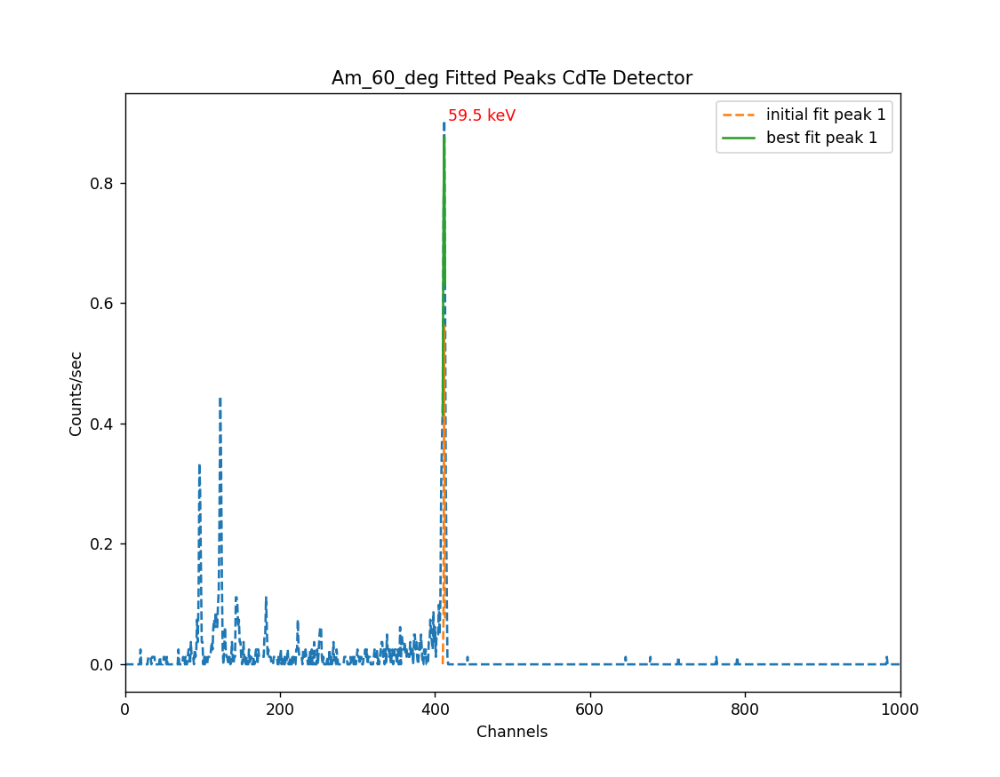

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [554]:
CdTe_Am60_result, CdTe_Am60_centroids, CdTe_Am60_centroid_error, CdTe_Am60_fwhm, CdTe_Am60_fwhm_error = fitting_peaks_CdTe(CdTe_Am60_channels, CdTe_Am60_counts, 2, 2, 0.8, None, "Am_60_deg", 1000)

<IPython.core.display.Javascript object>


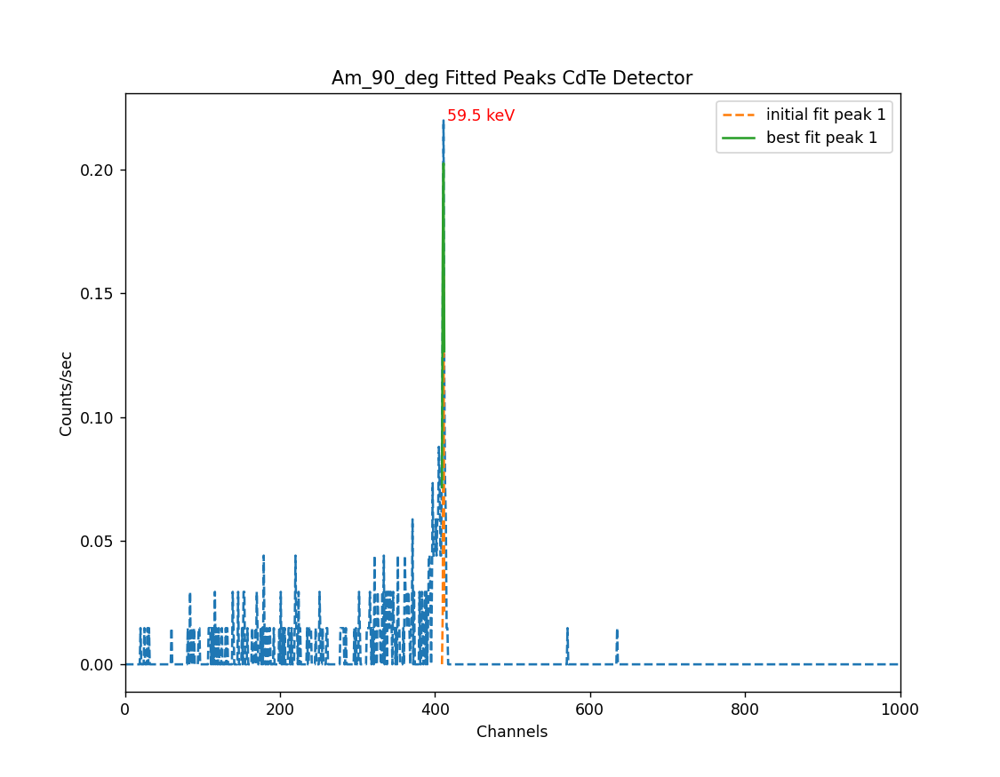

C:\ProgramData\Anaconda3\lib\site-packages\uncertainties\core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


In [555]:
CdTe_Am90_result, CdTe_Am90_centroids, CdTe_Am90_centroid_error, CdTe_Am90_fwhm, CdTe_Am90_fwhm_error = fitting_peaks_CdTe(CdTe_Am90_channels, CdTe_Am90_counts, 2, 2, 0.2, None, "Am_90_deg", 1000)

In [556]:
angles_array = [0, 15, 30, 45, 60, 90]
source_results_array = [CdTe_Am_result, CdTe_Am15_result, CdTe_Am30_result, CdTe_Am45_result, CdTe_Am60_result, CdTe_Am90_result]

<IPython.core.display.Javascript object>


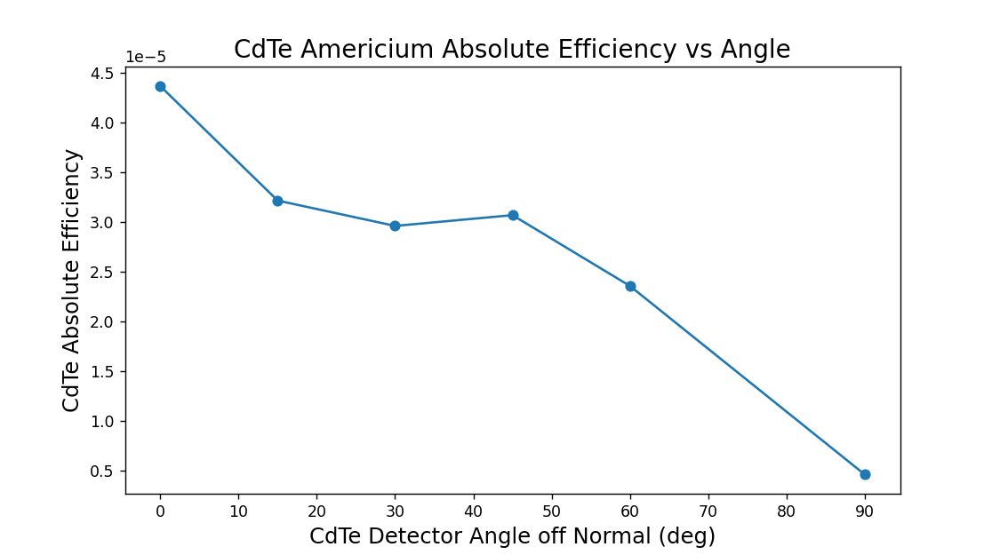

<IPython.core.display.Javascript object>


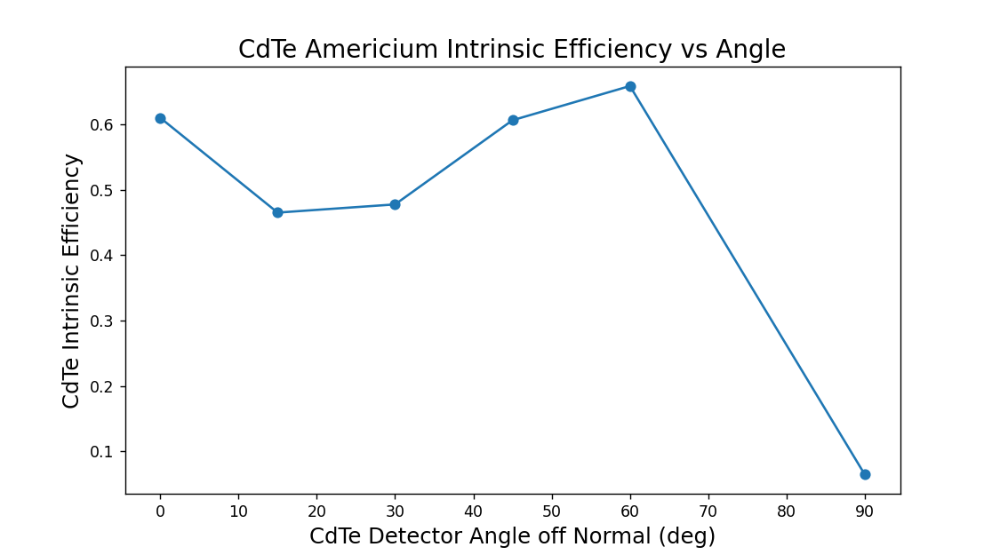

In [610]:
CdTe_abs_eff, CdTe_intr_eff = angle_efficiencies("CdTe", source_results_array, angles_array)

In [605]:
BGO_result_array = [BGO_Am_result, BGO_Am15_result, BGO_Am30_result, BGO_Am45_result, BGO_Am60_result, BGO_Am90_result]

<IPython.core.display.Javascript object>


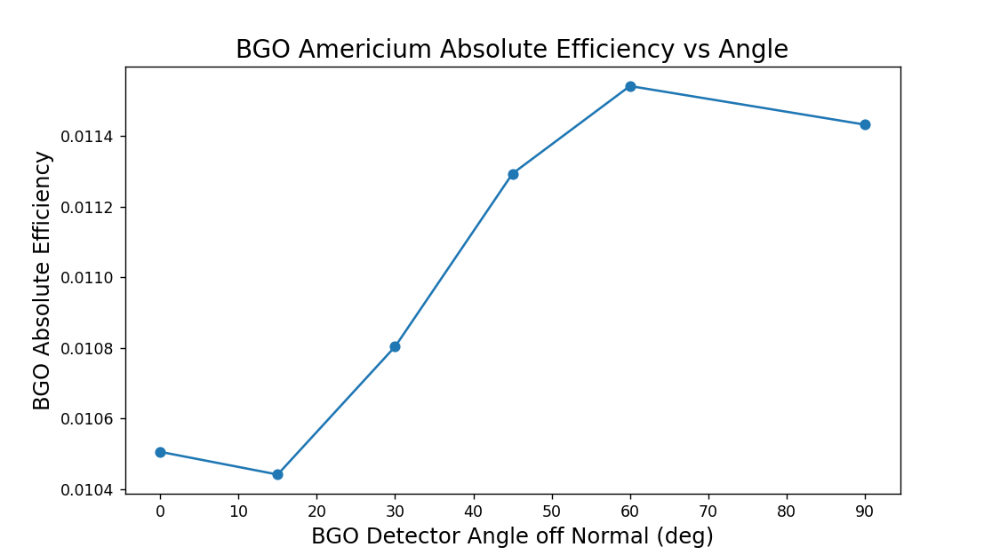

<IPython.core.display.Javascript object>


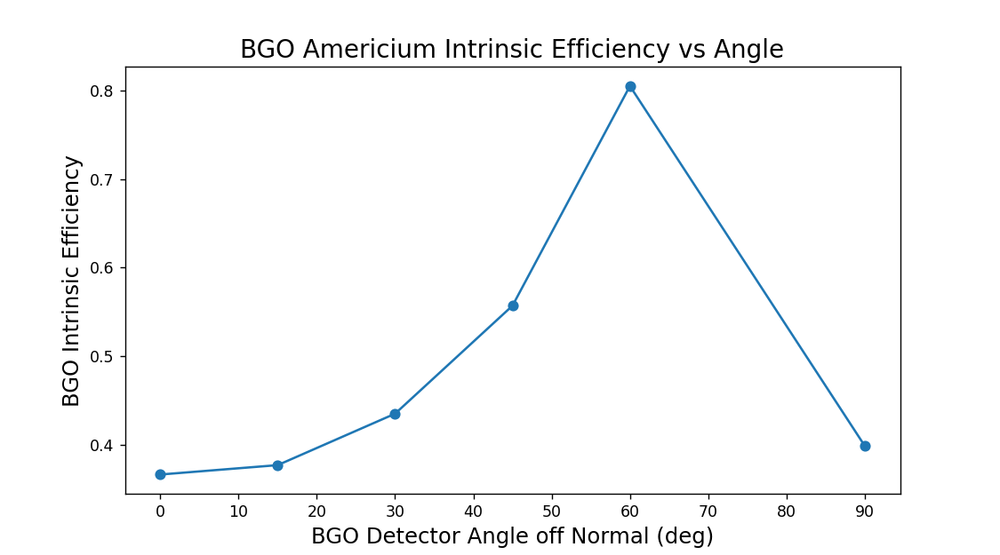

In [611]:
BGO_abs_eff, BGO_intr_eff = angle_efficiencies("BGO", BGO_result_array, angles_array)

In [608]:
NaI_results_array = [NaI_Am_result, NaI_Am15_result, NaI_Am30_result, NaI_Am45_result, NaI_Am60_result, NaI_Am90_result]

<IPython.core.display.Javascript object>


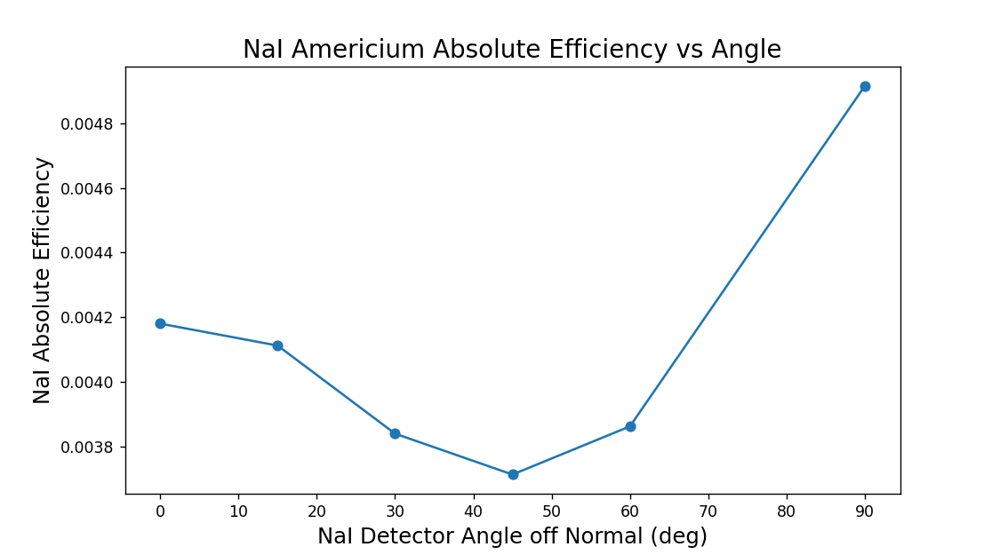

<IPython.core.display.Javascript object>


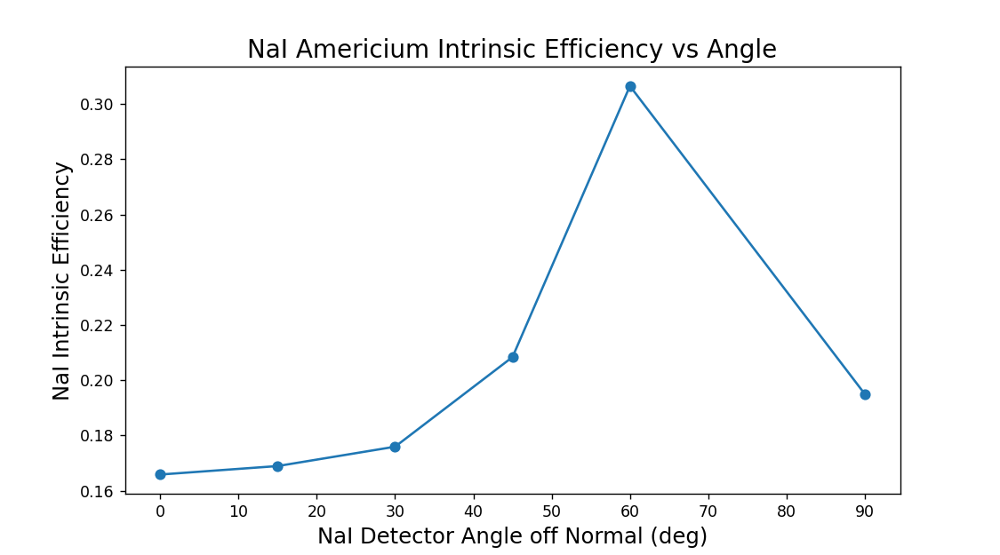

In [613]:
NaI_abs_eff, NaI_intr_eff = angle_efficiencies("NaI", NaI_results_array, angles_array)